In [113]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import mrjob as mr


### Homework 5

Copy this notebook. Rename it as: YOURNAME-HW4-mapreduce-XX

with your name replacing YOURNAME and the xx replaced with the date you submit or copy this HW.

Upload your completed jupyter notebook to elearning site as your homework submission. Do not put this notebook on your github.

Do all the homeworks problems below:
As noted doing the homework gets a 3 out of 5. Extension of homework to to implement an TD-IDF algorithm  (see below)

Use the data/bible+shakes.nonpunc.txt file as the source of you analysis in this homework

##Homework 5.1
 A bigram is the combination of words.  Find the 10 most common bigrams from the text.  Order counts in the bigram combination for example "in the" is not the same bigram as "the in"



In [116]:
%%writefile code\MRWordBigramCount2.py
from mrjob.job import MRJob
from mrjob.step import MRStep

class MRWordBigramCount2(MRJob):
    
    def steps(self):
        return [
            MRStep(mapper=self.mapper,
                  combiner = self.combiner,
                  reducer=self.reducer),
            MRStep(reducer=self.reducer_top10)
        ]

    def mapper(self, _, line):                  
        line = line.lower().split()                        
        for words in zip(line, line[1:]):        
            yield list((words[0], words[1])), 1   
            
    def combiner(self, bigram, counts):
        yield bigram, sum(counts)                
                               
    def reducer(self, bigram, counts):           
        yield None, (bigram, sum(counts))
                   
    def reducer_top10(self, _, bigram_count):
        for i in sorted(bigram_count, key=lambda x:x[1], reverse=True)[:10]:
                 yield i

            
if __name__ == '__main__':
    MRWordBigramCount2.run() 

Overwriting code\MRWordBigramCount2.py


In [115]:
%run code/MRWordBigramCount2.py  data/bibleshakes.nopunc.txt

No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configu

Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...
INFO:mrjob.runner:Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000\output...


["of","the"]	13037
["and","the"]	7034
["the","lord"]	7017
["in","the"]	6738
["to","the"]	3799
["i","will"]	3470
["and","he"]	3020
["shall","be"]	3013
["all","the"]	2714
["i","have"]	2666


Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount2.alifa.20181008.154607.998000...
Removing temp direc

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.20181008.154607.998000\\step\\000\\cache\\MRWordBigramCount2.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.201

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.20181008.154607.998000\\step\\000\\cache\\MRWordBigramCount2.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.201

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.20181008.154607.998000\\step\\000\\cache\\MRWordBigramCount2.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount2.alifa.201

In [9]:
%run code/MRWordBigramCount0.py  data/bibleshakes.nopunc.txt

No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
No configs specified for inline runner
Running step 1 of 1...
Running step 1 of 1...
Running step 1 of 1...
Running step 1 of 1...
Running step 1 of 1...
Running step 1 of 1...
Running step 1 of 1...
Running ste

a-again	1
a-an	1
a-apology	1
a-b	1
a-babbled	1
a-babbler	1
a-babbling	1
a-babe	8
a-baboon	3
a-baby	5
a-bachelor	14
a-back	3
a-backbiting	1
a-backfriend	1
a-backsliding	1
a-backward	1
a-bad	10
a-bade	1
a-badge	2
a-bag	6
a-baggage	1
a-bagpiper	1
a-bailiff	1
a-bait	2
a-baker	1
a-balance	2
a-bald	2
a-ball	3
a-ballad	6
a-balladmaker	1
a-band	17
a-bang	1
a-banish	7
a-banished	4
a-bank	9
a-bankrupt	2
a-banner	2
a-banquet	11
a-banquetingroom	2
a-baptism	1
a-bar	3
a-barbarian	3
a-barbarous	2
a-barbary	3
a-barber	5
a-bard	2
a-bare	3
a-bareboned	1
a-barefoot	1
a-bareribb	1
a-barful	1
a-bargain	6
a-barge	2
a-bark	6
a-barne	1
a-barrel	1
a-barren	5
a-barrenspirited	1
a-base	10
a-baseness	1
a-baser	3
a-basilisk	1
a-basin	1
a-basket	18
a-bason	1
a-bastard	22
a-bat	1
a-bated	1
a-batfowling	1
a-bath	2
a-battery	2
a-battle	11
a-battlement	1
a-bauble	2
a-bawbling	1
a-bawcock	1
a-bawd	25
a-bawdy	3
a-bawdyhouse	2
a-bay	8
a-be	5
a-beacon	3
a-beadle	2
a-beagle	1
a-beam	5
a-bear	22
a-bearbaiting	1
a-beard	11
a

a-havior	1
a-hawk	3
a-hazard	1
a-head	19
a-headborough	1
a-headless	2
a-headstall	1
a-headstrong	2
a-heady	2
a-health	7
a-healthful	2
a-heap	4
a-hearer	1
a-hearing	1
a-hearse	1
a-heart	39
a-heartbreaking	1
a-hearty	1
a-heath	4
a-heathen	1
a-heaven	4
a-heavenkissing	1
a-heavenly	7
a-heavier	3
a-heaviness	1
a-heavy	28
a-heavyhanging	1
a-hedge	2
a-hedgeborn	1
a-heed	1
a-heinous	1
a-helen	1
a-hell	8
a-hellbroth	1
a-hellhound	1
a-help	1
a-helper	1
a-helpful	1
a-hempen	1
a-hen	3
a-herald	16
a-hercules	1
a-herd	2
a-herdsman	1
a-here	1
a-hermit	1
a-hermitage	1
a-hero	1
a-herod	1
a-herring	1
a-hey	8
a-hideous	4
a-high	7
a-higher	2
a-highway	4
a-highwrought	1
a-hilding	3
a-hill	8
a-hind	2
a-hint	1
a-hired	1
a-history	1
a-hit	1
a-ho	4
a-hobbyhorse	1
a-hodgepudding	1
a-hog	1
a-hogshead	3
a-hole	9
a-holiday	5
a-holiness	1
a-hollow	6
a-holy	23
a-home	1
a-homeborn	1
a-homely	4
a-homicide	1
a-hooded	1
a-hoop	3
a-hope	5
a-hopeful	1
a-hopeless	1
a-horn	6
a-horned	1
a-horrible	1
a-horrid	1
a-horse	34
a-h

a-swallow	3
a-swallowing	2
a-swan	3
a-swanlike	1
a-swarm	1
a-swarthy	1
a-swashing	1
a-swearing	1
a-sweat	1
a-sweep	1
a-sweeping	1
a-sweet	71
a-sweeter	4
a-sweetfaced	1
a-sweetsmelling	1
a-swift	5
a-swifter	1
a-swine	3
a-sword	63
a-sworder	1
a-sworn	1
a-sycamore	2
a-sycomore	1
a-syllable	1
a-sympathy	2
a-synagogue	2
a-syracusian	1
a-syrian	1
a-syrophenician	1
a-t	1
a-tabernacle	6
a-table	13
a-tabour	4
a-tabret	2
a-tackled	1
a-tail	4
a-tailor	8
a-tainted	1
a-taking	1
a-talbot	4
a-tale	14
a-talebearer	5
a-talent	13
a-talker	2
a-talking	1
a-tall	7
a-taller	1
a-tame	3
a-tang	1
a-tangled	1
a-tanner	4
a-taper	5
a-taphouse	1
a-tapster	7
a-tardy	1
a-target	1
a-tartar	1
a-taste	6
a-tatter	1
a-taunt	2
a-taunting	1
a-tavern	6
a-tawdrylace	1
a-tawny	1
a-teacher	7
a-teaching	1
a-team	1
a-tear	15
a-tearing	1
a-tedious	8
a-teil	1
a-temperance	1
a-tempest	14
a-tempestuous	2
a-temple	3
a-temporary	1
a-tench	2
a-tender	8
a-tenderness	1
a-tenement	1
a-tent	9
a-tenth	8
a-tentimesbarr	1
a-term	1
a-terrible	

absalom-said	4
absalom-sent	3
absalom-spake	2
absalom-stole	1
absalom-take	1
absalom-that	1
absalom-the	4
absalom-there	1
absalom-this	1
absalom-thy	2
absalom-to	3
absalom-unto	1
absalom-well	1
absalom-went	2
absalom-which	1
absalom-while	1
absalom-whom	1
absalom-would	1
absence-all	1
absence-and	1
absence-at	1
absence-been	1
absence-did	1
absence-doth	1
absence-for	1
absence-from	1
absence-he	1
absence-is	2
absence-let	1
absence-make	1
absence-makes	1
absence-now	1
absence-of	12
absence-only	1
absence-pray	1
absence-seem	1
absence-sir	1
absence-soon	1
absence-sour	1
absence-such	1
absence-sweet	1
absence-that	1
absence-thence	1
absence-there	1
absence-to	1
absence-took	1
absence-valiant	1
absence-was	1
absence-well	1
absence-what	2
absence-wherein	1
absence-work	1
absent-after	1
absent-am	1
absent-and	1
absent-argument	1
absent-bring	1
absent-child	1
absent-duke	3
absent-friends	1
absent-from	4
absent-grief	1
absent-have	1
absent-hence	1
absent-hours	1
absent-i	1
absent-in	3
absent-ki

adriana-the	1
adriana-then	1
adriana-there	1
adriana-this	2
adriana-to	2
adriana-unfeeling	1
adriana-villain	1
adriana-what	3
adriana-where	1
adriana-which	1
adriana-why	3
adriana-wife	1
adriana-with	1
adriana-within	2
adriano-de	112
adriatic-seas	1
adriel-the	2
aducking-we	1
adullam-and	4
adullam-one	1
adullam-socoh	1
adullam-the	1
adullamite-to	1
adullamite-whose	1
adulterate-beast	1
adulterate-blot	1
adulterate-death	1
adulterate-eyes	1
adulterate-hastings	1
adulterate-heart	1
adulterates-hourly	1
adulterer-and	2
adulterer-waiteth	1
adulterers-an	1
adulterers-and	2
adulterers-as	1
adulterers-by	1
adulterers-for	1
adulterers-god	1
adulterers-nor	1
adulterers-or	1
adulteress-according	1
adulteress-but	1
adulteress-for	1
adulteress-i	1
adulteress-shall	1
adulteress-though	1
adulteress-will	1
adulteresses-and	2
adulteresses-know	1
adulteries-and	1
adulteries-fornications	2
adulteries-from	1
adulteries-will	1
adulterous-and	1
adulterous-antony	1
adulterous-generation	2
adulterous-thief	1

ahuzzath-one	1
ai-an	1
ai-and	9
ai-but	1
ai-enseigne	1
ai-for	1
ai-gagne	1
ai-he	1
ai-in	1
ai-is	1
ai-looked	1
ai-now	1
ai-on	2
ai-or	1
ai-saw	1
ai-see	1
ai-smote	1
ai-they	1
ai-two	1
ai-were	1
ai-which	2
aiah-and	2
aiah-the	1
aiah-took	1
aiah-whom	1
aiath-he	1
aid-and	1
aid-as	1
aid-but	1
aid-doth	1
aid-for	2
aid-hath	1
aid-him	1
aid-me	3
aid-my	2
aid-of	4
aid-out	1
aid-she	1
aid-that	1
aid-the	3
aid-thee	2
aid-them	1
aid-to	1
aid-when	1
aid-wherein	1
aid-whereof	1
aid-which	1
aid-you	1
aid-your	1
aidance-gainst	1
aidance-of	1
aidant-and	1
aided-him	1
aided-to	1
aiding-hand	1
aidless-came	1
aids-incertain	1
aids-themselves	1
aij-oublie	1
aija-and	1
aijalon-and	3
aijalon-in	1
aijalon-who	1
aijalon-with	2
ail-that	1
ailed-thee	1
ailest-thou	1
aileth-the	1
aileth-thee	6
aim-a	1
aim-and	3
aim-aright	1
aim-at	6
aim-awhile	1
aim-before	1
aim-better	1
aim-but	1
aim-d	7
aim-had	1
aim-he	1
aim-might	1
aim-move	1
aim-not	1
aim-of	4
aim-or	2
aim-reports	1
aim-said	1
aim-seems	1
aim-st	1
aim-ther

all-while	1
all-whites	1
all-who	2
all-whole	3
all-whores	1
all-whose	5
all-why	1
all-wicked	1
all-widestretched	1
all-will	13
all-willingly	1
all-willingness	2
all-winds	3
all-windsor	1
all-winnows	1
all-wisdom	6
all-with	23
all-wither	2
all-within	4
all-without	1
all-women	5
all-wonder	1
all-words	3
all-work	1
all-workers	2
all-works	1
all-worths	1
all-would	3
all-wound	1
all-wrong	1
all-wrought	1
all-ye	51
all-yea	1
all-yet	8
all-you	22
all-your	118
all-yours	2
all-yourself	1
all-zealous	1
alla-nostra	1
alla-stoccata	1
allabhorred-war	1
alladmiring-with	1
allalas-what	1
allamazed-the	1
allay-d	2
allay-nothing	1
allay-or	1
allay-the	3
allay-them	1
allay-this	1
allay-those	1
allay-thy	1
allay-with	1
allaying-both	1
allayment-could	1
allayments-to	1
allays-the	1
allbuilding-law	1
allchanging-word	1
allcheering-sun	1
alldisgraced-friend	1
alldreaded-thunderstone	1
alleating-shame	1
allegation-if	1
allegations-to	1
allege-do	1
allege-no	1
alleged-reasons	1
allegiance-a	1
allegiance-and	2

am-sorry	46
am-sought	1
am-sound	1
am-sped	1
am-spoil	1
am-sprited	1
am-stabb	1
am-stale	1
am-standing	1
am-starved	1
am-stern	1
am-stiff	1
am-stifled	2
am-still	4
am-strong	2
am-strongframed	1
am-struck	3
am-stuffed	1
am-stung	1
am-subdued	2
am-subject	1
am-subtle	1
am-such	2
am-sudden	1
am-sufficed	1
am-sunburnt	1
am-supposed	1
am-sure	74
am-surprised	1
am-sworn	5
am-taken	1
am-tame	1
am-tempted	1
am-thane	2
am-thankful	1
am-that	12
am-the	262
am-thee	1
am-their	6
am-then	2
am-thence	1
am-there	3
am-therefore	2
am-therewith	1
am-thine	5
am-thinking	3
am-thirsty	1
am-this	4
am-thither	2
am-thoroughly	1
am-thou	1
am-though	1
am-thought	1
am-thus	4
am-thwarted	1
am-thy	29
am-tied	2
am-to	32
am-today	1
am-toiling	1
am-too	23
am-tormented	1
am-tossed	1
am-touch	1
am-tranio	1
am-transformed	1
am-trinculobe	1
am-troubled	3
am-true	1
am-truest	1
am-truly	2
am-trusted	1
am-two	1
am-unarm	1
am-understanding	1
am-undisposed	1
am-undone	7
am-unfit	1
am-unfortunate	1
am-unking	1
am-unlearn	1
am-u

and-adaiah	5
and-adalia	1
and-adam	13
and-adamah	1
and-adami	1
and-adbeel	2
and-add	3
and-added	2
and-adder	2
and-addeth	1
and-additions	1
and-address	1
and-ader	1
and-adiel	1
and-adieu	1
and-adithaim	1
and-adjoin	1
and-admah	1
and-admirable	2
and-admiration	1
and-admire	1
and-admired	2
and-admiring	1
and-admonish	1
and-admonishing	1
and-admonition	1
and-adonibezek	1
and-adonijah	6
and-adoniram	2
and-adonis	1
and-adoraim	1
and-adoram	1
and-adore	2
and-adored	1
and-adorn	1
and-adullam	2
and-adulterers	2
and-adulteresses	1
and-adulterous	2
and-advance	1
and-advanced	1
and-advantage	1
and-adventure	1
and-adventured	1
and-adventurous	1
and-advice	1
and-advise	2
and-aemilia	1
and-aeneas	1
and-aesculapius	1
and-afeard	2
and-affability	1
and-affable	2
and-affairs	4
and-affect	1
and-affectedly	1
and-affecting	1
and-affection	2
and-afflict	3
and-afflicted	5
and-affliction	1
and-afflictions	2
and-affrighted	1
and-afoot	1
and-aforetime	1
and-afraid	1
and-after	148
and-afterdinner	1
and-afterward	

and-drink	76
and-drinketh	7
and-drinking	16
and-drinks	3
and-drive	8
and-driven	2
and-drives	2
and-driveth	1
and-driving	1
and-dromedaries	1
and-dromio	10
and-drop	9
and-drought	1
and-drove	5
and-drown	11
and-drowned	1
and-drowse	1
and-drowsiness	1
and-drowsy	2
and-drum	2
and-drums	2
and-drunk	6
and-drunken	3
and-drunkenly	1
and-drunkenness	2
and-dry	6
and-dub	2
and-duchess	1
and-duck	1
and-dudgeon	1
and-due	4
and-duke	6
and-dukedom	1
and-dukes	1
and-dulcimer	2
and-dull	12
and-duller	1
and-dulleyed	1
and-duly	1
and-dumah	3
and-dumain	4
and-dumb	6
and-dumbdiscoursive	1
and-dumbly	1
and-duncan	1
and-dung	1
and-dungeons	1
and-dupp	1
and-durst	5
and-dusky	2
and-dust	5
and-duteous	1
and-duty	13
and-dwarfish	1
and-dwell	23
and-dwelled	1
and-dwellers	1
and-dwellest	3
and-dwelt	49
and-dying	5
and-e	3
and-each	12
and-ear	1
and-earl	3
and-early	3
and-earnestly	1
and-earns	1
and-earrings	2
and-ears	11
and-earth	52
and-earthen	1
and-earthly	3
and-earthquakes	1
and-ease	5
and-east	1
and-eastward	4


and-lysander	1
and-lysanias	1
and-lystra	1
and-maacah	1
and-maachah	2
and-maachathi	1
and-maachathites	1
and-maarath	1
and-maaseiah	8
and-maasiai	1
and-macbeth	1
and-macduff	1
and-mace	2
and-machination	1
and-machir	3
and-mad	1
and-madai	2
and-madam	10
and-made	187
and-madest	5
and-madly	3
and-madmannah	1
and-madmen	2
and-madness	4
and-magnanimous	1
and-magnified	3
and-magnify	2
and-magog	3
and-mahalah	1
and-mahalaleel	2
and-mahanaim	2
and-mahath	1
and-mahazioth	1
and-mahlon	2
and-mahu	1
and-maid	1
and-maiden	3
and-maidenhead	1
and-maidens	5
and-maidhood	1
and-maids	1
and-maidservants	4
and-main	2
and-maine	7
and-mainly	1
and-maintain	9
and-majesty	10
and-make	276
and-maker	1
and-makes	37
and-makest	12
and-maketh	21
and-making	9
and-makkedah	1
and-malcham	1
and-malchiah	2
and-malchiel	2
and-malchijah	2
and-malchishua	3
and-malcontents	1
and-malice	2
and-malmsey	1
and-mammon	2
and-mamre	1
and-man	16
and-manacle	1
and-manaen	1
and-manage	3
and-manahath	2
and-manasseh	19
and-manasses	1
an

and-severity	2
and-severn	1
and-sew	1
and-sexes	1
and-sexton	1
and-seymour	1
and-shaalabbin	1
and-shaaph	1
and-shabbethai	2
and-shachia	1
and-shackles	1
and-shade	1
and-shades	1
and-shadow	3
and-shadows	1
and-shaharaim	1
and-shahazimah	1
and-shake	10
and-shaken	2
and-shakes	3
and-shall	432
and-shallow	3
and-shallum	5
and-shalt	80
and-shamariah	1
and-shame	14
and-shamed	2
and-shameful	1
and-shamefully	1
and-shameless	2
and-shames	1
and-shamma	1
and-shammai	1
and-shamsherai	1
and-shape	4
and-shapes	1
and-shapham	1
and-shaphan	8
and-shaphat	2
and-sharaim	1
and-share	1
and-sharezer	2
and-sharon	2
and-sharp	2
and-sharpens	1
and-sharper	1
and-sharuhen	1
and-shaul	4
and-shave	1
and-shaved	3
and-shavsha	1
and-she	409
and-sheal	1
and-sheariah	2
and-shearjashub	1
and-sheathe	2
and-sheathed	1
and-sheba	4
and-shebam	1
and-shebaniah	1
and-shebna	8
and-shebuel	1
and-shecaniah	1
and-shechaniah	1
and-shechem	7
and-shed	7
and-sheep	13
and-shegod	1
and-shehariah	1
and-shelah	3
and-shelemiah	3
and-shelep

angel-how	1
angel-husband	1
angel-i	1
angel-in	4
angel-is	5
angel-knowledge	1
angel-link	1
angel-nor	1
angel-of	94
angel-on	2
angel-or	2
angel-poured	6
angel-proclaiming	1
angel-s	3
angel-said	5
angel-saying	1
angel-shall	4
angel-shalt	1
angel-she	1
angel-should	1
angel-sings	1
angel-sounded	7
angel-spake	3
angel-standing	1
angel-stood	1
angel-stretched	1
angel-that	15
angel-then	1
angel-thrust	1
angel-to	4
angel-took	2
angel-touched	1
angel-unto	3
angel-wakes	1
angel-went	2
angel-when	1
angel-whereby	1
angel-which	9
angel-whiteness	1
angel-whom	1
angel-with	2
angel-yet	1
angellike-he	1
angellike-perfection	1
angelo-a	3
angelo-admit	1
angelo-always	1
angelo-and	8
angelo-answer	1
angelo-aside	2
angelo-at	1
angelo-be	1
angelo-believe	1
angelo-belike	1
angelo-benefactors	1
angelo-by	1
angelo-came	2
angelo-charges	1
angelo-come	1
angelo-condemn	1
angelo-deputy	1
angelo-did	1
angelo-dispose	1
angelo-dukes	1
angelo-escalus	2
angelo-even	2
angelo-for	1
angelo-from	1
angelo-go	2
angelo-good	1


any-price	1
any-priest	2
any-prince	2
any-princess	1
any-print	1
any-private	3
any-profit	1
any-promise	1
any-prophet	1
any-proportion	1
any-provide	1
any-purblind	1
any-qualities	1
any-quarrel	1
any-question	3
any-ransom	1
any-ravenous	1
any-reason	1
any-reasonable	1
any-rebel	1
any-regarding	1
any-religion	1
any-remaining	2
any-remembrance	1
any-rest	1
any-resting	1
any-resurrection	1
any-retirement	1
any-rites	1
any-rock	1
any-room	1
any-root	1
any-rose	1
any-run	1
any-s	1
any-safety	1
any-salute	1
any-say	1
any-scath	1
any-scathe	1
any-scot	1
any-scruple	3
any-secret	2
any-seed	1
any-seeth	1
any-sense	1
any-sensual	1
any-sequestration	1
any-service	2
any-shall	2
any-shape	2
any-she	1
any-ship	1
any-shores	1
any-should	3
any-shoulder	1
any-show	2
any-shut	1
any-sick	2
any-side	1
any-sign	1
any-silk	1
any-sin	3
any-single	1
any-size	1
any-slain	1
any-slander	1
any-slight	1
any-slips	1
any-so	2
any-soil	1
any-soldier	1
any-solemn	1
any-son	4
any-sons	1
any-sore	1
any-sorrow	1
any-sort

are-marvellous	3
are-marvellously	1
are-masked	1
are-master	1
are-masters	2
are-matched	1
are-may	1
are-means	1
are-measured	1
are-med	1
are-meet	2
are-melted	1
are-members	3
are-memories	1
are-men	21
are-mended	1
are-merciful	2
are-mercy	1
are-mere	1
are-merely	2
are-merriest	1
are-merry	3
are-messengers	1
are-met	5
are-metamorphosed	1
are-midway	1
are-mighty	8
are-minded	1
are-mine	21
are-minished	1
are-ministers	1
are-minutes	2
are-misled	1
are-mistaken	1
are-misthought	1
are-mistress	1
are-mock	2
are-moe	1
are-moistened	1
are-monsters	1
are-more	33
are-mortal	1
are-mortised	1
are-moses	1
are-most	19
are-motheaten	1
are-motives	1
are-moulded	2
are-mouldy	1
are-mounted	1
are-moveable	1
are-moved	4
are-much	8
are-muleters	1
are-multiplied	4
are-mum	1
are-murdered	1
are-murderers	1
are-murmurers	1
are-music	1
are-mute	1
are-my	83
are-naked	2
are-named	2
are-natural	2
are-nature	2
are-naught	2
are-nay	1
are-near	12
are-necessary	1
are-needful	1
are-neither	1
are-never	6
are-new	2
are-ne

art-snared	1
art-so	17
art-some	1
art-sound	1
art-spoiled	1
art-stall	1
art-standing	1
art-still	1
art-straightway	1
art-stronger	1
art-suborn	1
art-sure	3
art-swift	1
art-sworn	2
art-tainted	1
art-taken	4
art-tender	1
art-terrible	1
art-that	4
art-the	57
art-their	2
art-then	2
art-thence	1
art-there	3
art-therefore	1
art-thine	1
art-this	2
art-thou	336
art-thought	1
art-thus	3
art-thy	3
art-thyself	3
art-timon	1
art-to	19
art-too	14
art-tormented	1
art-troubled	1
art-true	5
art-turn	1
art-twice	2
art-two	1
art-uncolted	1
art-unconfirmed	1
art-undone	1
art-unmindful	1
art-unpaid	1
art-unsure	1
art-unto	1
art-uproused	1
art-very	3
art-vile	1
art-violently	1
art-waking	1
art-ware	1
art-waxen	1
art-wearied	2
art-wedded	1
art-weighed	1
art-welcome	2
art-well	1
art-what	1
art-when	1
art-which	1
art-whoe	1
art-wholly	1
art-why	1
art-wicked	1
art-will	1
art-willing	1
art-wipe	1
art-wise	2
art-wiser	1
art-with	5
art-witness	1
art-womantired	1
art-wont	1
art-worst	2
art-worth	1
art-worthy	6
art

aside-my	3
aside-nay	2
aside-no	3
aside-nobility	1
aside-nor	1
aside-not	1
aside-now	4
aside-o	11
aside-one	2
aside-or	2
aside-out	5
aside-peace	1
aside-perish	1
aside-plantagenet	1
aside-poor	1
aside-praise	1
aside-pray	3
aside-privately	2
aside-quickly	2
aside-scarce	1
aside-shall	1
aside-she	4
aside-short	1
aside-shot	1
aside-simonides	1
aside-sit	1
aside-so	4
aside-some	1
aside-still	1
aside-that	8
aside-the	20
aside-their	1
aside-then	2
aside-therefrom	1
aside-these	2
aside-they	3
aside-this	4
aside-thither	1
aside-thou	2
aside-though	2
aside-thy	1
aside-tis	3
aside-to	123
aside-too	1
aside-true	1
aside-twere	1
aside-two	1
aside-unto	2
aside-very	1
aside-villain	1
aside-well	3
aside-were	1
aside-what	7
aside-wherefore	1
aside-why	2
aside-with	1
aside-wormwood	1
aside-yes	1
aside-you	3
aside-your	1
asin-love	1
ask-a	6
ask-abishag	1
ask-advice	1
ask-after	1
ask-again	3
ask-agrippa	1
ask-alms	1
ask-amiss	1
ask-an	1
ask-and	6
ask-antony	1
ask-any	2
ask-are	1
ask-at	1
ask-barabbas	1
as

authority-abused	1
authority-allow	1
authority-and	7
authority-be	1
authority-bears	1
authority-close	1
authority-commandeth	1
authority-dear	1
authority-doest	3
authority-for	1
authority-from	3
authority-having	2
authority-he	1
authority-here	1
authority-how	1
authority-i	6
authority-if	1
authority-in	2
authority-is	1
authority-let	1
authority-melts	1
authority-of	4
authority-over	4
authority-shall	1
authority-so	2
authority-surfeits	1
authority-that	1
authority-the	1
authority-though	1
authority-to	5
authority-under	1
authority-upon	3
authority-where	1
authority-which	1
authority-with	2
authorized-by	1
authorized-king	1
authorized-youth	1
authorizing-thy	1
authors-faithfully	1
authors-of	3
authors-say	1
autolycus-a	4
autolycus-adieu	1
autolycus-after	1
autolycus-age	1
autolycus-and	3
autolycus-are	1
autolycus-aside	4
autolycus-ay	1
autolycus-beseech	1
autolycus-exchange	1
autolycus-five	1
autolycus-get	1
autolycus-ha	1
autolycus-he	1
autolycus-here	3
autolycus-how	1
autolycus-i	12
au

barak-the	3
barak-to	1
barak-up	1
barak-went	1
barbara-prithee	1
barbarian-and	2
barbarian-scythian	1
barbarian-slave	1
barbarian-unto	1
barbarians-both	1
barbarians-saw	1
barbariansas-they	1
barbarism-and	1
barbarism-itself	1
barbarism-making	1
barbarism-spoke	1
barbarous-and	2
barbarous-beastly	1
barbarous-brawl	1
barbarous-caves	1
barbarous-do	1
barbarous-goths	1
barbarous-had	1
barbarous-ignorance	1
barbarous-intimation	1
barbarous-licence	1
barbarous-moor	2
barbarous-most	1
barbarous-multitudes	1
barbarous-people	2
barbarous-scythian	1
barbarous-tamora	1
barbarous-villains	1
barbary-and	1
barbary-cockpigeon	1
barbary-hen	1
barbary-horse	1
barbary-horses	1
barbary-sir	1
barbary-tell	1
barbason-well	1
barbason-you	1
barbed-irons	1
barbed-steeds	1
barber-d	1
barber-s	8
barber-shall	1
barbermonger-draw	1
bard-of	1
bard-sentence	1
barded-steeds	1
bardolph-a	1
bardolph-am	1
bardolph-an	2
bardolph-and	17
bardolph-are	1
bardolph-as	1
bardolph-at	1
bardolph-away	2
bardolph-ay	2
bardolph-ba

be-fain	2
be-faint	3
be-fainthearted	1
be-fair	7
be-fairer	1
be-faith	1
be-faithful	3
be-fall	1
be-fallen	1
be-false	16
be-famed	1
be-familiar	1
be-famines	2
be-famish	1
be-famous	2
be-fantastic	1
be-far	12
be-fashion	1
be-fashioned	1
be-fast	1
be-fastened	1
be-fat	8
be-father	2
be-fatherless	1
be-faultless	1
be-favourable	3
be-fear	7
be-feared	7
be-fearful	2
be-fed	6
be-fee	1
be-feeble	2
be-feebled	1
be-feigned	1
be-fellowheirs	1
be-fellowhelpers	1
be-fellows	1
be-felt	3
be-fenced	1
be-fetch	1
be-fetched	1
be-few	5
be-fickle	2
be-fidele	1
be-fie	1
be-fifteen	2
be-fifty	4
be-fill	2
be-filled	34
be-filleted	1
be-filthy	1
be-find	1
be-fine	2
be-fingering	1
be-finished	3
be-fire	1
be-firm	2
be-first	11
be-fit	5
be-fitted	2
be-five	3
be-fixed	1
be-flatter	1
be-flattered	1
be-flayed	2
be-fled	1
be-flesh	1
be-flouted	1
be-flouting	1
be-foes	1
be-foiled	1
be-folden	1
be-follow	1
be-followed	1
be-followers	2
be-fond	2
be-food	1
be-fools	1
be-for	91
be-forbid	1
be-forbidden	1
be-forbod	1
be-for

beast-these	1
beast-they	2
beast-thou	3
beast-throughout	1
beast-to	6
beast-touch	1
beast-until	1
beast-was	7
beast-whereof	1
beast-which	7
beast-who	1
beast-whose	1
beast-why	1
beast-will	2
beast-with	3
beast-without	1
beast-you	1
beastliest-sense	1
beastlike-and	1
beastliness-that	1
beastly-ambition	1
beastly-and	1
beastly-creature	2
beastly-dumb	1
beastly-fault	1
beastly-feeder	1
beastly-fury	1
beastly-in	1
beastly-knave	1
beastly-madbrain	1
beastly-mind	1
beastly-savage	1
beastly-shameless	1
beastly-she	1
beastly-sort	1
beastly-subtle	1
beastly-touches	1
beastly-villains	1
beasts-also	1
beasts-among	1
beasts-and	33
beasts-another	1
beasts-are	1
beasts-at	1
beasts-bear	1
beasts-beside	1
beasts-came	1
beasts-did	1
beasts-drink	1
beasts-even	1
beasts-fell	1
beasts-from	1
beasts-full	1
beasts-gave	1
beasts-get	1
beasts-give	1
beasts-go	1
beasts-groan	1
beasts-had	1
beasts-he	1
beasts-i	1
beasts-in	5
beasts-indeed	1
beasts-let	1
beasts-made	1
beasts-may	1
beasts-might	1
beasts-most	1
be

began-ahab	1
began-ahaziah	1
began-also	1
began-and	1
began-as	1
began-at	4
began-azariah	1
began-baasha	1
began-both	1
began-but	1
began-elah	1
began-every	1
began-from	1
began-he	4
began-her	1
began-hoshea	1
began-in	2
began-it	1
began-jehoash	1
began-jesus	1
began-jotham	1
began-men	1
began-menahem	1
began-moses	1
began-omri	1
began-on	1
began-rudely	1
began-st	1
began-t	1
began-that	1
began-the	2
began-they	1
began-this	3
began-thus	1
began-to	158
began-was	1
began-who	1
began-zerubbabel	1
begar-and	1
begat-a	2
begat-abia	1
begat-abishua	1
begat-abitub	1
begat-abiud	1
begat-abram	2
begat-achaz	1
begat-achim	1
begat-ahimaaz	1
begat-ahitub	2
begat-ahumai	1
begat-alemeth	2
begat-almodad	2
begat-amariah	2
begat-aminadab	1
begat-amminadab	2
begat-amon	1
begat-amram	1
begat-anub	1
begat-aram	1
begat-arphaxad	2
begat-asa	1
begat-azariah	4
begat-azor	1
begat-bela	1
begat-bethrapha	1
begat-bezaleel	1
begat-binea	2
begat-boaz	2
begat-booz	1
begat-bukki	1
begat-cainan	2
begat-children	2
begat

bench-but	1
bench-by	1
bench-in	1
bench-o	1
bench-this	1
benched-and	1
bencher-in	1
benches-after	1
benches-of	1
benchholes-i	1
bend-again	2
bend-against	1
bend-and	1
bend-doth	1
bend-her	3
bend-his	3
bend-it	1
bend-like	1
bend-low	1
bend-makes	1
bend-my	4
bend-no	1
bend-not	1
bend-now	1
bend-one	1
bend-such	1
bend-the	4
bend-their	7
bend-thine	1
bend-thoughts	1
bend-thy	3
bend-to	2
bend-under	1
bend-up	2
bend-we	2
bend-with	1
bend-you	2
bend-your	2
bended-be	1
bended-hook	1
bended-knee	1
bended-knees	1
bended-sword	1
bended-their	1
bendeth-his	1
bendeth-let	1
bending-all	1
bending-angels	1
bending-author	1
bending-crest	1
bending-down	2
bending-forward	1
bending-head	1
bending-his	1
bending-knee	2
bending-of	1
bending-peers	1
bending-sickle	1
bending-their	1
bending-to	1
bending-twigs	1
bending-unto	1
bends-adornings	1
bends-her	1
bends-with	1
bene-intelligo	1
bene-say	1
beneath-abhorring	1
beneath-all	1
beneath-and	3
beneath-bethel	1
beneath-blood	1
beneath-for	1
beneath-him	2
beneat

bid-butler	1
bid-by	1
bid-cassio	1
bid-come	1
bid-em	2
bid-every	1
bid-fair	1
bid-false	1
bid-farewell	5
bid-follow	1
bid-for	2
bid-forth	1
bid-gloucester	1
bid-go	1
bid-god	2
bid-good	8
bid-helen	1
bid-her	21
bid-herself	1
bid-him	46
bid-himah	1
bid-his	4
bid-it	4
bid-kings	1
bid-like	1
bid-me	53
bid-mine	1
bid-my	14
bid-nestor	1
bid-nicander	1
bid-our	1
bid-report	1
bid-salisbury	1
bid-sorrow	1
bid-st	4
bid-suspicion	1
bid-that	2
bid-the	31
bid-thee	25
bid-them	35
bid-there	1
bid-these	1
bid-this	1
bid-those	1
bid-thou	1
bid-thy	6
bid-time	1
bid-to	5
bid-us	9
bid-welcome	1
bid-ye	1
bid-you	31
bid-your	4
bidden-behold	1
bidden-come	1
bidden-go	1
bidden-he	1
bidden-him	3
bidden-now	1
bidden-of	2
bidden-shall	1
bidden-to	1
bidden-were	1
bidden-when	1
bidden-which	1
biddeth-him	1
bidding-and	1
bidding-brutus	1
bidding-farewell	1
bidding-good	1
bidding-he	1
bidding-hence	1
bidding-make	1
bidding-me	2
bidding-of	3
bidding-or	1
bidding-serve	1
bidding-shall	1
bidding-strike	1
bidding-task	1

blown-from	1
blown-his	2
blown-in	1
blown-jack	1
blown-lads	1
blown-me	1
blown-out	4
blown-overboard	1
blown-rose	1
blown-sails	1
blown-shall	1
blown-surmises	1
blown-that	1
blown-the	1
blown-this	2
blown-tide	1
blown-to	2
blown-unto	1
blown-up	4
blown-with	4
blown-youth	1
blows-a	3
blows-and	5
blows-are	2
blows-at	1
blows-blood	1
blows-despising	1
blows-doubly	1
blows-dust	1
blows-fair	1
blows-for	1
blows-have	2
blows-here	1
blows-him	1
blows-his	1
blows-i	3
blows-in	2
blows-is	1
blows-it	2
blows-malicious	1
blows-my	1
blows-no	1
blows-of	1
blows-repaid	1
blows-so	1
blows-than	1
blows-that	1
blows-the	4
blows-these	1
blows-twice	1
blows-up	2
blows-upon	2
blows-us	1
blows-what	1
blows-when	1
blows-with	1
blows-you	2
blows-your	1
blowse-you	1
blubbering-and	1
blue-and	39
blue-as	1
blue-blood	1
blue-bow	1
blue-but	1
blue-captains	1
blue-circles	1
blue-clothes	1
blue-coats	3
blue-eye	1
blue-hangings	1
blue-i	1
blue-iris	1
blue-it	1
blue-lace	1
blue-lightning	1
blue-list	1
blue-my	1
blue-o

brain-and	5
brain-as	2
brain-awe	1
brain-being	2
brain-d	1
brain-fuming	1
brain-good	1
brain-he	2
brain-him	2
brain-i	3
brain-in	1
brain-inhearse	1
brain-is	2
brain-little	1
brain-makes	1
brain-may	1
brain-more	2
brain-not	1
brain-of	3
brain-plotproof	1
brain-s	2
brain-so	1
brain-than	1
brain-that	3
brain-the	1
brain-these	1
brain-to	1
brain-turn	1
brain-was	1
brainbut-as	1
brained-like	1
brainish-apprehension	1
brainless-ajax	1
brainpan-had	1
brains-a	2
brains-and	3
brains-are	1
brains-beguiled	1
brains-for	2
brains-forhere	1
brains-hath	1
brains-i	2
brains-if	1
brains-knock	1
brains-no	1
brains-of	3
brains-out	1
brains-piety	1
brains-still	1
brains-ta	1
brains-tears	1
brains-that	1
brains-turn	1
brains-were	2
brains-with	3
brainsick-duchess	1
brainsick-fits	1
brainsick-men	1
brainsick-raptures	1
brainsick-rude	1
brainsick-son	1
brainsickly-of	1
brake-all	1
brake-although	1
brake-and	7
brake-down	14
brake-even	1
brake-every	1
brake-forth	1
brake-from	1
brake-he	1
brake-his	3
brake-in	

broke-bread	2
broke-cross	1
broke-deserve	2
broke-down	1
broke-for	1
broke-from	3
broke-her	1
broke-his	6
broke-i	1
broke-in	2
broke-it	3
broke-loose	2
broke-mine	1
broke-my	5
broke-oath	1
broke-off	2
broke-ope	1
broke-open	1
broke-out	1
broke-s	1
broke-stone	1
broke-the	5
broke-their	6
broke-them	1
broke-this	1
broke-three	1
broke-through	1
broke-thy	1
broke-to	1
broke-under	1
broke-up	1
broke-what	2
broke-with	2
broke-without	1
broke-you	1
broke-your	5
broken-a	1
broken-and	19
broken-are	1
broken-as	1
broken-at	3
broken-bankrupt	1
broken-banquet	1
broken-because	1
broken-bosoms	1
broken-bread	1
broken-but	3
broken-by	5
broken-cisterns	1
broken-coxcomb	1
broken-dead	1
broken-debtors	1
broken-delivery	1
broken-down	21
broken-ears	1
broken-even	1
broken-faith	3
broken-for	3
broken-forth	2
broken-from	3
broken-glass	2
broken-heart	1
broken-her	1
broken-hilt	1
broken-his	4
broken-how	1
broken-i	1
broken-idol	1
broken-implements	1
broken-in	20
broken-it	3
broken-joint	1
broken-limb	2
broke

burthen-reach	1
burthen-time	1
burthen-tis	1
burthen-to	1
burthen-was	1
burthen-whether	1
burthening-grief	1
burthenous-taxations	1
burthens-every	1
burthens-let	1
burthens-may	1
burthens-of	2
burthens-take	1
burton-here	1
burtonheath-by	1
bury-a	1
bury-ajax	1
bury-all	3
bury-back	1
bury-bassianus	1
bury-brotherhood	1
bury-caesar	1
bury-gog	1
bury-her	3
bury-him	11
bury-his	2
bury-honesty	1
bury-in	1
bury-it	4
bury-love	1
bury-me	6
bury-mine	2
bury-my	7
bury-so	1
bury-st	2
bury-strangers	1
bury-that	1
bury-the	3
bury-thee	2
bury-their	3
bury-them	7
bury-therefore	1
bury-thy	4
bury-to	1
bury-with	2
burying-a	1
burying-grave	1
burying-hath	1
burying-in	1
burying-of	1
buryingplace-amongst	1
buryingplace-and	1
buryingplace-by	1
buryingplace-of	2
buryingplace-to	1
buryingplace-with	1
bush-a	1
bush-an	1
bush-and	2
bush-burned	1
bush-for	1
bush-gather	1
bush-god	1
bush-is	1
bush-let	1
bush-like	1
bush-nor	1
bush-of	2
bush-s	1
bush-shall	1
bush-supposed	1
bush-thorough	1
bush-through	1
bush-ti

by-troilus	1
by-troops	1
by-truth	2
by-turn	1
by-turning	2
by-twice	1
by-two	9
by-twoheaded	1
by-twos	2
by-tyranny	2
by-underhand	2
by-understanding	2
by-unions	1
by-unkind	1
by-unresisted	1
by-unrighteousness	1
by-unto	1
by-unwise	1
by-upon	2
by-uproar	1
by-urging	1
by-urim	1
by-us	26
by-using	1
by-usury	1
by-vain	1
by-valour	1
by-vanity	1
by-vaulting	1
by-venus	3
by-very	1
by-viewing	1
by-vile	3
by-villains	3
by-villany	1
by-violence	7
by-violent	1
by-virtue	5
by-voice	1
by-vow	1
by-vows	1
by-vulcan	1
by-wailful	1
by-wailing	1
by-wandering	1
by-waning	1
by-wanting	1
by-war	6
by-wards	1
by-warwick	1
by-wasting	1
by-watching	1
by-water	10
by-watering	1
by-wave	1
by-waves	1
by-way	1
by-wearing	1
by-weary	1
by-weeds	1
by-weight	16
by-welkin	1
by-what	48
by-whatsoever	2
by-when	4
by-whereof	1
by-which	30
by-whilst	1
by-white	1
by-whom	37
by-whoredom	1
by-whose	16
by-wicked	5
by-wickedness	1
by-wilful	1
by-will	2
by-winds	1
by-wine	1
by-wisdom	5
by-wise	1
by-wishing	1
by-wit	3
by-witchcraf

cannot-comprehend	1
cannot-conceive	2
cannot-conclude	1
cannot-condemn	1
cannot-conjure	2
cannot-contain	5
cannot-continue	1
cannot-correct	1
cannot-countervail	1
cannot-cover	1
cannot-creep	1
cannot-cross	1
cannot-cure	2
cannot-daub	1
cannot-deal	1
cannot-declare	1
cannot-defend	1
cannot-defile	1
cannot-deliver	2
cannot-delve	1
cannot-deny	5
cannot-depose	1
cannot-derogate	1
cannot-die	1
cannot-dig	1
cannot-disannul	1
cannot-discern	1
cannot-disinherit	1
cannot-dispraise	1
cannot-distaste	1
cannot-do	19
cannot-draw	2
cannot-dream	1
cannot-drink	3
cannot-drown	1
cannot-easily	1
cannot-eat	1
cannot-endure	5
cannot-enjoy	1
cannot-enough	1
cannot-enter	2
cannot-entertain	1
cannot-entreat	2
cannot-equal	1
cannot-err	3
cannot-escape	1
cannot-express	1
cannot-fail	1
cannot-fast	1
cannot-feed	2
cannot-feel	1
cannot-fence	1
cannot-fetch	1
cannot-fight	4
cannot-find	9
cannot-flatter	4
cannot-flout	1
cannot-fly	2
cannot-for	3
cannot-forget	2
cannot-forgive	1
cannot-from	1
cannot-get	12
cannot-gi

cement-can	1
cement-of	1
cement-their	1
cenchrea-for	1
censer-and	7
censer-full	1
censer-i	1
censer-in	3
censer-two	1
censers-korah	1
censers-of	3
censers-out	1
censers-the	1
censers-thou	1
censers-wherewith	1
censorinus-nobly	1
censure-and	1
censure-but	1
censure-for	1
censure-him	2
censure-in	1
censure-me	3
censure-nor	1
censure-of	4
censure-rash	1
censure-scape	1
censure-take	1
censure-them	1
censure-these	1
censure-thus	1
censure-well	1
censure-what	1
censure-when	1
censure-worse	1
censured-here	1
censured-him	1
censured-that	1
censureo-boys	1
censurers-which	1
censures-falsely	1
censures-in	1
censures-of	1
censuring-rome	1
centaur-and	1
centaur-fetch	1
centaur-to	1
centaur-where	1
centaur-with	1
centaur-you	1
centaurs-feast	1
centaurs-to	1
centre-creep	1
centre-is	1
centre-of	5
centre-out	1
cents-ecus	1
centuries-to	1
centurion-a	1
centurion-and	2
centurion-answered	1
centurion-believed	1
centurion-beseeching	1
centurion-delivered	1
centurion-found	1
centurion-go	1
centurion-he	2


child-was	14
child-waxed	1
child-we	2
child-well	2
child-were	1
child-when	1
child-wherefore	1
child-which	2
child-while	1
child-who	1
child-whom	1
child-whose	1
child-will	2
child-with	3
child-worse	1
child-wronging	1
child-ye	1
child-your	1
childa-dumb	1
childbearing-if	1
childbed-died	1
childbed-hast	1
childbed-privilege	1
childchanged-father	1
childed-as	1
childhood-and	1
childhood-i	1
childhood-innocence	1
childhood-of	1
childhood-proof	1
childhood-unto	1
childhoods-and	1
childing-autumn	1
childish-bow	1
childish-drops	1
childish-error	1
childish-fear	1
childish-fist	1
childish-friendliness	1
childish-humour	1
childish-pity	1
childish-things	1
childish-treble	1
childish-weakness	1
childishfoolish-for	1
childishness-and	1
childishness-can	1
childishness-will	1
childless-a	1
childless-among	1
childless-and	1
childless-so	1
childlike-duty	1
childlike-office	1
childness-cures	1
children-abide	1
children-abroad	1
children-after	8
children-alive	2
children-all	2
children-also	7
children

cleopatra-kneels	1
cleopatra-know	1
cleopatra-lead	1
cleopatra-led	1
cleopatra-let	3
cleopatra-lord	1
cleopatra-make	1
cleopatra-mine	1
cleopatra-most	1
cleopatra-my	4
cleopatra-nay	6
cleopatra-no	4
cleopatra-noblest	1
cleopatra-none	1
cleopatra-nor	1
cleopatra-not	2
cleopatra-o	14
cleopatra-pardon	1
cleopatra-peace	1
cleopatra-perchance	1
cleopatra-pray	2
cleopatra-prithee	1
cleopatra-promise	1
cleopatra-queen	1
cleopatra-quick	1
cleopatra-rememberest	1
cleopatra-rogue	1
cleopatra-s	12
cleopatra-saw	1
cleopatra-say	2
cleopatra-see	2
cleopatra-seek	1
cleopatra-sent	1
cleopatra-sink	1
cleopatra-sir	2
cleopatra-sleep	1
cleopatra-so	2
cleopatra-soften	1
cleopatra-sole	1
cleopatra-some	2
cleopatra-sooth	1
cleopatra-take	1
cleopatra-that	6
cleopatra-the	3
cleopatra-there	1
cleopatra-they	1
cleopatra-think	1
cleopatra-this	4
cleopatra-thou	5
cleopatra-though	1
cleopatra-tis	2
cleopatra-to	2
cleopatra-too	1
cleopatra-was	1
cleopatra-we	1
cleopatra-well	4
cleopatra-what	10
cleopatra-when	1
cle

comes-too	10
comes-toward	1
comes-towards	1
comes-troilus	1
comes-two	1
comes-under	1
comes-upon	4
comes-warwick	1
comes-weeping	1
comes-well	2
comes-what	1
comes-when	2
comes-where	1
comes-with	12
comes-withal	1
comes-yonder	3
comes-york	1
comes-young	1
comes-your	9
comesone-of	1
comest-and	1
comest-anoint	1
comest-bring	1
comest-in	4
comest-into	3
comest-nigh	2
comest-not	2
comest-thither	2
comest-thou	23
comest-thus	1
comest-thy	1
comest-to	14
comest-unto	2
comest-with	1
comet-i	1
comet-of	1
comet-or	1
comet-she	1
cometh-a	5
cometh-according	1
cometh-after	3
cometh-against	3
cometh-also	1
cometh-among	1
cometh-and	18
cometh-andronicus	1
cometh-any	1
cometh-as	3
cometh-at	2
cometh-before	1
cometh-behold	1
cometh-betwixt	1
cometh-bread	1
cometh-but	3
cometh-by	1
cometh-charles	1
cometh-contention	1
cometh-cruel	1
cometh-down	5
cometh-envy	1
cometh-first	1
cometh-for	2
cometh-forth	8
cometh-from	12
cometh-go	1
cometh-harvest	1
cometh-he	7
cometh-hither	1
cometh-home	1
cometh-immediatel

conrade-yea	1
conrade-yes	2
conrade-you	1
cons-state	1
consanguineous-am	1
conscience-also	2
conscience-and	13
conscience-are	1
conscience-before	1
conscience-being	1
conscience-bids	1
conscience-buckled	1
conscience-conscience	1
conscience-do	1
conscience-does	2
conscience-enter	1
conscience-find	1
conscience-firm	1
conscience-first	1
conscience-flies	1
conscience-from	1
conscience-hath	1
conscience-he	3
conscience-hold	1
conscience-how	1
conscience-i	4
conscience-in	3
conscience-is	6
conscience-knows	1
conscience-la	1
conscience-lack	1
conscience-let	1
conscience-make	1
conscience-my	2
conscience-now	4
conscience-of	5
conscience-put	1
conscience-sake	5
conscience-say	1
conscience-says	2
conscience-seal	1
conscience-seared	1
conscience-sinks	1
conscience-sir	2
conscience-still	2
conscience-swords	1
conscience-take	2
conscience-tells	2
conscience-that	4
conscience-the	2
conscience-their	1
conscience-there	1
conscience-thinktell	1
conscience-this	1
conscience-thou	1
conscience-to	5
cons

could-afflict	1
could-afford	1
could-all	2
could-almost	1
could-an	1
could-anger	1
could-answer	2
could-any	1
could-arrive	1
could-as	1
could-at	1
could-away	1
could-be	30
could-bear	4
could-beat	2
could-beauty	1
could-beguile	1
could-behold	1
could-best	1
could-better	1
could-bid	1
could-bind	1
could-brain	1
could-brook	1
could-burn	1
could-but	7
could-by	1
could-carry	2
could-come	4
could-command	1
could-communities	1
could-conceive	1
could-control	3
could-cry	1
could-cupid	1
could-deal	1
could-death	1
could-declare	1
could-deem	1
could-deliver	3
could-despise	1
could-devise	2
could-dig	1
could-discern	1
could-display	1
could-distinguish	2
could-disunite	1
could-divide	1
could-do	14
could-draw	2
could-drive	2
could-else	1
could-endure	2
could-entertain	1
could-equal	1
could-err	1
could-ever	4
could-fancy	1
could-fetch	1
could-fight	1
could-find	16
could-fly	1
could-for	2
could-force	1
could-forget	1
could-frame	3
could-free	1
could-from	1
could-get	3
could-give	4
could-gnaw	1
could-g

cromwell-o	1
cromwell-of	1
cromwell-please	1
cromwell-presently	1
cromwell-servant	1
cromwell-that	1
cromwell-the	2
cromwell-tis	1
cromwell-to	1
cromwell-why	1
cromwell-would	1
cromwell-yes	1
crook-d	3
crook-the	1
crookback-here	1
crookback-prodigy	1
crookback-rather	1
crookbackt-or	1
crooked-age	1
crooked-and	2
crooked-beak	1
crooked-cannot	1
crooked-churlish	1
crooked-curls	1
crooked-elipses	1
crooked-face	1
crooked-figure	1
crooked-fortune	1
crooked-generation	1
crooked-in	1
crooked-knife	1
crooked-malice	1
crooked-old	1
crooked-paths	1
crooked-places	1
crooked-serpent	2
crooked-shall	2
crooked-smokes	1
crooked-swart	1
crooked-things	1
crooked-titles	1
crooked-ways	1
crookedpated-old	1
crookknee-d	1
crop-a	1
crop-at	1
crop-if	1
crop-off	1
crop-the	1
crop-their	1
crop-to	1
crop-with	1
cropear-is	1
cropp-d	8
cropped-off	1
crops-the	1
crosby-place	3
cross-and	8
cross-any	1
cross-blue	1
cross-by	1
cross-ceased	1
cross-d	19
cross-daily	1
cross-despising	1
cross-devil	1
cross-em	1
cross-h

d-user	1
d-usurpation	1
d-valentine	1
d-valour	1
d-vengeance	1
d-venom	1
d-verge	1
d-vestal	1
d-vexeth	1
d-villain	3
d-villains	1
d-vincentio	1
d-vine	1
d-violets	1
d-virtues	1
d-voice	1
d-walls	1
d-war	1
d-was	4
d-waters	1
d-ways	1
d-we	6
d-weapons	1
d-wed	1
d-weed	1
d-weeds	1
d-weeping	2
d-welcome	1
d-well	6
d-wench	1
d-were	2
d-what	11
d-when	6
d-where	5
d-wherein	1
d-which	5
d-while	1
d-whitehall	1
d-who	3
d-whom	1
d-whore	3
d-whose	1
d-why	1
d-widow	1
d-wife	2
d-wild	1
d-will	1
d-wings	2
d-wisdom	1
d-wit	1
d-witch	1
d-with	263
d-withal	5
d-within	3
d-without	2
d-woe	4
d-woman	1
d-womb	1
d-wombs	1
d-wondering	1
d-words	3
d-workman	1
d-world	1
d-worm	1
d-worse	1
d-would	4
d-wound	1
d-wrong	1
d-wrongfully	2
d-ye	2
d-years	3
d-yet	12
d-yoke	1
d-you	52
d-young	2
d-your	32
d-yours	1
d-yourself	2
d-youth	7
dabareh-with	1
dabbasheth-and	1
dabbled-in	1
daberath-and	1
daberath-with	1
dace-be	1
dad-in	1
daedalus-my	1
daff-d	3
daff-me	1
daff-t	1
daffed-all	1
daffest-me	1
daffodils-begin	1
dag

daytime-they	1
daywearied-sun	1
daywoman-fare	1
dazzle-all	1
dazzle-mine	1
dazzled-and	1
dazzled-my	1
dazzleth-them	1
dazzling-makes	1
dazzling-so	1
de-arm	3
de-arma	1
de-armado	111
de-batailles	1
de-bilbow	1
de-bless	1
de-bonne	2
de-boys	7
de-burgh	1
de-cassado	1
de-chin	1
de-clock	1
de-coun	3
de-couper	1
de-coward	2
de-de	2
de-dieu	2
de-do	2
de-earl	1
de-elbow	6
de-enemy	1
de-fashion	1
de-feu	1
de-fingres	6
de-foot	3
de-france	5
de-gentlemen	1
de-good	1
de-gud	1
de-hand	6
de-herring	1
de-honest	1
de-ilbow	1
de-jack	2
de-jamany	1
de-jarteer	2
de-jarteerhave	1
de-knight	1
de-la	8
de-lords	1
de-ma	2
de-maid	1
de-mails	1
de-mans	1
de-menton	1
de-moi	1
de-moilet	1
de-nails	7
de-narbon	3
de-neck	1
de-nick	4
de-pardonner	1
de-place	1
de-priest	1
de-princess	1
de-roi	1
de-santrailles	1
de-sessa	1
de-sin	4
de-son	1
de-sot	1
de-temps	1
de-ton	1
de-tongues	1
de-tous	1
de-vorld	1
de-votre	1
de-vous	2
deacon-being	1
deacon-well	1
deacons-be	2
dead-a	5
dead-according	1
dead-alack	1
dead-almost	1
d

delay-they	1
delay-this	1
delay-to	2
delayed-not	1
delayed-to	1
delayeth-his	2
delaying-death	1
delaying-not	1
delays-and	1
delays-as	1
delays-for	1
delays-have	1
delays-my	1
delectable-shapes	1
delectable-things	1
deliberate-a	1
deliberate-fools	1
deliberate-not	1
deliberate-pause	1
deliberate-word	1
delicate-and	1
delicate-ariel	2
delicate-carriages	1
delicate-cheek	1
delicate-cheeks	1
delicate-children	1
delicate-creature	1
delicate-creatures	1
delicate-desires	1
delicate-fiend	1
delicate-fine	1
delicate-his	1
delicate-lethe	1
delicate-lodging	1
delicate-monster	1
delicate-odour	1
delicate-stratagem	1
delicate-tenderness	1
delicate-the	2
delicate-way	1
delicate-wench	1
delicate-woman	2
delicate-wooer	1
delicate-youth	1
delicately-and	1
delicately-are	2
delicately-bringeth	1
delicateness-and	1
delicates-he	1
delicious-banquet	1
delicious-feed	1
delicious-in	1
delicious-poison	1
deliciously-so	1
deliciously-with	1
delight-am	1
delight-and	5
delight-himself	2
delight-his	1
delight-in	3

did-delay	1
did-deliver	1
did-demand	1
did-deny	4
did-derive	1
did-deserve	1
did-desire	5
did-despise	1
did-destroy	1
did-devise	1
did-die	3
did-diligently	1
did-dine	3
did-discharge	1
did-discourse	1
did-disdain	1
did-dislike	1
did-dismount	1
did-display	1
did-displeased	1
did-disrobe	1
did-dissemble	1
did-distribute	1
did-divide	1
did-dote	2
did-drain	1
did-draw	2
did-dream	4
did-drench	1
did-dress	1
did-drink	1
did-drive	1
did-e	1
did-earn	1
did-eat	100
did-echo	1
did-embrace	2
did-employ	1
did-enact	1
did-enchant	1
did-encounter	2
did-end	2
did-endure	2
did-enrich	1
did-enter	1
did-entertain	1
did-entreat	4
did-ephraim	1
did-equal	1
did-ere	1
did-esaias	1
did-escape	1
did-esteem	1
did-ever	13
did-evil	20
did-exceed	1
did-excel	1
did-except	1
did-exchange	1
did-expect	1
did-extort	1
did-fail	1
did-faithful	1
did-fall	2
did-famine	1
did-fan	1
did-fashion	1
did-fast	1
did-fear	3
did-feast	3
did-feed	2
did-feel	2
did-feign	1
did-fight	5
did-find	5
did-first	1
did-fit	1
did-fix	1
did-fl

disparagements-unto	1
dispark-d	1
dispatch-all	1
dispatch-and	1
dispatch-by	1
dispatch-d	17
dispatch-dispatch	1
dispatch-effected	1
dispatch-him	1
dispatch-i	3
dispatch-if	1
dispatch-in	1
dispatch-indeed	1
dispatch-is	1
dispatch-it	3
dispatch-me	3
dispatch-my	1
dispatch-o	2
dispatch-of	2
dispatch-our	1
dispatch-read	1
dispatch-s	1
dispatch-sweet	1
dispatch-the	5
dispatch-them	1
dispatch-this	2
dispatch-tis	1
dispatch-twas	1
dispatch-us	2
dispatch-we	2
dispatch-with	1
dispatch-you	3
dispatched-i	1
dispatched-sixteen	1
dispatcheth-messengers	1
dispensation-for	1
dispensation-may	1
dispensation-of	4
dispense-with	5
dispenses-with	1
disperse-but	1
disperse-em	1
disperse-it	1
disperse-itself	1
disperse-knowledge	1
disperse-ourselves	1
disperse-that	1
disperse-the	1
disperse-thee	1
disperse-them	5
disperse-to	1
disperse-yourselves	3
dispersed-abroad	2
dispersed-air	1
dispersed-already	1
dispersed-among	2
dispersed-and	3
dispersed-are	1
dispersed-by	1
dispersed-he	1
dispersed-of	2
dispersed-s

done-nothing	5
done-now	3
done-of	7
done-offence	1
done-on	4
done-one	1
done-or	2
done-others	1
done-our	5
done-pack	1
done-passing	1
done-penance	1
done-perseverance	1
done-perversely	1
done-possess	1
done-presently	1
done-prince	1
done-quickly	1
done-quoth	1
done-repair	2
done-right	2
done-sacrifice	2
done-saith	4
done-salutation	1
done-saying	1
done-scathe	1
done-see	1
done-shall	6
done-shamefully	1
done-she	4
done-shew	1
done-sin	1
done-since	2
done-sir	4
done-smote	1
done-so	22
done-some	4
done-somewhat	2
done-speaking	3
done-speedily	1
done-spurn	1
done-suddenly	1
done-t	12
done-talking	1
done-tell	1
done-than	1
done-that	26
done-the	17
done-thee	8
done-their	3
done-them	3
done-then	2
done-there	3
done-therefore	1
done-therein	1
done-these	5
done-they	5
done-thirdly	1
done-this	54
done-those	1
done-thou	7
done-though	1
done-three	1
done-thrice	2
done-through	1
done-throw	1
done-thus	5
done-thy	5
done-tis	1
done-to	69
done-today	1
done-tomorrow	1
done-tonight	1
done-too	3
done-tre

drops-the	2
drops-this	1
drops-too	1
drops-upon	3
dropsied-honour	1
dropsies-that	1
dropsy-drown	1
dross-all	1
dross-and	1
dross-behold	1
dross-dust	1
dross-from	1
dross-of	1
dross-therefore	1
dross-thy	1
drought-and	3
drought-consumed	1
drought-i	1
drought-is	1
drought-neither	1
drought-of	1
drought-upon	1
drought-where	1
drove-and	1
drove-asunder	1
drove-away	1
drove-back	2
drove-by	1
drove-him	2
drove-me	1
drove-out	2
drove-the	1
drove-them	3
drove-thence	1
drove-us	1
drove-which	1
droven-them	1
droves-saying	1
drovier-so	1
drown-an	1
drown-beseech	1
drown-consideration	1
drown-d	34
drown-desperate	1
drown-have	1
drown-her	1
drown-him	1
drown-himself	1
drown-in	1
drown-it	1
drown-me	4
drown-men	1
drown-more	1
drown-my	4
drown-myself	3
drown-now	1
drown-one	1
drown-or	1
drown-our	1
drown-the	8
drown-their	2
drown-them	1
drown-themselves	1
drown-this	1
drown-thy	1
drown-thyself	2
drown-you	1
drown-your	1
drowned-a	1
drowned-already	1
drowned-and	3
drowned-as	2
drowned-but	1
drowned-fi

earth-why	1
earth-will	2
earth-with	18
earth-wombs	1
earth-would	2
earth-ye	2
earth-yield	3
earth-you	1
earthbound-root	1
earthdelving-conies	1
earthen-bottle	1
earthen-pitchers	1
earthen-pots	1
earthen-vessel	6
earthen-vessels	2
earthlier-happy	1
earthly-actor	1
earthly-and	1
earthly-audit	1
earthly-author	1
earthly-blessings	1
earthly-dignities	1
earthly-faces	1
earthly-faults	1
earthly-glory	1
earthly-godfathers	1
earthly-honour	1
earthly-house	1
earthly-image	1
earthly-jove	1
earthly-joys	1
earthly-man	1
earthly-mean	1
earthly-mother	1
earthly-no	1
earthly-paragon	2
earthly-parts	1
earthly-pit	1
earthly-power	1
earthly-queens	1
earthly-saint	1
earthly-sensual	1
earthly-sepulchre	1
earthly-sun	1
earthly-thing	1
earthly-things	3
earthly-thou	2
earthly-throne	1
earthly-thunder	1
earthly-tongue	2
earthly-vale	1
earthly-women	1
earthly-world	1
earthquake-a	1
earthquake-and	6
earthquake-but	1
earthquake-for	1
earthquake-in	1
earthquake-like	1
earthquake-now	1
earthquake-of	1
earthquake-s

eltolad-and	2
elul-in	1
eluzai-and	1
elves-and	2
elves-coats	1
elves-come	1
elves-for	1
elves-list	1
elves-of	1
elves-within	1
elvishmark-d	1
ely-and	1
ely-awake	1
ely-bishop	1
ely-but	3
ely-ely	1
ely-house	3
ely-how	1
ely-i	1
ely-is	1
ely-it	1
ely-marry	1
ely-my	1
ely-now	1
ely-ratcliff	1
ely-rochester	1
ely-the	1
ely-this	1
ely-tomorrow	1
ely-we	1
ely-what	1
ely-where	1
ely-with	1
ely-your	1
elymas-the	1
elysium-and	1
elysium-hence	1
elysium-next	1
elzabad-the	1
elzabad-whose	1
elzaphan-and	1
elzaphan-the	1
em-all	1
em-alone	1
em-and	7
em-are	1
em-as	1
em-be	1
em-both	1
em-but	1
em-by	2
em-can	1
em-clap	1
em-cleave	1
em-deeply	1
em-down	3
em-enter	1
em-fair	1
em-fine	1
em-fool	1
em-for	1
em-forth	1
em-friendship	1
em-from	3
em-gentle	1
em-good	1
em-had	1
em-have	2
em-having	1
em-he	1
em-how	1
em-i	6
em-if	3
em-in	2
em-into	1
em-know	1
em-let	1
em-look	1
em-loose	1
em-mine	1
em-my	1
em-no	1
em-nobly	1
em-not	2
em-now	2
em-once	1
em-one	1
em-out	1
em-over	1
em-pace	1
em-physic	1
em-red

entrails-till	1
entrails-were	1
entrance-as	1
entrance-but	2
entrance-griffith	1
entrance-here	1
entrance-in	1
entrance-into	2
entrance-more	1
entrance-of	11
entrance-open	1
entrance-several	1
entrance-shall	1
entrance-there	1
entrance-to	5
entrance-unto	1
entrances-thereof	1
entrap-me	2
entrap-the	2
entrap-thee	1
entrapp-d	1
entre-les	1
entreat-a	1
entreat-an	1
entreat-by	1
entreat-for	6
entreat-her	7
entreat-him	10
entreat-his	3
entreat-i	1
entreat-it	1
entreat-me	8
entreat-my	2
entreat-no	1
entreat-of	5
entreat-some	1
entreat-that	1
entreat-the	3
entreat-thee	4
entreat-them	3
entreat-thy	2
entreat-to	3
entreat-true	1
entreat-you	28
entreat-younot	1
entreat-your	11
entreated-abram	1
entreated-and	1
entreated-as	1
entreated-her	1
entreated-him	2
entreated-his	1
entreated-me	1
entreated-our	2
entreated-paul	1
entreated-speak	1
entreated-them	1
entreated-this	1
entreated-to	2
entreated-us	1
entreateth-the	1
entreaties-a	1
entreaties-find	1
entreaties-god	1
entreaties-haste	1
entreaties-

evermore-for	1
evermore-give	1
evermore-had	1
evermore-in	1
evermore-is	1
evermore-knoweth	1
evermore-most	1
evermore-peep	1
evermore-praise	1
evermore-showering	1
evermore-succeeds	1
evermore-tattling	1
evermore-thanks	1
evermore-the	1
evermore-they	1
evermore-unrest	1
evermore-weeping	1
everpardon-me	1
everrunning-year	1
evervaliant-and	1
every-abomination	1
every-acre	1
every-act	1
every-action	2
every-addition	1
every-alien	1
every-altar	5
every-article	2
every-artificer	1
every-bad	1
every-base	1
every-bason	2
every-battle	1
every-beard	2
every-bearded	1
every-beardless	1
every-beast	17
every-beauty	1
every-bed	2
every-binding	1
every-bird	1
every-bitter	1
every-blazing	1
every-blessed	1
every-blot	1
every-board	1
every-bond	2
every-bondman	2
every-book	1
every-borough	1
every-bottle	2
every-bough	1
every-braggart	1
every-brain	1
every-branch	3
every-breath	1
every-brother	2
every-bullock	1
every-burnt	1
every-bush	3
every-cabin	1
every-call	1
every-candlestick	2
every-case	1
ever

exult-man	1
eyasmusket-what	1
eye-a	3
eye-advance	1
eye-affecteth	1
eye-against	1
eye-alone	1
eye-also	4
eye-an	1
eye-and	26
eye-aside	2
eye-at	2
eye-awake	1
eye-away	1
eye-be	6
eye-beck	1
eye-begets	1
eye-begins	1
eye-behind	1
eye-behold	1
eye-beholds	1
eye-being	1
eye-beyond	1
eye-blasphemy	1
eye-brimful	1
eye-but	4
eye-can	3
eye-cannot	1
eye-causeth	1
eye-cease	1
eye-commends	1
eye-continue	1
eye-could	2
eye-darts	1
eye-declined	1
eye-did	4
eye-directs	1
eye-discerning	1
eye-discourses	1
eye-doth	11
eye-drops	1
eye-encloses	1
eye-enthralled	1
eye-evil	1
eye-fear	1
eye-fears	1
eye-for	6
eye-forehead	1
eye-from	1
eye-glazed	1
eye-had	1
eye-has	1
eye-hath	13
eye-he	1
eye-heaven	1
eye-her	2
eye-hide	1
eye-him	1
eye-his	3
eye-horatio	1
eye-i	7
eye-if	2
eye-in	5
eye-indeed	1
eye-infixing	1
eye-interprets	1
eye-is	12
eye-itself	1
eye-jove	2
eye-kindled	1
eye-knit	1
eye-left	1
eye-like	2
eye-look	2
eye-love	1
eye-loves	1
eye-lysander	1
eye-make	1
eye-may	5
eye-mine	1
eye-mistakes	1
eye-more

fall-upon	39
fall-want	1
fall-was	1
fall-we	1
fall-when	5
fall-which	1
fall-with	5
fall-yea	2
fall-yet	1
fall-you	1
fallen-am	1
fallen-and	10
fallen-asleep	2
fallen-away	1
fallen-because	2
fallen-both	2
fallen-but	1
fallen-by	8
fallen-down	5
fallen-flatlong	1
fallen-from	4
fallen-her	1
fallen-i	1
fallen-in	6
fallen-into	7
fallen-is	3
fallen-of	1
fallen-off	2
fallen-on	1
fallen-out	3
fallen-shall	1
fallen-she	1
fallen-sick	1
fallen-that	1
fallen-themselves	1
fallen-there	1
fallen-they	1
fallen-this	1
fallen-to	5
fallen-under	2
fallen-unto	2
fallen-upon	11
fallest-away	1
falleth-according	1
falleth-and	2
falleth-away	1
falleth-before	1
falleth-down	3
falleth-for	1
falleth-in	1
falleth-into	3
falleth-like	1
falleth-not	2
falleth-off	1
falleth-on	3
falleth-out	1
falleth-seven	1
falleth-shall	1
falleth-suddenly	1
falleth-there	1
falleth-to	2
falleth-upon	1
falleth-whatsoever	1
falleth-yea	1
fallible-the	1
fallible-tomorrow	1
falling-and	2
falling-away	1
falling-cometh	1
falling-down	4
falli

feather-i	1
feather-in	1
feather-many	1
feather-master	1
feather-of	2
feather-so	1
feather-stars	1
feather-sticks	1
feather-stirs	1
feather-that	1
feather-to	1
feather-which	1
feather-will	1
feather-you	1
feathered-fowl	1
feathered-fowls	1
feathers-air	1
feathers-and	6
feathers-are	1
feathers-flesh	1
feathers-flies	1
feathers-if	1
feathers-is	1
feathers-pluck	1
feathers-to	3
feathers-turn	1
feathers-unto	1
feathers-which	2
feathers-white	1
feathers-with	1
featly-here	1
feats-deserving	1
feats-done	1
feats-he	2
feats-i	1
feats-of	2
feats-what	1
feats-whilst	1
feature-and	1
feature-by	1
feature-content	1
feature-for	1
feature-i	1
feature-joined	1
feature-laming	1
feature-of	2
feature-shame	1
feature-to	1
feature-were	1
featured-like	1
featureless-and	1
features-are	1
features-lord	1
february-face	1
fed-and	3
fed-as	1
fed-beasts	1
fed-but	1
fed-by	1
fed-from	1
fed-him	3
fed-horses	1
fed-in	4
fed-me	1
fed-mine	1
fed-my	1
fed-not	2
fed-of	3
fed-on	1
fed-the	5
fed-thee	4
fed-them	9
fed-thems

fires-bright	1
fires-even	1
fires-have	1
fires-i	1
fires-in	1
fires-meet	1
fires-of	1
fires-soon	1
fires-strew	1
fires-the	2
fires-thou	1
fires-what	1
fires-why	1
fireshovel-i	1
firework-now	1
firk-him	1
firkins-apiece	1
firm-abstinence	1
firm-and	5
firm-as	3
firm-bosom	1
firm-by	1
firm-decree	1
firm-earth	1
firm-enough	1
firm-estate	1
firm-eyes	1
firm-faith	1
firm-for	1
firm-in	1
firm-love	1
firm-loyalty	1
firm-nerves	1
firm-of	1
firm-on	1
firm-promise	1
firm-proposed	1
firm-reason	1
firm-resolve	2
firm-roman	1
firm-security	1
firm-so	1
firm-soil	1
firm-that	2
firm-thy	1
firm-to	1
firm-truth	1
firm-twelve	1
firm-unto	1
firm-votary	1
firmament-and	4
firmament-from	1
firmament-heaven	1
firmament-in	1
firmament-more	1
firmament-of	5
firmament-sheweth	1
firmament-that	3
firmament-this	1
firmament-upon	1
firmament-were	1
firmly-am	2
firmly-as	2
firmly-doted	1
firmly-fix	1
firmly-takes	1
firmly-vow	1
firmness-melt	1
firmness-of	1
firmset-earth	1
first-a	3
first-address	1
first-admittance	1


foggy-south	1
fogs-drawn	1
fogs-upon	1
fogs-which	1
foh-a	1
foh-about	1
foh-adieu	1
foh-and	1
foh-come	1
foh-fie	1
foh-foh	2
foh-le	1
foh-one	1
foh-prithee	1
foh-sir	1
foi-il	1
foi-j	1
foi-je	1
foil-a	1
foil-and	1
foil-but	1
foil-d	5
foil-him	1
foil-laertes	1
foil-shall	1
foil-the	1
foil-to	1
foil-wherein	1
foiled-there	1
foils-be	1
foils-c	1
foils-come	1
foils-have	1
foils-so	1
foils-which	1
foils-young	1
foin-like	1
foin-to	1
foining-fence	1
fois-allonsnous	1
fois-ma	1
foison-all	1
foison-even	1
foison-follow	1
foison-of	1
foison-plenty	1
foisons-to	1
foist-upon	1
foix-lestrale	1
fold-and	4
fold-be	1
fold-birds	1
fold-down	1
fold-him	1
fold-i	1
fold-in	1
fold-it	3
fold-my	1
fold-of	1
fold-stands	1
fold-them	3
fold-there	1
fold-they	1
fold-up	1
folded-arms	2
folded-meaning	1
folded-schedules	1
folded-the	1
folded-up	3
folden-together	1
foldeth-his	1
foldin-the	1
folding-and	1
folding-no	1
folding-of	2
folds-and	1
folds-for	3
folds-just	1
folds-of	1
folds-she	1
folk-and	2
folk-in	1
fol

for-trusting	1
for-truth	11
for-tubs	1
for-turn	1
for-turning	1
for-twas	3
for-twenty	6
for-twere	1
for-twill	1
for-twitting	1
for-two	17
for-twould	1
for-tybalt	2
for-tyre	3
for-tyrus	2
for-unclean	1
for-uncleanness	1
for-under	2
for-underneath	1
for-understanding	1
for-undertaking	1
for-unfelt	1
for-unguem	1
for-unholy	1
for-unkindness	1
for-unprepared	1
for-unstain	1
for-until	2
for-unto	21
for-untrussing	1
for-up	1
for-upholding	1
for-upon	6
for-urging	2
for-uriel	1
for-us	117
for-use	4
for-usury	1
for-vacancy	1
for-vain	4
for-vainer	1
for-valentine	2
for-valiant	2
for-valour	1
for-vanity	1
for-vantage	2
for-vengeance	2
for-venice	1
for-venison	1
for-venus	2
for-verily	7
for-very	6
for-vexation	1
for-vice	1
for-vilest	1
for-villains	1
for-villany	2
for-vinedressers	1
for-violence	2
for-violent	1
for-virtue	6
for-virtuous	1
for-visiting	1
for-waftage	1
for-wages	1
for-walls	1
for-want	28
for-wanton	1
for-wantonness	1
for-war	16
for-warfare	1
for-warnings	1
for-warr	1
for-wars	1
for-

four-loving	1
four-make	1
four-men	2
four-miles	1
four-milkwhite	1
four-months	3
four-more	1
four-negatives	1
four-nights	1
four-noblemen	1
four-notable	1
four-o	5
four-of	10
four-opposing	1
four-or	12
four-oxen	1
four-parts	2
four-pasterns	1
four-petitioners	1
four-pillars	2
four-pound	1
four-quarrels	1
four-quarters	4
four-quaternions	1
four-red	1
four-rings	5
four-rogues	1
four-rows	3
four-servingmen	1
four-servitors	1
four-set	2
four-shall	3
four-sheep	1
four-sides	4
four-sockets	2
four-soldiers	1
four-sons	1
four-sore	1
four-spirits	1
four-squares	2
four-stood	1
four-strangers	1
four-successive	1
four-such	2
four-suits	1
four-tables	3
four-tall	1
four-terms	1
four-their	1
four-things	2
four-those	1
four-thou	1
four-thousand	42
four-threes	1
four-throned	1
four-through	1
four-times	3
four-to	2
four-undersetters	1
four-volsces	1
four-wagons	1
four-wanton	1
four-wenches	1
four-were	2
four-wheels	2
four-which	3
four-whole	1
four-will	2
four-winds	10
four-wings	3
four-with	1
four-woodc

frown-might	1
frown-o	2
frown-of	1
frown-on	6
frown-st	1
frown-stand	1
frown-than	1
frown-the	1
frown-they	1
frown-thou	1
frown-tis	1
frown-upon	7
frowning-at	2
frowning-brow	1
frowning-brows	1
frowning-but	1
frowning-fortune	1
frowning-from	1
frowning-judge	1
frowning-looks	1
frowning-mars	1
frowning-night	1
frowning-now	1
frowning-on	1
frowning-than	1
frowning-upon	1
frowning-wrinkle	1
frowns-and	2
frowns-at	2
frowns-can	1
frowns-he	1
frowns-more	1
frowns-must	1
frowns-of	1
frowns-on	3
frowns-our	1
frowns-words	1
frowns-would	1
froze-me	1
froze-them	1
froze-up	1
frozen-admonition	1
frozen-almost	1
frozen-bosom	1
frozen-bosoms	1
frozen-but	1
frozen-conscience	1
frozen-home	1
frozen-muscovits	1
frozen-ridges	1
frozen-thoughts	1
frozen-to	1
frozen-water	1
frozen-winter	1
fructify-in	1
frugal-nature	1
frugal-of	1
fruit-according	1
fruit-after	1
fruit-among	1
fruit-an	1
fruit-and	11
fruit-as	2
fruit-be	1
fruit-before	2
fruit-but	3
fruit-by	1
fruit-corrupt	1
fruit-depart	1
fruit-drew	1
fru

generally-condemn	1
generally-fools	1
generally-gathered	1
generally-in	1
generally-is	1
generally-man	1
generally-taxed	1
generally-thankful	1
generally-to	1
generally-upon	1
generally-whoever	1
generals-after	1
generals-against	1
generals-of	2
generals-what	1
generals-would	1
generation-a	2
generation-after	1
generation-and	9
generation-by	1
generation-children	1
generation-cometh	1
generation-every	1
generation-following	2
generation-for	3
generation-how	3
generation-it	2
generation-messes	1
generation-neither	1
generation-o	1
generation-of	18
generation-passeth	1
generation-see	2
generation-seek	1
generation-seeketh	2
generation-shall	8
generation-that	4
generation-the	1
generation-they	2
generation-to	15
generation-was	1
generation-we	1
generation-were	1
generation-what	1
generation-whose	1
generation-wiser	1
generation-you	2
generations-after	14
generations-and	6
generations-as	1
generations-ask	1
generations-at	1
generations-but	1
generations-by	1
generations-chief	1
generations

glittering-in	1
glittering-o	1
glittering-precious	1
glittering-spear	3
glittering-sword	2
glitters-is	1
globe-can	1
globe-i	1
globe-itself	1
globe-of	1
globe-remember	1
globe-that	1
globes-circled	1
gloominess-a	2
glooming-peace	1
gloomy-place	1
gloomy-shade	1
gloomy-woods	1
glories-and	1
glories-it	1
glories-makes	1
glories-of	1
glories-that	1
glories-triumphs	1
glories-which	1
gloriest-thou	1
glorieth-glory	1
glorieth-let	2
glorified-and	2
glorified-but	1
glorified-even	1
glorified-god	10
glorified-herself	1
glorified-him	1
glorified-himself	1
glorified-his	1
glorified-in	7
glorified-it	1
glorified-not	1
glorified-of	1
glorified-saith	2
glorified-that	1
glorified-the	3
glorified-thee	3
glorified-then	1
glorified-thereby	1
glorified-thou	1
glorified-through	1
glorified-together	1
glorifies-the	1
glorifieth-me	1
glorify-god	7
glorify-him	3
glorify-it	1
glorify-me	2
glorify-the	3
glorify-thee	2
glorify-them	1
glorify-thou	1
glorify-thy	5
glorify-ye	1
glorify-your	1
glorifying-and	1
glo

good-benvolio	1
good-bianca	1
good-biron	1
good-biting	1
good-blade	1
good-blessed	1
good-blessing	1
good-block	1
good-blossom	1
good-blunt	3
good-boatswain	1
good-body	1
good-boot	1
good-both	1
good-bow	1
good-boy	8
good-boyet	1
good-brabantio	1
good-break	1
good-breath	1
good-breeding	1
good-brethren	1
good-bringing	2
good-broken	1
good-brother	11
good-brothers	2
good-brutus	3
good-bushes	1
good-but	16
good-by	4
good-cabbage	1
good-caesar	1
good-cambio	1
good-came	1
good-camillo	7
good-canterbury	1
good-capon	1
good-captain	9
good-capuletwhich	1
good-care	1
good-carriage	2
good-case	1
good-cassio	4
good-cassius	2
good-catesby	3
good-cause	4
good-caution	1
good-cesario	1
good-charles	1
good-charmian	2
good-cheap	1
good-cheer	22
good-child	1
good-christians	1
good-cinna	1
good-citizens	1
good-city	1
good-clarence	2
good-clothes	2
good-colour	1
good-cometh	1
good-comfort	13
good-comforts	1
good-cominius	3
good-company	5
good-compass	1
good-complexion	1
good-conceit	3
good-concerning	3
g

gratiano-keep	1
gratiano-know	1
gratiano-let	2
gratiano-lorenzo	1
gratiano-lovenews	1
gratiano-mean	1
gratiano-my	2
gratiano-nay	1
gratiano-nerissa	2
gratiano-never	1
gratiano-no	1
gratiano-not	1
gratiano-now	2
gratiano-o	4
gratiano-poor	1
gratiano-roderigo	1
gratiano-run	1
gratiano-s	1
gratiano-salerio	1
gratiano-signior	3
gratiano-some	1
gratiano-speaks	1
gratiano-thanks	1
gratiano-that	2
gratiano-the	1
gratiano-this	2
gratiano-tis	2
gratiano-to	2
gratiano-torments	1
gratiano-was	1
gratiano-we	2
gratiano-well	2
gratiano-were	1
gratiano-what	3
gratiano-where	2
gratiano-why	1
gratiano-within	1
gratiano-yes	1
gratiano-you	2
gratify-his	2
gratify-the	2
gratify-this	2
gratify-your	2
gratii-two	1
gratillity-for	1
grating-shock	1
grating-so	1
gratis-and	2
gratis-as	1
gratis-at	1
gratis-being	1
gratis-comes	1
gratis-nothing	1
gratis-the	1
gratis-you	1
gratitude-but	1
gratulate-his	1
gratulate-the	1
gratulate-thy	1
grave-a	1
grave-admonishments	1
grave-all	2
grave-allow	1
grave-an	1
grave-and

gripe-s	1
gripe-says	1
gripe-the	3
gripe-thy	1
griped-in	1
gripes-his	1
gripes-of	1
gripes-with	1
griping-grief	1
griping-it	1
grise-of	1
grise-or	1
grisled-and	1
grisled-for	1
grisled-go	1
grisly-beast	1
grisly-care	1
grisly-countenance	1
grisly-north	1
grize-for	1
grizzle-on	1
grizzled-head	1
groan-advantage	1
groan-and	3
groan-at	1
groan-before	1
groan-being	1
groan-d	3
groan-did	1
groan-doth	1
groan-earnestly	1
groan-for	3
groan-from	1
groan-it	1
groan-like	1
groan-of	1
groan-so	1
groan-tarquin	1
groan-the	2
groan-why	1
groan-withal	1
groan-within	1
groaned-in	1
groaneth-and	1
groaning-all	1
groaning-and	2
groaning-every	1
groaning-for	2
groaning-in	1
groaning-is	1
groaning-juliet	1
groaning-my	1
groaning-of	2
groaning-shadows	1
groaning-throe	1
groaning-to	1
groaning-underneath	1
groaning-wretches	1
groanings-by	1
groanings-of	1
groanings-which	1
groans-and	3
groans-applaud	1
groans-at	1
groans-but	2
groans-i	1
groans-nor	1
groans-of	4
groans-out	1
groans-respecting	1
groans-ring	

haman-sat	1
haman-saw	2
haman-sought	1
haman-standeth	1
haman-stood	1
haman-the	9
haman-then	2
haman-thought	1
haman-to	2
haman-told	2
haman-unto	1
haman-was	3
haman-what	1
hamath-also	1
hamath-and	8
hamath-as	2
hamath-berothah	1
hamath-for	1
hamath-hazarenan	1
hamath-hazarhatticon	1
hamath-heard	2
hamath-is	1
hamath-made	1
hamath-so	1
hamath-that	1
hamath-the	1
hamath-this	1
hamath-thus	1
hamath-unto	3
hamath-where	2
hamath-which	1
hamathite-and	1
hamathzobah-and	1
hames-castle	1
hamlet-a	7
hamlet-advancing	1
hamlet-ah	2
hamlet-alas	1
hamlet-am	1
hamlet-an	1
hamlet-and	10
hamlet-angels	1
hamlet-are	1
hamlet-arm	1
hamlet-as	2
hamlet-aside	3
hamlet-at	1
hamlet-ay	11
hamlet-be	1
hamlet-beggar	1
hamlet-being	1
hamlet-between	1
hamlet-bid	1
hamlet-but	2
hamlet-buz	1
hamlet-by	1
hamlet-cast	1
hamlet-come	5
hamlet-comes	1
hamlet-compounded	1
hamlet-denies	1
hamlet-denmark	1
hamlet-did	1
hamlet-do	8
hamlet-does	2
hamlet-dost	1
hamlet-dragging	1
hamlet-drawing	1
hamlet-ecstasy	1
hamlet-excelle

hast-sinned	4
hast-slain	8
hast-slander	1
hast-slept	1
hast-smitten	4
hast-so	4
hast-sojourned	1
hast-sold	3
hast-some	3
hast-sore	1
hast-sought	1
hast-sown	2
hast-spoiled	1
hast-spoke	4
hast-spoken	26
hast-stay	1
hast-stayed	2
hast-stol	1
hast-stolen	4
hast-strangely	1
hast-strengthened	3
hast-stricken	2
hast-striven	1
hast-struck	2
hast-stuck	1
hast-subdued	2
hast-suborn	2
hast-such	1
hast-sucked	1
hast-sworn	6
hast-ta	3
hast-taken	13
hast-talk	1
hast-tamed	1
hast-taught	7
hast-testified	1
hast-that	4
hast-the	15
hast-there	1
hast-thine	1
hast-this	1
hast-thou	322
hast-thought	2
hast-thrust	1
hast-thumped	1
hast-thus	1
hast-thy	7
hast-tired	1
hast-to	4
hast-told	1
hast-too	2
hast-torn	1
hast-toward	1
hast-transgressed	2
hast-trespassed	1
hast-tried	3
hast-trodden	2
hast-trusted	2
hast-turn	1
hast-turned	3
hast-understanding	2
hast-underwrought	1
hast-undone	3
hast-unto	1
hast-unwish	1
hast-uphoarded	1
hast-upon	1
hast-used	1
hast-utterly	1
hast-ventidius	1
hast-visited	1
hast-viz	1
h

have-earth	1
have-eat	3
have-eaten	20
have-edges	1
have-effected	1
have-egress	1
have-either	1
have-else	1
have-em	3
have-embraced	2
have-employ	2
have-emptied	2
have-empty	1
have-encounter	1
have-ended	2
have-endured	5
have-engaged	2
have-engaol	1
have-engrossed	1
have-enjoyed	1
have-enough	10
have-enquired	1
have-enrich	2
have-enscheduled	1
have-enter	1
have-entered	6
have-entertained	3
have-entertainment	1
have-entrance	1
have-entreated	1
have-envied	1
have-ere	1
have-erred	10
have-escaped	3
have-espoused	1
have-established	3
have-esteemed	1
have-estranged	1
have-eternal	4
have-even	7
have-ever	13
have-everlasting	2
have-every	4
have-exalted	2
have-examined	1
have-exceeded	2
have-excuse	2
have-executed	4
have-exercised	1
have-express	3
have-expressly	1
have-extreme	1
have-eyed	1
have-eyes	6
have-faced	1
have-faculty	1
have-fail	1
have-failed	1
have-fainted	1
have-fair	2
have-faith	3
have-fall	2
have-fallen	4
have-false	1
have-familiar	5
have-famine	1
have-farewell	1
have-fatted	1
ha

he-prevailed	1
he-pricks	1
he-prisoner	1
he-privily	1
he-prize	1
he-prizes	1
he-proceeded	1
he-proceeds	1
he-proclaim	1
he-profane	2
he-professes	2
he-prolong	2
he-promise	1
he-promised	21
he-pronounced	2
he-prophesied	4
he-prophesieth	2
he-prosper	1
he-prospered	1
he-prosperously	1
he-protests	2
he-prove	1
he-proved	2
he-proves	1
he-provide	1
he-provided	3
he-provoked	1
he-puffeth	1
he-pull	1
he-purgeth	1
he-purify	1
he-purposed	3
he-purposes	1
he-purposeth	2
he-pursued	5
he-pursueth	1
he-put	81
he-puts	9
he-putteth	7
he-quarter	1
he-question	1
he-questioned	2
he-quickened	2
he-quieteth	1
he-quit	1
he-quoth	1
he-rage	1
he-rages	2
he-railed	2
he-rails	2
he-rained	1
he-raise	1
he-raised	11
he-raiseth	3
he-rake	2
he-ran	9
he-rates	1
he-rather	1
he-rave	1
he-raves	1
he-ravished	1
he-razed	1
he-reached	1
he-read	7
he-reads	3
he-ready	1
he-reared	5
he-rears	1
he-reason	1
he-reasoned	2
he-reasons	1
he-rebelled	2
he-rebuked	3
he-rebuketh	1
he-rebuking	1
he-receive	4
he-received	14
he-receives

heaven-light	2
heaven-like	1
heaven-likened	1
heaven-look	1
heaven-made	1
heaven-make	2
heaven-makes	1
heaven-marcus	1
heaven-may	3
heaven-me	1
heaven-men	1
heaven-mend	1
heaven-merits	1
heaven-methinks	1
heaven-methought	1
heaven-michael	1
heaven-might	2
heaven-mocks	1
heaven-mongst	1
heaven-more	1
heaven-moved	1
heaven-must	2
heaven-my	5
heaven-nature	1
heaven-neither	3
heaven-new	1
heaven-nor	6
heaven-not	3
heaven-now	3
heaven-o	5
heaven-of	10
heaven-on	4
heaven-one	2
heaven-open	1
heaven-opened	2
heaven-or	15
heaven-ordinant	1
heaven-over	2
heaven-pardon	1
heaven-peep	1
heaven-perfect	1
heaven-perform	1
heaven-pity	1
heaven-please	1
heaven-poins	1
heaven-praise	1
heaven-preach	1
heaven-prepared	1
heaven-preserve	1
heaven-proceed	1
heaven-prosper	2
heaven-prove	1
heaven-provides	1
heaven-remain	1
heaven-requite	1
heaven-respective	1
heaven-rest	1
heaven-restore	2
heaven-revenge	1
heaven-rides	1
heaven-roderigo	1
heaven-s	43
heaven-saith	1
heaven-sake	1
heaven-say	1
heaven-saying	12


her-hearty	1
her-heavenly	5
her-heaviness	1
her-heavy	2
her-hedges	3
her-heels	2
her-height	3
her-heir	1
her-heirs	1
her-held	1
her-help	3
her-helpers	1
her-hence	11
her-henry	1
her-her	6
her-here	7
her-hid	1
her-hide	1
her-hideth	1
her-high	2
her-highness	2
her-hightop	1
her-hilding	1
her-him	1
her-hire	2
her-hired	1
her-his	4
her-history	1
her-hither	3
her-holy	1
her-home	8
her-honest	1
her-honesty	1
her-honey	1
her-honour	17
her-honourable	2
her-honourably	1
her-hook	1
her-hope	1
her-horse	3
her-host	1
her-hour	2
her-hourly	1
her-house	23
her-household	6
her-houses	1
her-how	6
her-hue	1
her-humble	3
her-humorous	1
her-humour	2
her-hurt	1
her-husband	111
her-husbandry	2
her-i	50
her-idol	2
her-idols	3
her-if	18
her-ignorant	1
her-images	1
her-imagined	1
her-immortal	1
her-immortality	1
her-impatience	1
her-importune	1
her-imposition	1
her-in	67
her-inaidible	1
her-inclination	1
her-incontinency	1
her-increase	7
her-indeed	1
her-indian	1
her-infamy	1
her-infinite	2
her-infirmity	2
her

high-hearts	1
high-heaven	4
high-hereford	2
high-hill	8
high-hills	4
high-his	1
high-honour	2
high-hope	1
high-house	1
high-i	3
high-imperial	2
high-imperious	1
high-in	10
high-is	3
high-lavolt	1
high-look	2
high-looks	2
high-majesty	3
high-miracle	1
high-most	1
high-mountain	12
high-mountains	3
high-name	1
high-noises	1
high-none	1
high-note	1
high-office	1
high-olympus	1
high-on	1
high-ones	2
high-or	2
high-order	1
high-over	1
high-palaces	1
high-pay	1
high-perfection	1
high-person	1
high-place	22
high-places	98
high-powers	1
high-praises	1
high-presence	1
high-priest	80
high-priestess	1
high-priests	3
high-prince	1
high-proceedeth	1
high-profession	1
high-profits	1
high-promotion	1
high-promotions	1
high-pyramides	1
high-rage	1
high-renown	1
high-request	1
high-resolve	1
high-respect	4
high-reward	1
high-rich	1
high-roman	1
high-royalty	1
high-ruleth	3
high-sceptre	1
high-scorn	1
high-seas	1
high-self	1
high-shall	3
high-she	1
high-shoes	1
high-shore	1
high-so	1
high-some	1
high-sou

his-deep	2
his-defence	2
his-defensive	1
his-definement	1
his-degree	1
his-delay	1
his-delight	8
his-delights	1
his-delivery	1
his-demand	2
his-demands	1
his-demerits	1
his-den	4
his-dens	1
his-depart	1
his-departure	2
his-dependants	1
his-deputation	1
his-deputy	1
his-descent	1
his-description	2
his-desdemona	1
his-desert	2
his-deserts	2
his-deservings	1
his-design	2
his-designments	1
his-designs	1
his-desire	12
his-desires	3
his-desk	1
his-despair	1
his-despiteful	1
his-destiny	3
his-destroying	1
his-destruction	5
his-device	4
his-devices	2
his-devouring	1
his-dews	1
his-dial	1
his-did	1
his-diet	1
his-dignities	1
his-dignity	3
his-dim	1
his-directions	1
his-dirty	1
his-discarded	1
his-discernings	1
his-disciple	1
his-disciples	145
his-discipline	1
his-discontents	1
his-discord	1
his-discourse	3
his-discretion	5
his-disease	5
his-disgrace	1
his-disguise	1
his-dishes	1
his-dishonesty	1
his-dishonour	3
his-dismal	1
his-displeasure	5
his-dispose	2
his-disposition	4
his-dispraise	1
his-d

hit-me	2
hit-my	1
hit-of	1
hit-on	1
hit-or	1
hit-ourselves	1
hit-that	1
hit-the	7
hit-their	1
hit-three	1
hit-upon	1
hit-what	1
hit-with	1
hit-you	2
hit-your	1
hither-a	2
hither-aaron	1
hither-again	1
hither-ah	1
hither-all	2
hither-also	1
hither-am	1
hither-and	15
hither-anon	1
hither-are	1
hither-arm	1
hither-as	3
hither-awhile	1
hither-barnardine	1
hither-bess	1
hither-both	1
hither-boy	3
hither-brought	3
hither-but	2
hither-by	3
hither-caius	1
hither-calchas	1
hither-came	1
hither-captain	2
hither-catesby	1
hither-clifford	1
hither-come	13
hither-count	1
hither-cover	1
hither-crackhemp	1
hither-declare	1
hither-england	1
hither-ere	1
hither-even	1
hither-every	1
hither-fabian	1
hither-fellow	2
hither-fled	1
hither-follow	1
hither-for	5
hither-francis	1
hither-friend	2
hither-from	1
hither-gardiner	1
hither-gentle	1
hither-gentlemen	1
hither-go	2
hither-good	2
hither-goodman	1
hither-gracious	1
hither-had	1
hither-hale	1
hither-harry	1
hither-hath	1
hither-have	2
hither-henry	1
hith

hope-sir	9
hope-so	6
hope-some	1
hope-succeeding	1
hope-sweet	1
hope-that	12
hope-the	8
hope-thereof	1
hope-they	4
hope-this	1
hope-thou	12
hope-through	2
hope-thyself	1
hope-till	1
hope-to	37
hope-toward	1
hope-turn	1
hope-unto	1
hope-upon	1
hope-was	2
hope-we	5
hope-well	4
hope-what	1
hope-when	3
hope-which	4
hope-who	2
hope-will	2
hope-with	2
hope-withal	1
hope-yea	1
hope-you	9
hope-your	8
hoped-also	1
hoped-but	1
hoped-for	3
hoped-his	1
hoped-in	3
hoped-there	1
hoped-they	1
hoped-thou	2
hoped-to	2
hopedfor-hay	1
hopedfor-mercy	1
hopeful-booty	1
hopeful-branch	1
hopeful-colours	1
hopeful-execution	1
hopeful-expectation	1
hopeful-lady	1
hopeful-mother	1
hopeful-prince	1
hopeful-service	1
hopeful-son	1
hopeless-and	1
hopeless-castaway	1
hopeless-merchant	1
hopeless-of	1
hopeless-restitution	1
hopeless-to	1
hopeless-word	1
hopes-abroad	1
hopes-and	4
hopes-are	3
hopes-bove	1
hopes-but	1
hopes-by	1
hopes-conceived	1
hopes-depended	1
hopes-destroy	1
hopes-do	1
hopes-fair	1
hopes-for	1
hop

how-not	3
how-nourished	1
how-novelty	1
how-now	301
how-oddly	3
how-of	4
how-oft	13
how-often	10
how-old	4
how-once	1
how-one	3
how-opened	1
how-or	6
how-orleans	1
how-otherwise	1
how-our	6
how-out	3
how-painted	1
how-pale	3
how-parted	2
how-pass	1
how-peremptory	1
how-peter	1
how-pitiful	1
how-plainly	1
how-pleasant	2
how-pomp	1
how-poor	3
how-possibly	1
how-pray	1
how-precious	1
how-pregnant	1
how-prettily	1
how-prevail	1
how-probable	1
how-prodigal	1
how-proud	2
how-prove	1
how-purposed	1
how-quaint	1
how-quick	2
how-quickly	5
how-quote	1
how-rank	1
how-rarely	2
how-readest	1
how-ripe	1
how-royal	1
how-runs	1
how-s	5
how-sad	2
how-saidst	1
how-satisfied	1
how-savest	1
how-say	29
how-sayest	4
how-scaped	1
how-scapes	1
how-seventh	1
how-shall	83
how-shalt	1
how-sharp	2
how-sharper	1
how-she	30
how-short	2
how-should	20
how-show	1
how-sighs	1
how-silent	1
how-silver	1
how-silversweet	1
how-simple	1
how-sir	4
how-slack	1
how-sleek	1
how-sleeping	1
how-slow	4
how-smart	1
how-smooth	1
how

i-dry	1
i-duke	1
i-duly	2
i-dunsinane	1
i-durst	10
i-dwell	13
i-earn	1
i-earnestly	3
i-eased	1
i-eat	16
i-either	1
i-elsinore	1
i-ely	1
i-embrace	8
i-employ	1
i-encompassed	1
i-encounter	2
i-end	4
i-endart	1
i-endow	1
i-endure	8
i-endured	1
i-enforce	2
i-enforced	1
i-engraft	1
i-enjoy	3
i-ensconce	1
i-enter	2
i-entered	1
i-entertain	3
i-entice	1
i-entreat	9
i-entreated	2
i-envy	3
i-equal	1
i-ere	1
i-erected	1
i-err	1
i-erred	1
i-escape	1
i-escaped	1
i-especially	1
i-espied	1
i-espoused	1
i-espy	1
i-essentially	1
i-establish	4
i-esteem	3
i-even	24
i-ever	20
i-evermore	2
i-every	1
i-evil	1
i-exalted	2
i-exceed	1
i-exceedingly	1
i-except	1
i-exchanged	1
i-execute	1
i-exercise	2
i-exhort	3
i-expect	4
i-expected	1
i-expose	1
i-expostulate	1
i-express	2
i-expressly	2
i-extend	3
i-eyed	2
i-fail	2
i-fain	1
i-faint	4
i-fainted	1
i-faintly	1
i-fair	1
i-faith	68
i-fall	8
i-false	2
i-falsify	1
i-familiarly	1
i-fare	2
i-fashion	1
i-fast	3
i-fasted	1
i-father	1
i-fear	169
i-feared	3
i-fearhow	1
i-fe

if-through	1
if-thus	1
if-thy	58
if-till	1
if-time	3
if-timon	1
if-timotheus	1
if-tinkers	1
if-tis	1
if-titania	1
if-to	17
if-today	1
if-tomorrow	2
if-traffic	1
if-trembling	1
if-troy	1
if-true	2
if-truth	2
if-tullus	1
if-twere	6
if-twill	3
if-two	4
if-underneath	1
if-venus	1
if-virtue	2
if-voluble	1
if-vows	1
if-want	1
if-wars	1
if-warwick	7
if-we	158
if-wealthily	1
if-well	3
if-wellrespected	1
if-what	7
if-when	8
if-where	1
if-while	2
if-whilst	1
if-wickedness	1
if-wind	1
if-winterly	1
if-wisdom	1
if-wishes	1
if-wit	1
if-with	10
if-without	3
if-wives	1
if-wolves	1
if-word	1
if-words	2
if-worthier	1
if-would	1
if-wounding	1
if-wrongfully	1
if-wrongs	1
if-ye	165
if-yet	2
if-york	3
if-you	544
if-young	1
if-your	57
if-yourself	2
if-yourselves	1
if-zealous	1
ifi-know	1
iflord-have	1
ifs-thou	1
igal-the	2
igdaliah-a	1
igeal-and	1
ignis-fatuus	1
ignoble-duke	1
ignoble-in	1
ignoble-make	1
ignoble-mind	1
ignoble-of	1
ignoble-plants	1
ignoble-stooping	1
ignoble-traitor	1
ignoble-wretch	1
ignob

in-keycold	1
in-killing	1
in-kind	2
in-kindness	1
in-king	4
in-kings	4
in-kirharaseth	1
in-kirjatharba	1
in-kirjathjearim	2
in-kissing	1
in-knighthood	1
in-knots	1
in-knowledge	13
in-labour	2
in-labours	2
in-ladies	2
in-lambs	1
in-lamentable	1
in-lamentation	2
in-lanes	1
in-language	1
in-laodicea	2
in-large	3
in-lasciviousness	1
in-lasting	1
in-late	1
in-latin	2
in-laughter	1
in-laura	1
in-lavinia	1
in-law	84
in-lawful	1
in-laying	1
in-lead	1
in-leaden	1
in-leads	1
in-league	5
in-learned	1
in-learning	1
in-lease	1
in-least	1
in-leather	2
in-leaving	1
in-lebanon	13
in-legacies	1
in-lehi	2
in-leicester	1
in-leicestershire	1
in-length	12
in-lent	1
in-leonato	5
in-leontes	4
in-less	2
in-lethe	2
in-letters	1
in-levity	1
in-liberty	1
in-libnah	1
in-libya	1
in-lies	2
in-lieu	8
in-life	11
in-lifting	1
in-light	3
in-like	24
in-likelihood	1
in-likely	1
in-likeness	3
in-limbo	1
in-limbs	1
in-limited	1
in-limning	1
in-linen	6
in-lingering	1
in-links	1
in-lions	1
in-lipsbury	1
in-lists	1
in-litter	

inner-doors	1
inner-gate	3
inner-house	4
inner-man	1
inner-parlours	1
inner-part	1
inner-prison	1
inner-temple	1
innermost-parts	2
inni-was	1
innkeeper-of	1
innocence-arise	1
innocence-doth	1
innocence-for	2
innocence-i	1
innocence-in	1
innocence-of	2
innocence-or	1
innocence-shall	1
innocence-we	1
innocence-which	1
innocency-adam	1
innocency-and	2
innocency-defend	1
innocency-fail	1
innocency-of	1
innocency-so	1
innocency-stands	1
innocency-was	1
innocent-alabaster	1
innocent-and	6
innocent-any	1
innocent-as	2
innocent-babe	1
innocent-blood	20
innocent-child	6
innocent-flower	1
innocent-from	1
innocent-gazer	1
innocent-hand	1
innocent-he	1
innocent-his	1
innocent-i	2
innocent-lady	1
innocent-lamb	2
innocent-laugh	1
innocent-life	1
innocent-love	1
innocent-mansion	1
innocent-milk	1
innocent-mouth	1
innocent-neither	1
innocent-nose	1
innocent-of	2
innocent-or	1
innocent-people	1
innocent-person	1
innocent-prate	1
innocent-self	1
innocent-shall	2
innocent-shames	1
innocent-she	1
innocent

is-outmost	1
is-outrage	1
is-outrageous	1
is-outvied	1
is-outward	2
is-over	13
is-overblown	1
is-overcome	1
is-overrun	1
is-overshot	1
is-overspread	1
is-overthrown	2
is-overwhelm	1
is-overwhelmed	1
is-overworn	1
is-own	1
is-paid	6
is-painted	2
is-pale	2
is-pansies	1
is-parallel	1
is-parcel	1
is-pardoned	1
is-paris	2
is-parolles	1
is-part	1
is-partaker	1
is-parted	1
is-parting	1
is-partly	2
is-partner	1
is-pass	1
is-passed	6
is-passing	3
is-passion	1
is-past	29
is-paul	1
is-pawn	1
is-peace	3
is-pear	1
is-peevish	2
is-peised	1
is-pen	1
is-perchance	1
is-percy	2
is-perfect	14
is-perfected	1
is-perform	3
is-performed	1
is-perilous	1
is-perished	6
is-perjured	4
is-persecuted	1
is-perspicuous	1
is-perverse	5
is-pestered	1
is-peter	3
is-petter	2
is-pharaoh	3
is-philemon	1
is-physic	1
is-piled	1
is-piped	1
is-pisanio	1
is-pison	1
is-pistol	1
is-pistolproof	1
is-pitch	1
is-pitied	1
is-pity	4
is-place	1
is-placed	1
is-plagued	1
is-plain	6
is-plaistered	1
is-planted	3
is-playing	1
is-pleasant	7


it-stuck	1
it-subject	2
it-such	2
it-suddenly	2
it-suffers	2
it-suffice	6
it-suffices	1
it-sufficeth	3
it-sums	1
it-sung	1
it-sure	1
it-surely	1
it-sustained	1
it-sweet	1
it-swell	1
it-swept	1
it-sympathize	1
it-take	7
it-taken	1
it-takes	6
it-tamely	1
it-tares	1
it-tarry	1
it-tastes	1
it-teareth	1
it-tedious	2
it-tell	1
it-tempt	1
it-ten	4
it-tender	1
it-tendeth	1
it-testified	1
it-tetchy	1
it-th	1
it-than	2
it-thankfully	1
it-that	108
it-the	83
it-thee	30
it-their	3
it-then	59
it-thence	3
it-there	13
it-therefore	14
it-therein	1
it-thereto	1
it-these	2
it-they	40
it-thinks	1
it-thirty	1
it-this	12
it-thou	23
it-though	9
it-thought	1
it-three	3
it-thrive	1
it-through	4
it-throughly	1
it-throughout	2
it-thrown	1
it-thunder	1
it-thundered	1
it-thunders	2
it-thus	13
it-thusyou	1
it-thy	4
it-thyself	1
it-till	8
it-time	4
it-timon	2
it-tis	6
it-to	284
it-toad	1
it-today	1
it-together	6
it-told	2
it-tonight	1
it-too	18
it-took	1
it-topsyturvy	1
it-touch	2
it-toucheth	5
it-toward	3
it-toward

job-or	1
job-out	2
job-s	1
job-said	1
job-sent	1
job-shall	1
job-sin	1
job-sinned	1
job-spake	1
job-stand	1
job-that	2
job-the	1
job-twice	1
job-was	1
job-were	2
job-when	1
job-who	1
job-with	1
jobab-all	2
jobab-and	1
jobab-died	1
jobab-king	1
jobab-the	3
jobab-was	1
jochebed-his	1
jochebed-the	1
jockey-of	1
jocund-and	1
jocund-apt	1
jocund-as	1
jocund-day	1
jocund-ere	1
jocund-health	1
jocund-show	1
jocund-will	1
joed-the	1
joel-and	3
joel-benaiah	1
joel-his	1
joel-ishiah	1
joel-shemaiah	2
joel-the	9
joel-three	1
joel-who	1
joelah-and	1
joezer-and	1
jog-on	2
jogbehah-and	1
jogging-whiles	1
joha-his	1
joha-the	1
johanan-and	4
johanan-begat	1
johanan-berechiah	1
johanan-had	1
johanan-the	18
johanan-with	1
john-a	14
john-about	1
john-acknowledge	1
john-affects	1
john-again	1
john-ah	1
john-alack	1
john-alas	1
john-all	1
john-also	2
john-and	33
john-answered	6
john-any	1
john-ape	1
john-are	1
john-art	1
john-arthur	1
john-as	2
john-at	1
john-awhile	1
john-ay	2
john-baptist	2
john-bare	2
j

keep-so	3
keep-some	1
keep-sound	1
keep-st	8
keep-state	1
keep-stephen	1
keep-still	3
keep-such	1
keep-t	1
keep-ten	1
keep-that	11
keep-the	112
keep-thee	20
keep-their	6
keep-them	26
keep-themselves	2
keep-then	3
keep-there	1
keep-therefore	3
keep-these	1
keep-they	1
keep-thieves	1
keep-thine	2
keep-this	17
keep-those	3
keep-thou	2
keep-through	1
keep-thy	33
keep-thyself	1
keep-time	4
keep-to	1
keep-tune	1
keep-tybalt	1
keep-under	2
keep-unknown	1
keep-unshaked	1
keep-until	1
keep-unto	1
keep-unwed	1
keep-up	2
keep-upon	1
keep-us	4
keep-we	1
keep-what	2
keep-where	1
keep-whole	2
keep-whose	1
keep-with	8
keep-within	2
keep-word	1
keep-ye	1
keep-yet	1
keep-you	26
keep-your	37
keep-yours	1
keep-yourself	1
keep-yourselves	5
keepdown-was	1
keeper-and	1
keeper-at	1
keeper-ay	2
keeper-back	1
keeper-but	1
keeper-fellow	1
keeper-forbear	1
keeper-give	1
keeper-help	1
keeper-here	3
keeper-i	1
keeper-maketh	1
keeper-messenger	1
keeper-my	3
keeper-no	2
keeper-of	19
keeper-s	5
keeper-say	1
keeper-st

knowest-i	1
knowest-in	1
knowest-it	3
knowest-me	4
knowest-my	4
knowest-none	1
knowest-not	16
knowest-or	1
knowest-remember	1
knowest-sir	1
knowest-that	11
knowest-the	7
knowest-thine	1
knowest-thou	21
knowest-thy	3
knowest-to	1
knowest-upon	1
knowest-very	1
knowest-well	1
knowest-what	3
knowest-winter	1
knoweth-afar	1
knoweth-all	1
knoweth-and	2
knoweth-any	2
knoweth-because	1
knoweth-either	1
knoweth-god	2
knoweth-her	1
knoweth-him	1
knoweth-his	3
knoweth-how	2
knoweth-if	1
knoweth-it	4
knoweth-me	2
knoweth-no	4
knoweth-not	19
knoweth-nothing	2
knoweth-of	4
knoweth-our	1
knoweth-right	1
knoweth-saving	1
knoweth-such	1
knoweth-that	11
knoweth-the	14
knoweth-their	1
knoweth-them	2
knoweth-this	1
knoweth-thy	1
knoweth-to	2
knoweth-us	2
knoweth-vain	1
knoweth-what	4
knoweth-whence	1
knoweth-whether	2
knoweth-who	1
knoweth-your	1
knowing-a	1
knowing-aforehand	1
knowing-all	3
knowing-brethren	1
knowing-by	1
knowing-dame	1
knowing-ear	1
knowing-good	1
knowing-him	1
knowing-how	3
knowing-i	3

laugh-for	1
laugh-i	2
laugh-if	2
laugh-in	1
laugh-is	1
laugh-it	1
laugh-like	2
laugh-me	2
laugh-moderately	1
laugh-mortal	1
laugh-my	1
laugh-myself	1
laugh-neither	1
laugh-not	1
laugh-now	1
laugh-sans	1
laugh-say	1
laugh-saying	1
laugh-so	1
laugh-st	1
laugh-that	1
laugh-the	2
laugh-them	1
laugh-then	1
laugh-there	1
laugh-things	1
laugh-this	1
laugh-till	1
laugh-to	8
laugh-upon	2
laugh-well	1
laugh-when	3
laugh-whose	1
laugh-with	2
laugh-without	1
laugh-you	1
laugh-yourself	1
laughed-and	2
laughed-at	6
laughed-him	3
laughed-not	2
laughed-on	1
laughed-that	1
laughed-thee	2
laughed-them	1
laughed-to	3
laughed-us	1
laughed-within	1
laugher-or	1
laugher-weep	1
laughest-thou	1
laugheth-at	1
laughing-and	1
laughing-as	1
laughing-at	2
laughing-by	1
laughing-hearers	1
laughing-i	1
laughing-not	1
laughing-queen	1
laughing-to	1
laughing-with	1
laughingstocks-to	1
laughs-already	1
laughs-and	1
laughs-at	2
laughs-it	1
laughs-o	1
laughs-out	1
laughter-and	3
laughter-as	1
laughter-be	1
laughter-for	2

lepidus-are	1
lepidus-be	1
lepidus-but	2
lepidus-domitius	1
lepidus-farewell	2
lepidus-flatters	1
lepidus-go	1
lepidus-good	1
lepidus-happily	1
lepidus-have	1
lepidus-here	1
lepidus-i	3
lepidus-is	1
lepidus-lepidus	2
lepidus-let	2
lepidus-mecaenas	1
lepidus-nay	1
lepidus-noble	2
lepidus-of	1
lepidus-pompey	1
lepidus-popilius	1
lepidus-seated	1
lepidus-soft	1
lepidus-thus	1
lepidus-till	1
lepidus-time	1
lepidus-tis	4
lepidus-tomorrow	1
lepidus-trouble	1
lepidus-upon	1
lepidus-was	1
lepidus-well	1
lepidus-what	3
lepidus-worthily	1
lepidus-you	1
lepidus-your	3
leprosy-adored	1
leprosy-and	3
leprosy-appeareth	1
leprosy-be	1
leprosy-break	1
leprosy-breath	1
leprosy-broken	2
leprosy-but	1
leprosy-cover	1
leprosy-departed	2
leprosy-even	1
leprosy-have	1
leprosy-in	4
leprosy-is	2
leprosy-it	2
leprosy-o	1
leprosy-of	1
leprosy-seven	1
leprosy-sprung	1
leprosy-that	1
leprosy-then	1
leprosy-therefore	1
leprosy-upon	1
leprosy-was	1
leprosy-wherefore	1
leprosy-who	1
leprosy-whose	1
leprous-as	1
lepr

like-images	1
like-in	8
like-incense	1
like-interrupted	1
like-invulnerable	1
like-iron	1
like-is	2
like-israel	1
like-it	51
like-itself	3
like-ivory	2
like-jewels	1
like-job	1
like-johnadreams	1
like-juno	1
like-kindness	1
like-labour	1
like-lambs	3
like-lamps	2
like-lands	1
like-language	1
like-larks	1
like-lawn	1
like-lead	1
like-leah	1
like-lean	1
like-leave	1
like-leaven	1
like-lebanon	1
like-lesser	1
like-lies	1
like-life	2
like-lightning	3
like-likes	1
like-lilies	1
like-limander	1
like-limetwigs	1
like-lions	3
like-little	3
like-loaden	1
like-lords	1
like-loss	2
like-love	1
like-loving	1
like-lucifer	1
like-made	2
like-madmen	1
like-madness	2
like-magistrates	1
like-man	2
like-mandrakes	1
like-manner	15
like-many	1
like-marigolds	1
like-mars	1
like-me	19
like-men	13
like-merchants	2
like-methought	1
like-meyet	1
like-mice	1
like-mighty	1
like-milk	1
like-mine	6
like-mistress	1
like-misty	1
like-molestation	1
like-monsters	1
like-morsels	1
like-motes	1
like-moulten	1
like-mules	

lo-as	4
lo-at	2
lo-before	1
lo-behold	1
lo-by	2
lo-caesar	1
lo-certainly	1
lo-children	1
lo-citizens	1
lo-eli	1
lo-ere	1
lo-even	1
lo-from	1
lo-god	2
lo-hand	1
lo-he	15
lo-here	17
lo-his	3
lo-how	2
lo-i	32
lo-if	1
lo-in	6
lo-it	9
lo-judas	1
lo-jupiter	1
lo-let	1
lo-lo	4
lo-michael	1
lo-mine	1
lo-my	1
lo-nothing	1
lo-now	6
lo-o	1
lo-one	1
lo-others	1
lo-our	1
lo-sarah	1
lo-shall	1
lo-she	1
lo-the	19
lo-thee	1
lo-their	1
lo-then	1
lo-there	9
lo-these	4
lo-they	11
lo-thine	3
lo-this	7
lo-thou	4
lo-three	1
lo-thus	4
lo-thy	1
lo-to	1
lo-two	1
lo-upon	1
lo-we	6
lo-what	2
lo-when	1
lo-where	7
lo-while	1
lo-whilst	1
lo-who	1
lo-within	1
lo-ye	1
lo-yonder	1
lo-you	3
lo-zadok	1
load-a	1
load-and	1
load-before	1
load-him	2
load-me	1
load-my	1
load-of	5
load-our	1
load-that	1
load-they	1
load-thy	1
load-too	1
load-would	1
loaden-branches	1
loaden-me	1
loaden-they	1
loaden-with	5
loadeth-us	1
loading-of	1
loads-o	1
loads-our	1
loaf-of	2
loaf-to	1
loam-and	1
loam-or	2
loam-this	1
loam-whereto	1
loam

lose-adieu	1
lose-advantage	1
lose-again	1
lose-all	5
lose-an	1
lose-and	3
lose-at	1
lose-both	1
lose-by	3
lose-distinction	1
lose-for	2
lose-half	1
lose-he	1
lose-her	4
lose-here	1
lose-him	3
lose-himself	1
lose-his	22
lose-i	1
lose-indeed	1
lose-it	22
lose-itself	1
lose-jack	1
lose-light	1
lose-me	3
lose-mine	2
lose-more	1
lose-my	11
lose-myself	5
lose-name	1
lose-no	1
lose-none	1
lose-not	5
lose-nothing	4
lose-one	2
lose-or	1
lose-our	7
lose-ourselves	1
lose-possession	1
lose-so	2
lose-some	2
lose-still	1
lose-t	1
lose-that	2
lose-the	16
lose-thee	4
lose-their	8
lose-them	1
lose-they	1
lose-this	4
lose-those	1
lose-through	1
lose-thus	1
lose-thy	10
lose-what	1
lose-whether	1
lose-you	2
lose-your	12
loser-leave	1
loser-what	1
losers-let	1
losers-may	1
losers-part	1
losers-will	1
loses-all	1
loses-and	1
loses-both	1
loses-hearts	1
loses-more	1
loses-no	1
loses-that	1
loses-the	1
losest-here	1
losest-labour	1
losest-thy	1
loseth-his	2
loseth-men	1
losing-a	1
losing-both	1
losing-day	1


madam-myself	1
madam-nay	1
madam-never	1
madam-no	4
madam-none	1
madam-not	3
madam-now	2
madam-o	2
madam-of	1
madam-or	1
madam-pardon	4
madam-patience	1
madam-please	1
madam-prepare	1
madam-requires	1
madam-russians	1
madam-s	2
madam-shall	2
madam-show	1
madam-silvia	8
madam-sit	1
madam-sleeps	1
madam-so	5
madam-speak	2
madam-stand	1
madam-stay	1
madam-such	1
madam-summon	1
madam-sweetheart	1
madam-than	2
madam-that	4
madam-the	8
madam-there	5
madam-these	2
madam-they	2
madam-this	4
madam-though	1
madam-till	1
madam-tis	7
madam-to	9
madam-twas	1
madam-twenty	1
madam-under	1
madam-undress	1
madam-was	1
madam-we	11
madam-weep	1
madam-well	2
madam-were	1
madam-what	4
madam-when	1
madam-where	1
madam-which	1
madam-why	1
madam-wife	2
madam-with	6
madam-withdraw	1
madam-within	1
madam-would	2
madam-yet	1
madam-yond	1
madam-yonder	2
madam-you	16
madam-your	6
madam-yourself	1
madame-came	1
madame-comme	1
madame-et	1
madame-il	1
madams-mock	1
madams-too	1
madas-i	1
madbrain-d	3
madbrain-rudesby

man-ask	1
man-asked	2
man-assured	1
man-astonied	1
man-at	14
man-attach	1
man-attend	1
man-attired	1
man-aufidius	1
man-availeth	1
man-away	3
man-ay	1
man-be	58
man-bear	1
man-bearing	1
man-bears	1
man-became	2
man-because	4
man-beckon	1
man-before	9
man-began	1
man-beget	1
man-beguile	1
man-behold	6
man-beholding	1
man-being	2
man-believed	1
man-believeth	1
man-betake	1
man-better	2
man-blasphemeth	1
man-born	1
man-borrow	2
man-both	1
man-bowed	1
man-boweth	1
man-boy	1
man-breaketh	1
man-breathed	1
man-bring	3
man-bringeth	1
man-broken	1
man-brought	4
man-build	1
man-busied	1
man-but	53
man-buyeth	1
man-by	24
man-call	1
man-called	2
man-calleth	1
man-came	11
man-can	20
man-cannot	7
man-canst	1
man-care	2
man-cared	1
man-carried	1
man-cast	1
man-cause	3
man-ceaseth	3
man-challenge	1
man-changes	1
man-chasteneth	1
man-child	10
man-childless	1
man-christ	1
man-cleanse	1
man-clearly	1
man-clothed	10
man-cold	1
man-come	9
man-comes	1
man-cometh	6
man-coming	4
man-commands	1
man-committed	1

mary-called	1
mary-for	1
mary-hath	1
mary-her	1
mary-his	3
mary-i	1
mary-if	1
mary-kept	1
mary-magdalene	11
mary-of	1
mary-s	2
mary-said	2
mary-sat	1
mary-she	1
mary-sir	1
mary-sitting	1
mary-stood	1
mary-that	1
mary-the	10
mary-thy	1
mary-to	2
mary-unto	1
mary-was	2
mary-which	2
mary-who	1
marybuds-begin	1
masculine-ere	1
masculine-usurp	1
masculine-whore	1
mashal-with	1
masham-and	2
mask-and	1
mask-away	1
mask-cupid	1
mask-d	11
mask-nor	1
mask-of	2
mask-their	1
mask-thy	1
mask-to	1
masked-buds	1
masked-under	1
masker-and	1
maskers-come	1
maskers-torchbearers	1
masking-the	1
masks-and	1
masks-for	1
masks-or	1
masks-that	1
mason-a	1
mason-the	1
masons-and	6
masons-building	1
masons-to	1
masque-and	1
masque-but	1
masque-tonight	2
masque-what	1
masquers-habited	1
masques-hear	1
masques-what	1
masquing-mates	1
masquing-stuff	1
masrekah-reigned	2
mass-and	4
mass-by	1
mass-here	2
mass-i	5
mass-lad	1
mass-of	5
mass-or	1
mass-our	1
mass-so	1
mass-that	2
mass-there	1
mass-thou	2
mass-tis	1
mas

me-nevertheless	3
me-new	1
me-next	1
me-night	1
me-nightly	1
me-no	64
me-noble	7
me-none	6
me-nor	17
me-not	195
me-notbut	1
me-nothing	11
me-notice	1
me-notto	1
me-now	85
me-o	92
me-obey	1
me-obtain	1
me-occasion	1
me-of	95
me-off	16
me-offended	1
me-offer	1
me-oft	4
me-often	1
me-oh	2
me-old	2
me-on	46
me-once	9
me-one	23
me-only	5
me-ope	2
me-open	3
me-oppose	1
me-or	27
me-othello	1
me-other	1
me-otherwhere	1
me-out	74
me-outright	1
me-over	8
me-pace	1
me-pack	1
me-packing	2
me-pain	1
me-pains	1
me-pale	2
me-panthino	1
me-pantier	1
me-pardon	3
me-paris	2
me-partaker	1
me-particulars	1
me-pass	5
me-past	8
me-patience	3
me-patient	1
me-patiently	1
me-patroclus	3
me-paul	2
me-pay	2
me-pen	1
me-pensive	1
me-people	1
me-peradventure	1
me-perforce	1
me-persuade	2
me-peruse	2
me-perverse	1
me-peter	1
me-philip	1
me-pistol	1
me-pity	1
me-plain	1
me-plainly	1
me-play	3
me-plead	2
me-pluck	1
me-pocket	1
me-poetical	1
me-poison	1
me-polydore	1
me-pompae	1
me-pools	1
me-poor	7
me-pour	1
me-pract

men-spares	1
men-speak	1
men-specially	1
men-stand	1
men-steal	1
men-stomach	1
men-stood	4
men-strive	3
men-succeed	1
men-such	1
men-swept	1
men-take	4
men-tear	1
men-tell	1
men-than	5
men-that	139
men-the	21
men-their	7
men-then	3
men-there	4
men-thereof	5
men-therewith	1
men-these	2
men-they	16
men-thieves	1
men-think	1
men-this	3
men-thou	1
men-though	4
men-thrall	1
men-throng	1
men-through	4
men-thunder	1
men-thy	2
men-tis	2
men-to	54
men-together	1
men-told	1
men-tonight	1
men-too	1
men-took	2
men-touched	1
men-tremble	2
men-trod	1
men-turn	1
men-turned	3
men-turning	1
men-uncircumcised	1
men-understand	1
men-unless	1
men-until	1
men-unto	9
men-upon	3
men-use	1
men-verily	3
men-very	1
men-walked	1
men-was	6
men-we	8
men-weep	1
men-well	1
men-went	14
men-were	33
men-what	2
men-when	2
men-whereby	1
men-whether	1
men-which	45
men-who	4
men-whole	1
men-whom	10
men-whose	4
men-why	2
men-will	8
men-wilt	1
men-with	33
men-within	2
men-without	4
men-wives	1
men-women	1
men-wondered	1
men-

mind-toward	1
mind-untainted	1
mind-unto	2
mind-upon	3
mind-very	1
mind-was	5
mind-were	2
mind-what	2
mind-when	1
mind-where	2
mind-which	1
mind-will	1
mind-with	4
mind-would	1
mind-you	2
mind-your	2
minded-and	1
minded-but	1
minded-by	1
minded-did	1
minded-god	1
minded-him	1
minded-if	1
minded-in	1
minded-is	2
minded-like	1
minded-man	1
minded-of	1
minded-so	1
minded-to	4
minded-you	1
mindful-always	1
mindful-messenger	1
mindful-of	9
minding-himself	1
minding-longer	1
minding-to	1
minding-true	1
minding-whether	1
mindless-of	1
mindless-slave	1
minds-and	4
minds-are	3
minds-as	1
minds-at	1
minds-be	1
minds-boyet	1
minds-by	1
minds-climb	1
minds-confound	1
minds-evil	1
minds-fulfil	1
minds-great	1
minds-if	1
minds-in	1
minds-is	1
minds-keep	1
minds-let	1
minds-lie	1
minds-look	1
minds-may	1
minds-methinks	1
minds-mistrust	1
minds-of	5
minds-proceeds	1
minds-procure	1
minds-reprobate	1
minds-should	1
minds-sick	1
minds-sway	1
minds-that	1
minds-their	1
minds-then	1
minds-through	1
minds-

moral-on	1
moral-paintings	1
moral-paradise	1
moral-parts	1
moral-philosophy	1
moral-ties	1
moral-when	1
moraler-as	1
morality-of	1
moralize-his	1
moralize-them	1
moralize-this	1
moralize-two	1
morasthite-in	1
morasthite-prophesied	1
mordake-and	1
mordake-earl	1
mordake-the	1
mordake-vernon	1
mordecai-alone	1
mordecai-and	3
mordecai-be	1
mordecai-bilshan	2
mordecai-bowed	2
mordecai-came	2
mordecai-commanded	2
mordecai-esther	1
mordecai-fell	1
mordecai-for	1
mordecai-had	4
mordecai-in	1
mordecai-like	1
mordecai-may	1
mordecai-on	1
mordecai-over	1
mordecai-perceived	1
mordecai-rent	1
mordecai-s	2
mordecai-sat	2
mordecai-the	7
mordecai-then	1
mordecai-this	1
mordecai-to	1
mordecai-told	1
mordecai-unto	1
mordecai-walked	1
mordecai-was	1
mordecai-waxed	1
mordecai-went	2
mordecai-when	1
mordecai-wherefore	1
mordecai-whereunto	1
mordecai-who	3
mordecai-why	1
mordecai-wrote	1
more-a	24
more-abandon	1
more-abase	1
more-abhorr	1
more-able	1
more-abominable	2
more-abound	1
more-abounded	1
more-ab

mount-seir	16
mount-shall	1
mount-shapher	2
mount-sina	2
mount-sinai	19
mount-sion	3
mount-so	1
mount-tabor	3
mount-that	3
mount-the	2
mount-thee	1
mount-them	1
mount-thou	1
mount-to	2
mount-unto	1
mount-up	8
mount-where	1
mount-whither	1
mount-with	1
mount-you	2
mount-zalmon	1
mount-zemaraim	1
mount-zion	18
mountain-abarim	1
mountain-and	31
mountain-apart	3
mountain-be	2
mountain-because	1
mountain-before	1
mountain-burned	1
mountain-burning	1
mountain-but	1
mountain-by	1
mountain-came	1
mountain-cedar	1
mountain-did	1
mountain-exalt	1
mountain-falling	1
mountain-for	2
mountain-gain	1
mountain-goat	1
mountain-great	1
mountain-hast	1
mountain-he	1
mountain-hey	1
mountain-himself	1
mountain-in	3
mountain-it	1
mountain-jerusalem	1
mountain-jesus	1
mountain-leave	1
mountain-lest	3
mountain-let	1
mountain-lioness	1
mountain-long	1
mountain-nor	1
mountain-not	1
mountain-o	2
mountain-of	30
mountain-on	4
mountain-open	1
mountain-or	4
mountain-pine	1
mountain-pines	1
mountain-remove	1
mountain

must-rise	3
must-root	1
must-round	2
must-rule	1
must-run	2
must-sanctify	1
must-say	6
must-scratch	1
must-seal	1
must-see	1
must-seem	4
must-seize	1
must-sell	2
must-send	2
must-serve	4
must-she	3
must-sheaf	1
must-shew	1
must-shift	1
must-shine	1
must-shoot	1
must-shortly	3
must-show	3
must-shuffle	1
must-sigh	1
must-sing	1
must-sir	1
must-sit	3
must-slack	1
must-sleep	2
must-slender	1
must-snuff	1
must-so	2
must-speak	11
must-speed	1
must-stand	5
must-starve	1
must-stay	5
must-stead	1
must-steal	1
must-still	2
must-stir	1
must-straight	3
must-strike	2
must-strive	2
must-suffer	8
must-suggest	1
must-supplant	1
must-sweep	2
must-take	18
must-talk	3
must-tarre	1
must-tarry	2
must-teach	1
must-teem	1
must-tell	15
must-thank	2
must-that	1
must-the	10
must-their	2
must-then	2
must-there	1
must-therefore	3
must-these	1
must-they	2
must-think	11
must-this	1
must-thou	4
must-through	1
must-thy	1
must-to	19
must-translate	1
must-tread	1
must-trouble	2
must-try	1
must-turn	2
must-uncurable	1
m

my-proportion	1
my-prosperity	2
my-proteus	1
my-proud	2
my-pugging	1
my-puissance	1
my-pulse	2
my-pump	1
my-punish	1
my-punishment	2
my-pupil	1
my-pure	2
my-purgation	1
my-purpose	25
my-purposed	1
my-purposes	5
my-purse	17
my-quaint	1
my-qualities	1
my-quarrel	3
my-queen	28
my-queenerosstay	1
my-question	1
my-quick	1
my-quiet	1
my-ragamuffins	1
my-rage	5
my-rages	1
my-ragged	1
my-raiment	3
my-rams	1
my-rank	2
my-ransom	3
my-ranting	1
my-rapier	8
my-rapt	1
my-rate	1
my-razed	1
my-reading	1
my-realm	3
my-realms	1
my-reason	10
my-reasonable	1
my-reasoning	1
my-reasons	4
my-rebuke	2
my-recompense	1
my-record	3
my-recreation	1
my-red	1
my-redeemed	1
my-redeemer	3
my-redemption	1
my-redlook	1
my-reformation	1
my-refuge	8
my-regan	1
my-regard	3
my-reign	2
my-reins	8
my-rejoicing	1
my-reliances	1
my-relief	2
my-remedy	2
my-remembrance	8
my-remission	1
my-rendezvous	1
my-renowned	1
my-repentant	1
my-repentings	1
my-report	5
my-reporter	1
my-reports	1
my-reproach	10
my-reproof	3
my-reputation	9


need-must	1
need-my	3
need-no	8
need-none	1
need-not	35
need-of	40
need-one	2
need-our	1
need-pray	1
need-send	1
need-she	2
need-so	1
need-soldiers	1
need-speak	1
need-spectacles	1
need-st	4
need-such	1
need-that	2
need-the	2
need-thee	1
need-these	2
need-thus	1
need-thy	1
need-to	16
need-transport	1
need-up	1
need-was	1
need-we	11
need-were	1
need-will	1
need-you	7
need-your	2
needed-any	1
needed-not	1
needed-that	1
needed-then	1
needed-yet	1
needest-him	1
needest-not	1
needeth-it	1
needeth-not	3
needeth-then	1
needful-and	1
needful-bits	1
needful-but	1
needful-conference	1
needful-counsel	1
needful-course	1
needful-else	1
needful-fitness	1
needful-for	5
needful-i	1
needful-in	2
needful-of	1
needful-on	1
needful-ornaments	1
needful-scroll	1
needful-talk	1
needful-that	1
needful-there	1
needful-thing	1
needful-tis	1
needful-to	2
needful-too	1
needful-value	1
needful-war	1
needful-woe	1
needful-your	1
needle-an	1
needle-and	1
needle-composes	1
needle-for	1
needle-his	1
needle-meddle	1
n

nine-worthies	3
nine-year	2
nine-years	10
ninescore-and	1
nineteen-and	1
nineteen-cities	1
nineteen-legions	1
nineteen-men	1
nineteen-years	2
nineteen-zodiacs	1
nineteenth-to	2
nineteenth-year	2
nineth-part	1
ninety-and	15
ninety-cubits	1
ninety-days	3
ninety-years	4
nineve-shall	1
nineveh-a	1
nineveh-according	1
nineveh-and	3
nineveh-believed	1
nineveh-by	1
nineveh-is	2
nineveh-shall	2
nineveh-that	3
nineveh-the	1
nineveh-was	1
ninevites-so	1
ninny-s	4
ninth-a	1
ninth-captain	1
ninth-day	5
ninth-hour	12
ninth-month	7
ninth-of	1
ninth-part	1
ninth-to	2
ninth-worthy	1
ninth-year	8
ninus-tomb	2
niobe-all	1
niobes-of	1
nip-and	1
nip-me	1
nip-not	1
nipp-d	1
nipping-and	1
nipping-cold	1
nipple-from	1
nips-his	1
nips-me	1
nips-youth	1
nisan-in	2
nisroch-his	2
nit-thou	1
nitre-and	1
nitre-so	1
nnight-s	1
nnights-nine	1
no-a	3
no-abuse	6
no-account	1
no-achilles	1
no-act	2
no-addition	3
no-adulteress	1
no-adultery	1
no-age	2
no-agent	1
no-air	1
no-alack	1
no-alas	2
no-allowance	1
no-although	1

nor-faint	2
nor-falls	1
nor-famine	1
nor-fane	1
nor-farther	1
nor-fault	1
nor-fear	6
nor-fearing	1
nor-feed	1
nor-feel	1
nor-feels	1
nor-female	1
nor-fetch	1
nor-field	1
nor-fields	1
nor-fight	3
nor-figs	1
nor-fill	1
nor-finding	1
nor-fire	2
nor-fitness	1
nor-five	1
nor-flattering	1
nor-flesh	1
nor-flock	1
nor-fly	3
nor-flying	1
nor-foes	1
nor-fold	1
nor-follow	1
nor-fool	1
nor-foolish	1
nor-foot	2
nor-for	13
nor-forget	1
nor-formal	1
nor-forsake	6
nor-fortune	1
nor-forward	1
nor-free	2
nor-freedom	1
nor-freezing	1
nor-fret	1
nor-friends	1
nor-from	7
nor-garlic	1
nor-gasp	1
nor-gates	2
nor-gather	4
nor-gathered	1
nor-gentle	1
nor-get	1
nor-give	5
nor-given	1
nor-gives	2
nor-go	4
nor-god	2
nor-going	1
nor-gold	1
nor-goldsmith	1
nor-good	1
nor-goodly	1
nor-gown	1
nor-grace	1
nor-graven	1
nor-great	3
nor-greatness	1
nor-greek	1
nor-green	1
nor-grieve	2
nor-grows	1
nor-guilty	1
nor-hand	1
nor-handling	1
nor-hands	1
nor-harm	1
nor-harvest	1
nor-has	3
nor-hast	2
nor-hatchment	1
nor-hate	1
no

not-stupid	1
not-subject	2
not-submit	1
not-submitted	1
not-substantial	1
not-such	20
not-suck	1
not-suddenly	2
not-sue	2
not-suffer	25
not-suffered	3
not-suffering	1
not-suffice	2
not-sufficient	4
not-sullen	1
not-sully	1
not-summer	2
not-sup	1
not-suppose	1
not-suppress	1
not-sure	5
not-surely	2
not-surfeited	1
not-survive	1
not-suspect	1
not-sustain	1
not-swagger	1
not-swallow	1
not-sway	1
not-swear	14
not-sweet	5
not-sweeten	1
not-swerving	1
not-swifter	1
not-swinged	1
not-swoon	1
not-sworn	1
not-ta	1
not-taint	1
not-tainted	2
not-take	54
not-taken	12
not-talbot	3
not-talk	6
not-talking	1
not-tall	1
not-tamora	1
not-tarried	2
not-tarry	10
not-task	1
not-taste	5
not-taught	1
not-tax	1
not-teach	4
not-tear	1
not-tedious	1
not-tell	27
not-temporize	1
not-tempt	6
not-tempted	1
not-ten	2
not-terrified	1
not-testify	1
not-testimony	1
not-that	207
not-the	541
not-thee	11
not-their	39
not-theirs	3
not-them	11
not-themselves	1
not-then	56
not-thence	1
not-there	22
not-therefore	17
not-there

o-eglamour	1
o-egypt	1
o-elam	1
o-enforce	1
o-england	1
o-enough	1
o-ephraim	2
o-er	211
o-erbear	5
o-erbearing	2
o-erbears	2
o-erblows	1
o-erboard	3
o-erborne	1
o-ercame	1
o-ercast	2
o-ercharged	4
o-ercharging	1
o-ercloyed	1
o-ercome	3
o-ercount	2
o-ercover	1
o-ercrows	1
o-erdoing	1
o-erdusted	1
o-erdyed	1
o-ereaten	1
o-ereye	1
o-erfed	1
o-erflourish	1
o-erflow	4
o-erflowing	1
o-erflows	3
o-erfraught	1
o-ergalled	1
o-erglanced	1
o-ergone	1
o-ergreat	1
o-ergreen	1
o-ergrow	1
o-ergrown	4
o-ergrowth	1
o-erhang	1
o-erhanging	1
o-erhasty	1
o-erhear	1
o-erheard	3
o-erjoy	2
o-erlabour	1
o-erleap	2
o-erleaps	1
o-erleavens	1
o-erlook	8
o-erlooked	1
o-erlooking	1
o-ermaster	1
o-ermasterest	1
o-ermatch	2
o-ermount	1
o-ernight	2
o-erpaid	1
o-erparted	1
o-erpast	2
o-erpays	1
o-erpeer	1
o-erperch	1
o-erpicturing	1
o-erposting	1
o-erpower	2
o-erpress	3
o-erprized	1
o-errate	1
o-erraught	2
o-erreach	1
o-erreaches	1
o-erreaching	1
o-erread	4
o-error	1
o-errule	3
o-erruled	1
o-errules	1
o-errun	5
o-erru

of-bedad	2
of-bedford	7
of-bedlam	1
of-beef	5
of-beeri	2
of-beersheba	4
of-bees	2
of-before	1
of-beggars	1
of-beguiling	1
of-behavior	1
of-behold	1
of-being	6
of-bela	6
of-belarius	4
of-belial	16
of-belief	1
of-bell	1
of-bellowing	1
of-belmont	1
of-belshazzar	1
of-belteshazzar	1
of-benaiah	5
of-benedick	2
of-benefit	1
of-benhadad	5
of-benjamin	101
of-bentivolii	1
of-beor	10
of-berachah	2
of-berachiah	1
of-berea	1
of-berechiah	6
of-beriah	5
of-berkeley	1
of-berri	3
of-bertram	1
of-besai	2
of-besieged	1
of-besodeiah	1
of-best	1
of-bethanath	2
of-bethany	1
of-betharabah	1
of-bethaven	2
of-bethazmaveth	1
of-bethel	11
of-bethemek	1
of-bether	1
of-bethezel	1
of-bethgader	1
of-bethhaccerem	1
of-bethhoglah	1
of-bethhoron	1
of-bethlehem	12
of-bethlehemjudah	6
of-bethmaachah	1
of-bethrehob	1
of-bethsaida	2
of-bethshan	3
of-bethshean	2
of-bethshemesh	9
of-bethuel	5
of-bethzur	2
of-better	7
of-bezai	2
of-bianca	1
of-bias	1
of-bichri	8
of-biding	1
of-bigthana	1
of-bigvai	3
of-bilgah	1
of-bilhah	4
o

of-office	5
of-officer	1
of-offices	1
of-og	11
of-oil	37
of-oiled	2
of-ointment	4
of-old	87
of-olive	4
of-oliver	1
of-olives	14
of-olympus	1
of-omri	8
of-on	3
of-onam	2
of-one	141
of-onesiphorus	2
of-ono	1
of-operations	1
of-ophel	2
of-ophir	5
of-opinion	1
of-opportunity	1
of-opposed	2
of-oppressions	2
of-oppressors	1
of-or	1
of-order	5
of-orders	1
of-ordinances	1
of-ordinary	1
of-ordnance	2
of-ore	1
of-oreb	2
of-orion	1
of-orlando	1
of-orleans	36
of-ornament	1
of-ornan	4
of-orphans	2
of-osiers	1
of-othello	1
of-other	21
of-others	20
of-othniel	2
of-our	522
of-ours	17
of-ourself	1
of-ourselves	8
of-out	1
of-outlawry	1
of-outrage	1
of-outrageous	1
of-outward	1
of-outworn	1
of-ox	1
of-oxen	13
of-oxford	4
of-ozni	1
of-packthread	1
of-pacorus	1
of-padanaram	2
of-padon	2
of-padua	3
of-page	1
of-pagiel	1
of-pahathmoab	5
of-pain	4
of-pains	1
of-painted	1
of-painting	1
of-palaces	1
of-pale	2
of-paled	1
of-palestina	1
of-palestine	1
of-palfreys	1
of-palisadoes	1
of-pallu	2
of-palm	6
of-palsied	

offices-to	1
offices-untrodden	1
official-marks	1
officious-and	1
officious-for	1
officious-lords	1
offscouring-and	1
offscouring-of	1
offspring-among	1
offspring-and	2
offspring-as	1
offspring-be	1
offspring-before	1
offspring-ha	1
offspring-in	1
offspring-life	1
offspring-of	6
offspring-shall	1
offspring-with	1
ofi-ll	1
ofo-she	1
oft-a	1
oft-as	10
oft-awaked	1
oft-before	2
oft-began	1
oft-beguiled	1
oft-beheld	1
oft-bestows	1
oft-betake	1
oft-bite	1
oft-breaking	1
oft-but	1
oft-came	1
oft-carry	1
oft-close	1
oft-cometh	1
oft-contrive	1
oft-cures	1
oft-deliver	1
oft-did	3
oft-die	1
oft-do	2
oft-does	1
oft-eat	1
oft-encountered	1
oft-expectation	1
oft-falls	1
oft-for	2
oft-forbearance	1
oft-found	1
oft-from	1
oft-good	1
oft-got	1
oft-hast	1
oft-hath	1
oft-have	18
oft-how	1
oft-importuned	1
oft-in	3
oft-infects	1
oft-inquired	1
oft-instead	1
oft-interred	1
oft-into	1
oft-invited	1
oft-is	2
oft-it	4
oft-led	1
oft-let	1
oft-looks	1
oft-loses	1
oft-made	1
oft-make	2
oft-might	1
oft-my	1
of

open-she	1
open-shops	1
open-sight	1
open-sir	1
open-standing	1
open-straight	1
open-streets	1
open-t	4
open-that	1
open-the	30
open-their	2
open-them	4
open-they	1
open-thine	6
open-this	2
open-thou	2
open-thy	11
open-to	12
open-toward	1
open-trial	1
open-ulcer	1
open-unto	10
open-upon	2
open-valley	1
open-vessel	1
open-vision	1
open-war	1
open-wide	4
open-ye	1
open-you	3
open-your	10
opened-a	1
opened-against	1
opened-all	1
opened-and	20
opened-burnt	1
opened-every	1
opened-for	1
opened-he	4
opened-her	10
opened-his	10
opened-immediately	1
opened-in	2
opened-it	3
opened-job	1
opened-mine	2
opened-my	8
opened-not	6
opened-one	1
opened-our	1
opened-that	1
opened-the	25
opened-their	6
opened-them	1
opened-thine	1
opened-thy	2
opened-till	1
opened-to	5
opened-until	1
opened-unto	7
opened-we	1
opened-which	1
opened-your	1
opener-and	1
openest-thine	2
openeth-also	1
openeth-and	2
openeth-her	1
openeth-his	1
openeth-not	3
openeth-the	10
openeth-their	1
openeth-wide	1
openeyed-conspiracy	1
o

our-bridal	1
our-bringing	1
our-britain	2
our-brother	33
our-brothers	2
our-broths	1
our-brows	2
our-bruised	1
our-buds	1
our-burnt	1
our-business	9
our-cable	1
our-caesar	4
our-cage	1
our-cakes	1
our-calm	1
our-camp	5
our-cancell	1
our-cannon	1
our-cannons	1
our-capital	1
our-captain	7
our-captains	2
our-captivity	3
our-cardinal	2
our-care	4
our-careful	1
our-cares	2
our-carnal	1
our-carnations	1
our-carriages	1
our-carver	1
our-case	2
our-cassio	1
our-castle	1
our-cat	1
our-catch	2
our-catches	1
our-cattle	8
our-cauldron	1
our-cause	10
our-cavaliers	1
our-celebration	1
our-censure	1
our-certain	1
our-chains	1
our-chamber	2
our-chamberdoors	1
our-change	1
our-charge	2
our-chariots	1
our-chaste	1
our-chastity	1
our-cheek	1
our-cheeks	3
our-cheer	1
our-chief	1
our-chiefest	3
our-children	15
our-chimneys	1
our-chivalry	1
our-choice	2
our-chosen	1
our-christian	1
our-chronicle	1
our-church	2
our-circumstance	1
our-cities	1
our-citizens	1
our-city	7
our-civil	1
our-claim	3
our-clear	1
our-

own-hurt	3
own-husband	1
own-husbands	6
own-i	2
own-ignorance	1
own-image	2
own-impatience	1
own-imperfection	1
own-importunate	1
own-in	1
own-inclining	1
own-increase	1
own-infamy	1
own-inheritance	4
own-iniquities	1
own-iniquity	2
own-insinuation	1
own-instruction	1
own-instructions	1
own-interdiction	1
own-inventions	1
own-is	4
own-it	1
own-jealous	1
own-judgment	1
own-judgments	1
own-just	1
own-kin	1
own-kind	1
own-kindred	1
own-king	1
own-kingdom	1
own-kisses	1
own-knee	2
own-knight	1
own-knowledge	1
own-labour	1
own-labouring	1
own-ladies	1
own-lamentation	1
own-land	35
own-lands	2
own-language	2
own-lanthorn	1
own-law	1
own-learning	1
own-left	2
own-letter	2
own-letters	1
own-liberty	1
own-library	1
own-lie	2
own-life	15
own-light	1
own-likeness	1
own-liking	2
own-lips	6
own-lives	2
own-lord	1
own-losses	1
own-love	6
own-lust	1
own-lusts	3
own-making	1
own-man	1
own-margent	1
own-marring	1
own-master	1
own-masters	2
own-meaning	1
own-meat	1
own-mercy	1
own-merit	1
own-merits	1
o

part-o	4
part-of	262
part-on	1
part-ophelia	1
part-or	1
part-our	2
part-out	1
part-poor	1
part-produces	1
part-remain	1
part-reserved	1
part-s	1
part-sadness	1
part-several	1
part-shall	6
part-shame	1
part-she	1
part-sinful	1
part-sir	1
part-so	5
part-some	1
part-spirit	1
part-still	1
part-such	1
part-suffer	1
part-sweet	1
part-take	1
part-than	1
part-that	4
part-the	11
part-thee	1
part-their	1
part-them	8
part-then	1
part-therein	1
part-thereof	10
part-thereto	1
part-these	1
part-they	2
part-thine	1
part-this	1
part-thou	4
part-through	2
part-till	1
part-to	9
part-too	1
part-toward	1
part-under	4
part-unfold	1
part-unto	2
part-us	1
part-was	2
part-we	3
part-were	1
part-where	1
part-which	3
part-whose	1
part-will	1
part-wisdom	1
part-with	20
part-withal	2
part-written	1
part-yet	1
part-you	2
part-young	1
part-your	3
partake-in	1
partake-no	1
partake-of	1
partake-to	1
partake-with	1
partaken-of	1
partaker-in	1
partaker-of	6
partaker-pole	1
partaker-thereof	1
partaker-why	1
partaker-with

peer-in	1
peer-o	1
peer-out	1
peer-shall	1
peer-to	1
peereth-in	1
peering-but	1
peering-in	2
peering-o	1
peering-through	1
peerless-are	1
peerless-by	1
peerless-dame	1
peerless-feature	1
peerless-kinsman	1
peerless-piece	1
peers-a	1
peers-agreed	1
peers-and	2
peers-are	2
peers-as	1
peers-be	1
peers-continue	1
peers-for	1
peers-health	1
peers-her	1
peers-of	5
peers-that	1
peers-thus	1
peers-to	1
peers-upon	1
peers-what	1
peesel-be	1
peevish-boy	3
peevish-brat	1
peevish-broil	1
peevish-chastity	1
peevish-course	1
peevish-fellow	1
peevish-fool	1
peevish-girl	1
peevish-i	1
peevish-jealousies	1
peevish-messenger	1
peevish-odds	1
peevish-officer	1
peevish-opposition	1
peevish-proud	1
peevish-schoolboy	1
peevish-selfwill	1
peevish-selfwind	1
peevish-sheep	1
peevish-sullen	2
peevish-tokens	1
peevish-town	1
peevish-vows	1
peevishfond-in	1
peevishly-threw	1
peg-thee	1
pegaramsey-and	1
pegs-that	1
peise-me	1
peised-well	1
peize-the	1
pekah-and	1
pekah-king	1
pekah-son	1
pekah-the	8
pekahiah-and	1

pet-wherein	2
pet-which	3
pet-while	2
pet-who	8
pet-whom	2
pet-whose	1
pet-ye	2
pet-yea	1
pet-yet	1
petard-and	1
peter-a	1
peter-alas	1
peter-also	1
peter-an	1
peter-and	38
peter-anon	2
peter-answered	6
peter-answereth	1
peter-answering	1
peter-arose	1
peter-art	1
peter-at	1
peter-because	1
peter-before	1
peter-began	1
peter-blessed	1
peter-bullcalf	1
peter-by	1
peter-called	1
peter-calling	1
peter-come	1
peter-continued	1
peter-cut	1
peter-didst	1
peter-doubted	1
peter-fastening	1
peter-filled	1
peter-followed	4
peter-following	1
peter-for	2
peter-foreknowing	1
peter-forsooth	1
peter-friar	1
peter-get	1
peter-give	1
peter-giving	1
peter-guarded	1
peter-hath	1
peter-have	1
peter-having	1
peter-he	3
peter-heard	1
peter-here	1
peter-his	1
peter-hold	1
peter-i	6
peter-it	2
peter-james	1
peter-kill	1
peter-knocked	1
peter-musicians	1
peter-no	1
peter-now	1
peter-o	3
peter-of	3
peter-on	1
peter-opened	1
peter-passed	1
peter-passing	1
peter-peter	1
peter-pretty	2
peter-put	2
peter-quince	8
p

pleasant-pictures	1
pleasant-pithy	1
pleasant-place	1
pleasant-places	3
pleasant-plant	1
pleasant-plants	1
pleasant-portion	1
pleasant-prince	1
pleasant-riches	1
pleasant-roe	1
pleasant-seat	1
pleasant-servant	1
pleasant-shade	1
pleasant-sir	1
pleasant-sleep	1
pleasant-slumber	1
pleasant-speedy	1
pleasant-st	1
pleasant-stones	1
pleasant-thing	3
pleasant-things	6
pleasant-to	4
pleasant-travellers	1
pleasant-unto	2
pleasant-vessel	1
pleasant-vessels	1
pleasant-vices	1
pleasant-vineyards	1
pleasant-voice	1
pleasant-what	1
pleasant-with	3
pleasant-without	1
pleasant-words	2
pleasantness-and	1
pleasantspirited-lady	1
please-a	1
please-again	1
please-all	2
please-and	2
please-both	2
please-but	1
please-caesar	1
please-come	1
please-de	1
please-em	1
please-first	1
please-for	2
please-give	1
please-god	6
please-heaven	1
please-her	1
please-here	1
please-him	9
please-himself	2
please-his	11
please-i	3
please-if	2
please-in	1
please-it	20
please-marry	2
please-me	15
please-men	1
please-my	7
plea

possess-served	1
possess-so	1
possess-that	4
possess-the	33
possess-thee	4
possess-their	6
possess-them	7
possess-this	2
possess-thou	1
possess-us	2
possess-ye	1
possess-you	1
possess-your	1
possessed-according	1
possessed-again	1
possessed-all	2
possessed-and	1
possessed-at	1
possessed-by	1
possessed-her	1
possessed-him	1
possessed-himself	1
possessed-his	3
possessed-houses	1
possessed-it	4
possessed-madam	1
possessed-me	1
possessed-my	1
possessed-not	1
possessed-of	3
possessed-samaria	1
possessed-the	5
possessed-their	1
possessed-them	1
possessed-was	1
possessed-with	16
possesses-chambermaids	1
possesses-do	1
possesses-them	1
possessest-it	1
possesseth-all	1
possesseth-an	1
possesseth-me	1
possessing-all	1
possessing-or	1
possession-according	1
possession-among	3
possession-and	12
possession-be	2
possession-because	2
possession-before	1
possession-but	1
possession-by	2
possession-cities	1
possession-de	2
possession-for	3
possession-he	1
possession-held	1
possession-in	7
possession-in

prince-on	3
prince-once	1
prince-one	1
prince-our	1
prince-out	1
prince-over	3
prince-pardon	1
prince-paris	1
prince-pericles	6
prince-persuaded	1
prince-prepare	1
prince-prince	1
prince-protector	1
prince-put	1
prince-rebellious	1
prince-romeo	1
prince-run	1
prince-s	32
prince-saturnine	1
prince-saturninus	1
prince-seal	1
prince-search	1
prince-shall	8
prince-should	3
prince-sir	2
prince-so	1
prince-soon	1
prince-tell	1
prince-than	1
prince-that	7
prince-the	7
prince-then	2
prince-there	2
prince-this	3
prince-thou	2
prince-throughout	1
prince-thy	3
prince-to	5
prince-told	1
prince-troilus	5
prince-up	1
prince-we	1
prince-what	4
prince-where	1
prince-which	1
prince-whom	1
prince-whose	1
prince-why	1
prince-will	3
prince-with	1
prince-wooes	1
prince-would	2
prince-you	2
prince-your	8
princelike-for	1
princely-beauty	1
princely-blood	1
princely-boys	1
princely-bride	1
princely-brother	2
princely-buckingham	3
princely-care	1
princely-charity	1
princely-charles	1
princely-commendations	2
p

provide-them	1
provide-things	1
provide-this	2
provide-thou	1
provide-thy	1
provide-to	1
provide-us	1
provide-you	1
provide-your	2
provide-yourself	1
provide-yourselves	1
provided-for	6
provided-him	1
provided-i	2
provided-in	1
provided-me	2
provided-more	1
provided-of	2
provided-some	1
provided-that	7
provided-the	2
provided-this	1
provided-to	2
provided-victual	1
provided-victuals	1
provided-what	1
provided-will	1
providence-divine	1
providence-in	1
providence-of	1
providence-she	1
providence-that	1
provident-in	1
providently-caters	1
provideth-for	1
provideth-her	1
providing-for	1
province-according	3
province-after	1
province-and	5
province-are	1
province-he	1
province-i	1
province-marvel	1
province-of	9
province-that	4
province-was	2
province-whithersoever	1
province-with	1
province-yet	1
provinces-and	5
provinces-being	1
provinces-came	1
provinces-do	1
provinces-for	1
provinces-gathered	1
provinces-how	1
provinces-i	1
provinces-into	1
provinces-now	1
provinces-of	7
provinces-then

quickly-to	3
quickly-told	1
quickly-too	3
quickly-trodden	1
quickly-troth	1
quickly-truly	1
quickly-turned	1
quickly-unto	1
quickly-vengeance	1
quickly-vere	1
quickly-we	2
quickly-well	5
quickly-were	2
quickly-what	4
quickly-where	2
quickly-whiles	1
quickly-who	2
quickly-why	3
quickly-will	4
quickly-wine	1
quickly-with	1
quickly-won	1
quickly-woo	1
quickly-worn	1
quickly-yea	2
quickly-yield	1
quickly-you	2
quickly-your	1
quickness-therefore	1
quickraised-power	1
quicksand-of	1
quicksands-lepidus	1
quicksands-strake	1
quickshifting-antics	1
quicksilver-it	1
quickwitted-folks	1
quid-for	1
quiddities-now	1
quiddities-what	1
quiet-after	1
quiet-all	1
quiet-and	13
quiet-as	3
quiet-at	1
quiet-beds	1
quiet-before	1
quiet-breast	1
quiet-breath	1
quiet-cabinet	1
quiet-catch	1
quiet-closure	1
quiet-confines	1
quiet-conscience	1
quiet-consummation	1
quiet-course	1
quiet-days	1
quiet-fear	1
quiet-find	1
quiet-for	2
quiet-from	1
quiet-gentle	1
quiet-go	1
quiet-grave	1
quiet-guard	1
quiet-habitation

recover-d	6
recover-hair	1
recover-him	6
recover-his	4
recover-howbeit	1
recover-me	1
recover-my	1
recover-of	4
recover-say	1
recover-straight	1
recover-strength	2
recover-that	1
recover-the	6
recover-them	3
recover-themselves	2
recover-what	1
recover-without	1
recover-yet	1
recover-your	1
recovered-again	1
recovered-all	2
recovered-but	1
recovered-damascus	1
recovered-desire	1
recovered-elath	1
recovered-from	1
recovered-it	1
recovered-of	1
recovered-save	1
recovered-the	3
recovered-your	1
recoveries-is	1
recoveries-to	1
recovering-of	1
recovery-he	1
recovery-of	3
recovery-provided	1
recovery-s	1
recreant-and	1
recreant-be	1
recreant-come	1
recreant-coward	1
recreant-limbs	4
recreant-poor	1
recreant-prove	1
recreant-to	1
recreants-and	1
recreate-himself	1
recreate-yourselves	1
recreation-barr	1
recreation-do	1
recreation-granted	1
recreation-sake	1
recreation-so	1
recreation-to	1
recruits-c	1
rectify-my	1
rectify-our	1
rector-of	1
rectorship-of	1
recure-we	1
recures-the	1
red-abide	1


respect-thither	1
respect-to	5
respect-unto	12
respect-upon	1
respect-will	1
respect-with	2
respect-you	2
respect-your	1
respected-fellow	1
respected-not	2
respected-stopp	1
respected-with	3
respected-woman	1
respecter-of	1
respecteth-not	2
respecting-her	1
respecting-this	1
respecting-what	1
respecting-you	1
respective-and	2
respective-in	1
respective-lenity	1
respectively-welcome	1
respects-and	1
respects-are	1
respects-at	1
respects-by	1
respects-do	1
respects-friend	1
respects-his	1
respects-i	1
respects-in	1
respects-makes	1
respects-me	1
respects-my	1
respects-not	1
respects-of	2
respects-thereof	1
respects-yet	1
respice-finem	1
respite-he	1
respite-of	1
respite-shook	1
respite-that	1
respite-will	1
respite-you	1
respites-me	1
responsive-to	1
rest-a	2
rest-ah	1
rest-all	3
rest-aloof	1
rest-also	1
rest-although	1
rest-an	1
rest-and	31
rest-any	1
rest-appeall	1
rest-are	3
rest-as	6
rest-assured	1
rest-at	3
rest-away	1
rest-awhile	4
rest-back	1
rest-banish	1
rest-be	3
rest-because	2

righteousness-there	1
righteousness-thereof	1
righteousness-those	1
righteousness-thou	1
righteousness-to	6
righteousness-unto	9
righteousness-upon	1
righteousness-which	11
righteousness-whose	1
righteousness-wilt	2
righteousness-with	2
righteousness-within	1
righteousness-without	1
righteousness-ye	1
righteousnesses-are	1
righteousnesses-but	1
righteousnesses-shall	1
rightful-cause	1
rightful-hand	1
rightful-heir	5
rightful-judge	1
rightful-king	3
rightful-plea	1
rightful-sovereign	1
rightfully-maintain	1
righthand-file	1
rightly-are	1
rightly-belong	1
rightly-but	1
rightly-can	1
rightly-dividing	1
rightly-do	1
rightly-gazed	1
rightly-honestso	1
rightly-is	2
rightly-judged	1
rightly-just	1
rightly-love	1
rightly-named	1
rightly-neither	1
rightly-of	1
rightly-reasoned	1
rightly-said	1
rightly-say	2
rightly-sounded	1
rightly-taken	2
rightly-temper	1
rightly-to	1
rightnoble-son	1
rights-and	1
rights-as	1
rights-away	1
rights-be	1
rights-by	1
rights-falter	1
rights-in	1
rights-of	6
rights

rule-were	1
rule-which	1
rule-with	2
rule-you	1
ruled-although	1
ruled-and	3
ruled-by	21
ruled-for	1
ruled-from	1
ruled-in	1
ruled-like	1
ruled-only	1
ruled-our	1
ruled-over	5
ruled-that	1
ruled-the	1
ruled-them	1
ruled-throughout	1
ruled-you	1
ruler-about	1
ruler-against	1
ruler-among	2
ruler-and	7
ruler-asked	1
ruler-be	1
ruler-but	1
ruler-consider	1
ruler-hath	1
ruler-hearken	1
ruler-in	6
ruler-of	36
ruler-over	20
ruler-rise	1
ruler-s	2
ruler-that	1
ruler-the	1
ruler-throughout	1
ruler-under	1
ruler-with	1
rulers-all	1
rulers-also	2
rulers-and	9
rulers-are	2
rulers-because	1
rulers-beside	1
rulers-brought	1
rulers-clothed	1
rulers-delivered	1
rulers-for	1
rulers-great	1
rulers-hath	1
rulers-kings	1
rulers-knew	1
rulers-know	1
rulers-nor	1
rulers-of	31
rulers-or	1
rulers-over	8
rulers-take	1
rulers-the	1
rulers-thereof	1
rulers-to	1
rulers-were	2
rulers-with	2
rules-and	1
rules-for	1
rules-humours	1
rules-in	2
rules-of	2
rules-the	1
rulest-not	1
rulest-the	1
ruleth-among	1
ruleth-by	

s-spur	2
s-spurring	1
s-square	1
s-stab	1
s-staff	3
s-stain	1
s-stained	1
s-stamp	2
s-stand	3
s-standing	1
s-stands	1
s-star	1
s-state	3
s-statua	1
s-statue	2
s-stay	4
s-stead	7
s-steel	1
s-steely	1
s-steepy	1
s-step	1
s-stepp	1
s-steps	1
s-steward	2
s-still	1
s-sting	2
s-stinking	1
s-stithy	1
s-stomach	2
s-stone	1
s-stored	1
s-stories	1
s-storm	2
s-story	2
s-stout	1
s-strange	3
s-straw	1
s-strength	10
s-strife	2
s-stroke	1
s-strong	2
s-strongest	1
s-subdued	1
s-subject	1
s-subjects	5
s-substance	2
s-substitute	1
s-subtlety	1
s-successive	1
s-such	6
s-sudden	2
s-sufferings	1
s-suffrages	2
s-suit	5
s-summer	3
s-summons	1
s-sun	4
s-supper	1
s-suppertime	1
s-sure	1
s-surely	1
s-surfeit	1
s-surgeon	1
s-surveyor	2
s-swans	1
s-swath	1
s-sweaten	1
s-sweet	7
s-sweetest	1
s-swift	1
s-sword	9
s-sworn	1
s-sympathy	1
s-ta	1
s-tabernacle	1
s-table	8
s-tables	1
s-tail	6
s-tailor	6
s-take	3
s-taking	2
s-tale	19
s-talk	6
s-tall	1
s-talon	1
s-talons	1
s-tamings	1
s-tapster	1
s-tartness	1
s-task	2
s-tas

sandblind-highgravel	1
sandblind-i	1
sanded-and	1
sands-and	5
sands-are	2
sands-as	1
sands-by	1
sands-for	1
sands-he	1
sands-i	3
sands-into	1
sands-like	1
sands-new	1
sands-no	1
sands-o	1
sands-sands	1
sands-sir	1
sands-that	1
sands-the	2
sands-they	1
sands-tis	1
sands-with	1
sands-yes	1
sands-you	1
sands-your	1
sandy-earth	1
sandy-hour	1
sandy-hourglass	1
sandy-plains	2
sandy-plot	1
sandybottom-d	1
sang-and	1
sang-deborah	1
sang-his	1
sang-loud	1
sang-moses	1
sang-one	1
sang-praises	2
sang-this	1
sang-together	2
sanguine-colour	1
sanguine-shallowhearted	1
sanguine-star	1
sanguis-in	1
sank-as	1
sank-into	1
sans-all	1
sans-bound	1
sans-cheque	1
sans-compliment	1
sans-crack	1
sans-everything	1
sans-eyes	1
sans-fable	1
sans-i	1
sans-intermission	1
sans-question	1
sans-remorse	1
sans-sans	1
sans-taste	1
sans-teeth	1
sans-witchcraft	1
sap-and	3
sap-at	1
sap-being	1
sap-cheque	1
sap-decay	1
sap-from	1
sap-in	2
sap-of	1
sap-perforce	1
sap-the	1
sap-to	1
sap-which	1
sapconsuming-winter	1
saph-

schoolboy-that	1
schoolboy-who	1
schoolboy-with	1
schoolboy-worthless	1
schoolboy-you	1
schoolboys-from	1
schoolboys-tears	1
schooldays-friendship	1
schooldays-frightful	1
schooldays-when	1
schooled-and	1
schooling-for	1
schoolmaids-change	1
schoolmaster-for	1
schoolmaster-he	1
schoolmaster-is	1
schoolmaster-made	1
schoolmaster-that	1
schoolmaster-to	1
schoolmasters-shut	1
schoolmasters-to	1
schoolmasters-will	1
schools-and	1
science-and	1
science-falsely	1
sciences-that	1
scimitar-i	1
scimitar-s	1
scion-to	1
scions-put	1
scissors-nicks	1
scoff-at	1
scoff-on	1
scoffers-walking	1
scoffing-his	1
scoffs-and	1
scold-and	1
scold-i	1
scold-it	1
scold-than	1
scold-with	1
scold-your	1
scolding-crookback	1
scolding-queen	1
scolding-tongue	2
scolding-winds	1
scolding-would	1
scolds-against	1
scolds-the	1
sconce-at	1
sconce-call	1
sconce-for	1
sconce-me	1
sconce-of	1
sconce-with	1
scope-affords	1
scope-and	1
scope-by	1
scope-is	1
scope-of	6
scope-only	1
scope-though	1
scope-to	4
scoped-this	1
sco

send-from	1
send-gifts	1
send-grace	1
send-grass	1
send-greeting	1
send-her	14
send-him	33
send-his	11
send-hither	1
send-hornets	1
send-humble	1
send-i	2
send-in	3
send-into	1
send-iris	1
send-it	13
send-ithere	1
send-jesus	1
send-lazarus	1
send-lightnings	1
send-lord	1
send-mark	1
send-me	27
send-men	3
send-messengers	1
send-mine	1
send-ministers	1
send-more	1
send-my	10
send-no	1
send-not	1
send-now	1
send-o	1
send-one	3
send-our	3
send-out	6
send-peace	2
send-pestilence	1
send-portions	2
send-precepts	1
send-presently	1
send-prosperous	1
send-quickly	3
send-rain	2
send-receiveth	1
send-relief	2
send-serpents	1
send-sir	1
send-so	1
send-some	6
send-st	1
send-straight	1
send-succors	1
send-such	2
send-swarms	1
send-that	3
send-the	32
send-thee	27
send-their	1
send-them	28
send-therefore	2
send-they	1
send-thine	1
send-this	2
send-thiscompany	1
send-those	2
send-thou	1
send-thunder	1
send-thy	6
send-timotheus	1
send-to	23
send-two	1
send-unto	13
send-upon	4
send-us	5
send-wild	1
send-

shall-perceive	5
shall-perchance	1
shall-perform	3
shall-perish	38
shall-persever	1
shall-persuade	1
shall-pharaoh	5
shall-pick	1
shall-piece	1
shall-pierce	3
shall-pine	2
shall-pitch	8
shall-pity	2
shall-place	2
shall-plainly	1
shall-plaister	1
shall-plant	5
shall-play	8
shall-plead	3
shall-please	17
shall-pleasure	1
shall-plight	1
shall-plough	1
shall-plow	1
shall-pluck	2
shall-point	6
shall-poison	2
shall-pollute	3
shall-poor	3
shall-pose	1
shall-possess	26
shall-post	2
shall-posthumus	2
shall-pound	1
shall-pour	12
shall-praise	13
shall-pray	8
shall-prefer	1
shall-prepare	15
shall-present	7
shall-presently	2
shall-preserve	7
shall-press	1
shall-presume	1
shall-pretend	1
shall-prevail	7
shall-prevent	1
shall-pride	1
shall-privately	1
shall-privilege	1
shall-proceed	9
shall-proclaim	4
shall-procurea	1
shall-profit	2
shall-prolong	3
shall-promote	1
shall-prompt	1
shall-promulgatei	1
shall-pronounce	18
shall-prophesy	5
shall-prosper	11
shall-proteus	1
shall-proud	1
shall-prove	9
shall-p

she-smile	1
she-smiled	1
she-smilingly	1
she-smote	2
she-snatches	1
she-so	11
she-sobbing	1
she-sole	1
she-some	1
she-soon	1
she-sound	1
she-spake	7
she-speak	1
she-speaks	16
she-specify	1
she-spied	2
she-spitteth	1
she-spoke	3
she-spun	1
she-spurns	1
she-standeth	1
she-stands	3
she-started	1
she-starteth	1
she-starts	1
she-stay	1
she-stays	2
she-steal	1
she-still	1
she-stirs	2
she-stood	9
she-stoop	1
she-stooped	1
she-stops	1
she-stores	1
she-strengthen	1
she-stretcheth	1
she-strike	1
she-strikes	2
she-stripp	1
she-strive	1
she-strives	1
she-stroke	1
she-strokes	1
she-struck	1
she-studied	1
she-such	2
she-sung	1
she-supposing	1
she-survive	1
she-suspect	1
she-sustain	1
she-swallow	1
she-swears	1
she-sweats	1
she-sweeps	1
she-sweet	3
she-swoon	1
she-swooned	1
she-swore	1
she-swounds	1
she-take	1
she-takes	9
she-taketh	1
she-tarried	1
she-taught	1
she-tears	1
she-tell	1
she-tells	3
she-tempt	1
she-ten	1
she-tender	1
she-thank	1
she-thanks	2
she-that	55
she-thatfrom	1
she-the	6
she-their

should-pray	1
should-preach	1
should-prepare	2
should-presently	1
should-prevail	1
should-proceed	2
should-procure	1
should-produce	1
should-profane	2
should-prolong	1
should-pronounce	1
should-prophesy	1
should-prospero	1
should-proud	1
should-prove	3
should-publish	1
should-purchase	1
should-pursue	1
should-put	5
should-questionless	1
should-quickly	3
should-quietly	1
should-raise	3
should-rather	1
should-ravel	1
should-ravish	1
should-read	1
should-rebel	1
should-receive	3
should-recount	1
should-refuse	2
should-reign	3
should-rejoice	3
should-release	1
should-relieve	1
should-remain	1
should-remember	2
should-remove	1
should-rend	1
should-render	1
should-repay	1
should-repent	5
should-report	2
should-reserve	1
should-rest	1
should-return	3
should-revengers	1
should-revive	2
should-reward	1
should-rift	1
should-right	1
should-rise	4
should-rob	2
should-rouse	1
should-rule	1
should-run	4
should-rush	1
should-safe	1
should-sail	2
should-sanctify	1
should-say	32
should-scape	2
should-s

silver-as	2
silver-basin	1
silver-basons	1
silver-be	1
silver-beard	1
silver-beards	1
silver-becks	1
silver-behold	1
silver-bow	2
silver-bowl	12
silver-bowls	1
silver-breast	1
silver-brine	1
silver-but	2
silver-by	4
silver-casket	1
silver-chains	1
silver-charger	12
silver-cheeks	1
silver-cord	1
silver-cross	1
silver-cup	1
silver-current	1
silver-currents	1
silver-d	5
silver-doves	2
silver-down	1
silver-drop	1
silver-dross	1
silver-each	1
silver-ewes	1
silver-for	3
silver-fountain	1
silver-fountains	1
silver-hair	2
silver-hairs	1
silver-hand	1
silver-hath	1
silver-he	1
silver-his	1
silver-i	2
silver-if	1
silver-in	9
silver-into	1
silver-iron	1
silver-is	9
silver-it	2
silver-ivory	2
silver-livery	2
silver-mace	1
silver-made	1
silver-moon	2
silver-neither	1
silver-nettles	1
silver-nine	1
silver-nor	4
silver-of	5
silver-or	4
silver-out	1
silver-pieces	1
silver-pillars	1
silver-precious	1
silver-rain	1
silver-rather	1
silver-rings	1
silver-rivers	1
silver-scatter	1
silver-sea	1
silver-set	1

sitteth-are	1
sitteth-at	5
sitteth-between	1
sitteth-by	1
sitteth-in	7
sitteth-king	1
sitteth-not	2
sitteth-on	6
sitteth-shall	1
sitteth-still	1
sitteth-thereon	1
sitteth-upon	11
sitteth-when	1
sitting-above	1
sitting-and	2
sitting-as	1
sitting-at	7
sitting-before	1
sitting-by	6
sitting-clothed	1
sitting-down	6
sitting-in	15
sitting-of	2
sitting-on	10
sitting-over	1
sitting-place	1
sitting-the	1
sitting-there	1
sitting-to	1
sitting-under	1
sitting-upon	7
sitting-with	1
situate-among	1
situate-at	1
situate-northward	1
situate-under	1
situation-and	1
situation-of	1
situation-the	1
situation-with	1
sivan-on	1
siward-and	3
siward-earl	1
siward-enter	1
siward-fare	1
siward-had	1
siward-he	1
siward-his	1
siward-is	1
siward-macduff	2
siward-no	1
siward-ross	1
siward-s	1
siward-some	1
siward-the	2
siward-then	1
siward-this	1
siward-thou	1
siward-we	1
siward-what	2
siward-why	1
siward-with	1
six-added	1
six-all	1
six-and	6
six-aufidiuses	1
six-barbary	2
six-boards	2
six-branches	6
six-brethren	

so-graceless	1
so-gracious	2
so-graciously	1
so-grafted	1
so-gravely	1
so-graze	1
so-great	58
so-green	3
so-greets	1
so-grew	1
so-grieved	2
so-grieving	1
so-grievously	1
so-grim	1
so-gross	4
so-grossly	7
so-grounded	1
so-grow	2
so-guildenstern	1
so-guiltless	1
so-guilty	1
so-guiltylike	1
so-hacked	1
so-had	10
so-hales	1
so-half	1
so-hallow	1
so-haman	1
so-hanameel	1
so-hananiah	1
so-hangs	1
so-hannah	1
so-hap	1
so-haply	1
so-happily	1
so-happy	8
so-hard	9
so-hardhearted	1
so-hardly	1
so-hardy	1
so-harsh	2
so-harshly	2
so-has	1
so-hast	1
so-hasted	1
so-hastily	1
so-hasty	5
so-hatach	1
so-hate	1
so-hated	1
so-hateful	1
so-hath	11
so-have	24
so-hazael	2
so-he	127
so-heartily	2
so-heaven	1
so-heavens	1
so-heavily	2
so-heavy	6
so-hector	1
so-heedful	1
so-heighten	1
so-heinous	2
so-held	1
so-help	9
so-hence	1
so-her	6
so-here	2
so-hermia	1
so-hero	1
so-hers	1
so-high	23
so-highly	1
so-hilkiah	1
so-him	1
so-himself	5
so-hiram	2
so-his	18
so-hit	1
so-ho	1
so-hold	1
so-holy	4
so-holycruel	1
so-

some-holy	3
some-honest	3
some-hope	2
some-horrible	1
some-horrid	1
some-hour	4
some-hours	1
some-house	1
some-how	1
some-humours	2
some-huntsman	1
some-hurts	1
some-i	2
some-ill	5
some-illusion	1
some-image	1
some-impartment	1
some-impatience	1
some-impurity	1
some-in	11
some-incensed	1
some-indeed	1
some-indirect	1
some-ink	3
some-innocent	1
some-innocents	1
some-instinct	1
some-instruction	2
some-intent	1
some-interest	1
some-invite	1
some-is	1
some-issue	1
some-jay	1
some-joan	1
some-journey	1
some-joy	3
some-joyful	1
some-juliet	1
some-keep	1
some-kin	1
some-kind	2
some-kindness	1
some-kinds	1
some-kiss	1
some-knight	1
some-knowledge	1
some-known	1
some-l	1
some-labourers	1
some-lady	2
some-large	2
some-laudable	1
some-lay	1
some-league	1
some-leagues	1
some-less	3
some-life	1
some-light	5
some-lightfoot	1
some-like	1
some-lime	1
some-linen	1
some-lines	1
some-liquor	1
some-little	10
some-lively	1
some-loam	1
some-loathsome	2
some-look	1
some-lords	1
some-love	5
some-loving	2
some

sought-every	1
sought-false	1
sought-for	15
sought-fruit	1
sought-god	1
sought-he	1
sought-her	1
sought-him	18
sought-his	2
sought-how	4
sought-i	1
sought-in	1
sought-is	1
sought-it	4
sought-me	5
sought-means	1
sought-my	2
sought-no	1
sought-not	2
sought-of	2
sought-opportunity	2
sought-out	4
sought-st	1
sought-still	1
sought-that	2
sought-the	16
sought-thee	2
sought-their	6
sought-them	2
sought-therefore	1
sought-they	1
sought-three	1
sought-thy	3
sought-to	35
sought-unto	2
sought-up	1
sought-was	1
sought-we	1
sought-where	1
sought-with	1
soul-a	2
soul-abhor	1
soul-abhorred	1
soul-abhorreth	1
soul-abhors	1
soul-aches	1
soul-affordeth	1
soul-after	1
soul-alive	3
soul-all	1
soul-also	2
soul-an	1
soul-and	59
soul-answer	1
soul-as	4
soul-at	1
soul-awake	1
soul-awhile	1
soul-be	8
soul-before	1
soul-being	1
soul-bereft	1
soul-black	1
soul-both	1
soul-bow	1
soul-breaketh	1
soul-brought	1
soul-bruised	1
soul-but	9
soul-by	2
soul-cheque	1
soul-chooseth	1
soul-clave	1
soul-cleaveth	1
soul-come	

sperato-me	1
spero-contenta	1
sperr-up	1
spewing-shall	1
sphere-above	1
sphere-and	1
sphere-if	1
sphere-thou	1
sphered-bias	1
spheres-and	1
spheres-been	1
spheres-intend	1
spheres-list	1
spheres-till	1
spherical-like	1
spherical-predominance	1
spherical-stone	1
sphery-eyne	1
sphinx-as	1
spice-and	2
spice-as	1
spice-i	1
spice-it	1
spice-merchants	1
spice-of	1
spiced-indian	1
spiced-wine	1
spicery-and	1
spicery-they	1
spices-a	1
spices-according	1
spices-and	8
spices-as	3
spices-for	3
spices-great	1
spices-horses	2
spices-ink	1
spices-nurse	1
spices-of	3
spices-on	1
spices-prepared	1
spices-stacte	1
spices-that	1
spices-thereof	1
spices-to	1
spices-very	1
spices-which	1
spices-with	1
spider-and	1
spider-s	3
spider-steep	1
spider-taketh	1
spider-that	1
spider-twisted	1
spider-without	1
spiders-come	1
spiders-legs	1
spiders-strings	1
spiders-that	1
spiders-toads	1
spied-a	3
spied-an	1
spied-him	1
spied-his	1
spied-in	3
spied-of	1
spied-on	1
spied-out	1
spied-the	3
spied-us	1
spies-a	1
spie

steel-falls	1
steel-grasp	1
steel-grows	1
steel-his	1
steel-i	2
steel-if	2
steel-in	1
steel-is	2
steel-it	1
steel-leave	1
steel-my	2
steel-nor	1
steel-pikes	1
steel-shall	1
steel-so	1
steel-then	1
steel-therefore	1
steel-they	1
steel-three	1
steel-thy	2
steel-to	2
steel-was	1
steel-will	1
steel-with	1
steel-you	1
steeled-coat	1
steeled-gaoler	1
steeled-sinews	1
steely-bones	1
steely-point	1
steep-and	1
steep-d	10
steep-hills	1
steep-my	1
steep-place	4
steep-places	1
steep-tarpeian	1
steep-themselves	1
steep-this	1
steep-thy	1
steep-uprising	1
steepdown-gulfs	1
steeped-in	1
steeple-bells	1
steeple-church	1
steeples-and	1
steeples-drown	1
steeps-his	1
steepup-heavenly	1
steepup-hill	1
steepy-night	1
steer-d	1
steer-humanity	1
steer-the	2
steerage-of	1
steerage-shall	1
steering-with	1
steers-the	1
steers-unyoked	1
stell-d	2
stelled-fires	1
stem-and	1
stem-from	1
stem-his	1
stem-murder	1
stem-of	1
stem-the	1
stem-to	1
stem-wolf	1
stemming-it	1
stench-consumption	1
stench-sound	1
step-after

strength-may	1
strength-might	1
strength-my	2
strength-nevertheless	1
strength-now	1
strength-o	6
strength-obey	1
strength-of	56
strength-out	1
strength-renews	1
strength-rings	1
strength-s	1
strength-seal	1
strength-seek	2
strength-seem	1
strength-setteth	1
strength-shall	7
strength-she	1
strength-should	1
strength-skill	1
strength-so	1
strength-strengthen	1
strength-stronger	1
strength-subdued	1
strength-successfully	1
strength-surely	1
strength-than	1
strength-that	4
strength-the	6
strength-therefore	1
strength-they	4
strength-this	1
strength-thou	2
strength-though	1
strength-through	1
strength-to	22
strength-unto	11
strength-was	2
strength-went	1
strength-when	2
strength-wherewith	1
strength-which	1
strength-who	1
strength-why	1
strength-will	4
strength-with	2
strength-yet	2
strength-you	1
strength-youth	1
strengtha-malady	1
strengthen-also	1
strengthen-and	1
strengthen-d	4
strengthen-him	5
strengthen-himself	1
strengthen-his	1
strengthen-it	1
strengthen-me	1
strengthen-my	1
streng

sun-shineth	1
sun-shining	1
sun-shone	2
sun-smite	1
sun-so	1
sun-staineth	1
sun-stand	1
sun-stood	2
sun-striving	1
sun-sucks	1
sun-than	1
sun-that	18
sun-the	2
sun-there	2
sun-thine	1
sun-this	1
sun-thy	1
sun-till	1
sun-to	14
sun-today	1
sun-toward	1
sun-under	1
sun-unto	2
sun-upon	2
sun-was	11
sun-waxed	1
sun-went	4
sun-were	1
sun-when	4
sun-where	1
sun-which	2
sun-will	2
sun-with	8
sun-would	1
sun-your	1
sunbeamed-eyes	2
sunbeams-which	1
sunbright-eye	1
sunburning-that	1
sunburnt-and	1
sunburnt-i	1
sunburnt-sicklemen	1
sunday-but	1
sunday-comes	1
sunday-first	1
sunday-following	1
sunday-from	1
sunday-is	1
sunday-next	1
sundays-look	1
sundays-o	1
sunder-and	2
sunder-d	3
sunder-he	1
sunder-his	1
sunder-our	1
sunder-such	1
sunder-that	1
sunder-the	2
sunder-them	1
sunder-we	1
sunders-him	1
sundry-blessings	1
sundry-dangers	1
sundry-notes	1
sundry-s	1
sundry-times	1
sundry-ways	1
sundry-weighty	1
sunexpelling-mask	1
sung-a	1
sung-an	2
sung-and	1
sung-as	1
sung-at	1
sung-but	1
sung-by	2
su

tablets-to	1
tabor-and	6
tabor-is	1
tabor-with	1
tabour-and	3
tabour-if	1
tabour-stand	1
tabour-to	1
tabourer-he	1
tabourines-let	1
tabours-and	1
tabret-and	3
tabrets-and	3
tabrets-ceaseth	1
tabrets-with	1
tabrimon-the	1
taches-and	2
taches-his	1
taches-into	1
taches-of	4
taches-so	1
taches-that	1
tachmonite-that	1
tackle-of	1
tackle-s	1
tackle-sail	1
tackle-shipboys	1
tackled-stair	1
tackles-what	1
tackling-of	1
tackling-reft	1
tacklings-are	1
tadmor-in	2
tadpole-on	1
tadpole-the	1
taffeta-for	1
taffeta-i	1
taffeta-phrases	1
taffeta-punk	1
tag-return	1
tagrag-people	1
tah-tah	1
tah-would	1
tahan-his	1
tahan-the	1
tahapanes-have	1
tahath-and	1
tahath-his	3
tahath-the	1
tahpanhes-and	1
tahpanhes-in	1
tahpanhes-say	1
tahpanhes-saying	1
tahpenes-bare	1
tahpenes-the	1
tahpenes-weaned	1
tahrea-and	1
tahtimhodshi-and	1
tail-and	5
tail-between	1
tail-branch	2
tail-broad	1
tail-drew	1
tail-fellow	1
tail-grows	1
tail-like	1
tail-nay	1
tail-that	1
tail-the	1
tail-to	1
tailor-but	2
tailor-call	2


testified-he	1
testified-in	1
testified-of	4
testified-saying	1
testified-that	1
testified-the	1
testified-to	2
testifiedst-against	2
testifieth-and	1
testifieth-of	1
testifieth-these	1
testifieth-thou	1
testifieth-to	1
testify-again	1
testify-against	10
testify-among	1
testify-and	1
testify-in	2
testify-it	1
testify-of	4
testify-that	4
testify-the	1
testify-thou	1
testify-to	2
testify-unto	4
testify-your	1
testifying-both	1
testifying-of	1
testifying-that	1
testimonied-in	1
testimonies-against	1
testimonies-also	2
testimonies-and	10
testimonies-are	3
testimonies-as	2
testimonies-for	1
testimonies-have	1
testimonies-i	1
testimonies-is	1
testimonies-o	1
testimonies-that	1
testimonies-therefore	1
testimonies-whereof	1
testimonies-wherewith	1
testimonies-which	1
testimony-aaron	1
testimony-against	4
testimony-among	1
testimony-and	12
testimony-as	2
testimony-before	1
testimony-concerning	1
testimony-from	2
testimony-hath	1
testimony-if	1
testimony-in	8
testimony-into	1
testimony-is	1
test

that-quaint	1
that-quarrel	2
that-quarrels	1
that-quench	1
that-question	1
that-quick	1
that-quicken	1
that-quickeneth	1
that-quickens	1
that-quickly	1
that-quirk	1
that-quoth	1
that-rachel	1
that-rage	1
that-rail	1
that-railed	1
that-railing	1
that-raise	1
that-raised	7
that-ramoth	1
that-ran	5
that-rare	1
that-rarest	1
that-rascal	2
that-rash	1
that-rather	1
that-raught	1
that-ravens	1
that-ravin	1
that-ravished	1
that-rawness	1
that-reaches	1
that-reacheth	2
that-read	1
that-readeth	3
that-reap	1
that-reapeth	2
that-rears	1
that-reason	3
that-reaves	1
that-rebel	1
that-rebellion	4
that-rebellious	1
that-rebels	1
that-rebuke	1
that-rebuketh	3
that-receipt	1
that-receive	1
that-received	4
that-receives	1
that-receiveth	9
that-recognizance	1
that-recompence	1
that-record	2
that-redtailed	1
that-refraineth	1
that-refresh	1
that-refuseth	3
that-regard	1
that-regarded	2
that-regardeth	5
that-regards	1
that-reigned	3
that-reigneth	1
that-reigns	1
that-rejecteth	1
that-rejoice	7
that-rejoic

the-dukedom	3
the-dukedoms	1
the-dukes	19
the-dull	6
the-duller	2
the-dullest	3
the-dulling	1
the-dulness	1
the-dumb	12
the-dumbness	1
the-dumbshow	1
the-dun	1
the-dung	6
the-dungeon	13
the-dunghill	5
the-dunnest	1
the-dusky	2
the-dust	85
the-dutchman	2
the-duteous	1
the-duties	2
the-duty	8
the-dwellers	2
the-dwelling	8
the-dwellingplaces	1
the-dwellings	2
the-dyer	1
the-dying	3
the-eager	1
the-eagle	17
the-eagles	5
the-eaglewinged	1
the-eanlings	1
the-ear	41
the-eardeafening	1
the-earl	47
the-earldom	4
the-earliest	1
the-earls	2
the-early	4
the-earnest	4
the-earpiercing	1
the-earring	2
the-earrings	3
the-ears	64
the-earswaving	1
the-earth	995
the-earthen	1
the-earthly	2
the-earthquake	7
the-earthy	3
the-easier	2
the-east	168
the-eastern	6
the-easy	1
the-easymelting	1
the-eater	3
the-eating	3
the-eavesdropper	1
the-ebb	2
the-ebbing	1
the-eboncoloured	1
the-eddy	1
the-edge	66
the-edict	1
the-edifying	3
the-edomite	4
the-edomites	11
the-education	1
the-eel	1
the-eels	1
the-effect	13
the-

the-perturb	1
the-perverse	1
the-perverseness	1
the-pestilence	32
the-petition	1
the-petitions	1
the-petticoat	1
the-petty	9
the-pharisee	5
the-pharisees	62
the-pharzites	1
the-philistine	26
the-philistines	251
the-philosopher	1
the-phoenicians	1
the-phoenix	10
the-phrase	8
the-physician	9
the-physicians	3
the-picking	1
the-picture	9
the-pictures	1
the-pie	1
the-piece	5
the-pieces	6
the-piercing	1
the-piercings	1
the-pig	4
the-pigeons	1
the-pigmies	1
the-pikes	1
the-pile	3
the-pilfering	1
the-pillage	1
the-pillar	13
the-pillars	42
the-pillory	1
the-pillow	3
the-pilot	2
the-pilots	1
the-pin	5
the-pinbuttock	1
the-pine	4
the-pining	2
the-pins	7
the-pioneers	1
the-pious	2
the-pipe	2
the-pirates	1
the-pirathonite	4
the-pissingconduit	1
the-pit	61
the-pitch	1
the-pitcher	1
the-pitchers	3
the-pitchy	1
the-piteous	1
the-pitfall	1
the-pith	3
the-pitiful	2
the-pits	1
the-pittieward	1
the-pity	4
the-place	244
the-places	19
the-placing	1
the-plack	1
the-plague	84
the-plagues	8
the-plain	77
the-pl

thee-crop	1
thee-crossgartered	1
thee-crown	1
thee-cruel	1
thee-curan	1
thee-cure	1
thee-curse	5
thee-cursed	1
thee-cursing	1
thee-cut	4
thee-daily	2
thee-damned	1
thee-dardanius	1
thee-daughter	2
thee-day	1
thee-dead	6
thee-deadly	1
thee-deal	2
thee-dear	5
thee-dearer	1
thee-dearly	1
thee-death	3
thee-declare	1
thee-defeated	1
thee-defy	1
thee-deliver	4
thee-deny	2
thee-depart	2
thee-departed	1
thee-depending	1
thee-desolate	3
thee-desolation	1
thee-despair	2
thee-devil	1
thee-did	2
thee-didst	1
thee-diligently	1
thee-diomed	1
thee-dislike	1
thee-divine	1
thee-do	23
thee-dost	1
thee-dote	2
thee-doth	5
thee-doubt	1
thee-down	25
thee-draw	2
thee-drink	2
thee-duke	2
thee-during	1
thee-dwell	1
thee-each	2
thee-earl	1
thee-early	1
thee-ease	1
thee-eastward	1
thee-eat	3
thee-either	1
thee-else	2
thee-embrace	1
thee-employ	1
thee-empress	1
thee-endow	1
thee-engaged	1
thee-england	1
thee-enough	1
thee-epaphras	1
thee-ere	6
thee-escape	1
thee-even	13
thee-ever	2
thee-evermore	1
thee-every	8
th

them-lightest	1
them-lightning	1
them-like	17
them-likewise	3
them-linen	1
them-little	1
them-live	3
them-living	2
them-lodge	1
them-longing	1
them-look	4
them-loose	1
them-lording	1
them-lords	1
them-lordship	1
them-loud	1
them-louder	1
them-love	1
them-lurk	1
them-made	1
them-make	10
them-male	2
them-many	4
them-march	2
them-margaret	1
them-marry	3
them-may	4
them-me	6
them-means	1
them-measure	2
them-meat	2
them-meet	1
them-melt	1
them-men	3
them-menenius	1
them-merciless	1
them-merrily	1
them-meteors	1
them-mightest	1
them-mighty	1
them-mild	1
them-mine	2
them-ministers	1
them-mistress	2
them-molten	2
them-money	2
them-more	6
them-moses	3
them-most	4
them-mourning	1
them-move	2
them-much	4
them-mules	1
them-murmur	1
them-must	1
them-my	21
them-myself	1
them-naked	2
them-named	2
them-namely	1
them-nation	1
them-nature	1
them-nay	4
them-near	3
them-ned	1
them-neither	23
them-never	1
them-no	11
them-noble	1
them-none	3
them-nor	18
them-not	121
them-nothing	1
them-nought	1
them-now	18


these-confines	2
these-conflicts	1
these-confusions	1
these-conjurations	1
these-conserves	1
these-contempts	1
these-contents	2
these-contraries	2
these-contrarieties	1
these-contrived	1
these-convertites	1
these-conveyances	1
these-coronetsand	1
these-couchings	1
these-could	1
these-counties	1
these-countries	2
these-couples	1
these-courtesies	1
these-covering	1
these-crimson	1
these-crossings	1
these-crystal	1
these-cudgell	1
these-cull	1
these-curious	1
these-curses	4
these-daggers	1
these-dangerous	2
these-dangers	1
these-dastard	1
these-daughters	3
these-days	24
these-dead	4
these-debts	1
these-deeds	2
these-deep	2
these-defenced	1
these-degrees	1
these-delated	1
these-deliberate	1
these-delicate	1
these-delights	1
these-demesnes	1
these-demure	1
these-deserts	1
these-detestable	1
these-devourers	1
these-dewy	1
these-did	4
these-differences	1
these-dire	1
these-discovered	1
these-diseases	1
these-disgraceful	1
these-dishon	1
these-dispositions	1
these-disturbers	1
these-divisions	

thin-air	1
thin-and	10
thin-bestained	1
thin-drink	2
thin-ears	3
thin-habits	1
thin-hair	1
thin-helm	1
thin-man	1
thin-mane	1
thin-of	1
thin-plates	1
thin-roofs	1
thin-that	1
thin-thing	1
thin-weeds	1
thin-winding	1
thin-work	1
thine-a	2
thine-abominations	13
thine-accusers	2
thine-act	1
thine-acts	1
thine-adulteries	1
thine-adversaries	5
thine-adversary	2
thine-affairs	1
thine-affliction	1
thine-age	6
thine-aged	1
thine-ague	1
thine-allegiance	1
thine-alms	4
thine-alone	1
thine-already	1
thine-altar	5
thine-altars	4
thine-and	21
thine-angel	1
thine-anger	20
thine-annoy	2
thine-anointed	6
thine-another	1
thine-answer	2
thine-antique	1
thine-apparel	1
thine-apperil	1
thine-are	3
thine-arm	6
thine-armholes	1
thine-arms	2
thine-army	5
thine-arrows	7
thine-art	1
thine-as	3
thine-ass	5
thine-asses	1
thine-attaint	1
thine-audience	1
thine-auld	1
thine-aunt	2
thine-avail	1
thine-be	2
thine-befall	1
thine-before	1
thine-being	1
thine-but	2
thine-buy	1
thine-by	2
thine-claudio	1
thine-company	1

this-mine	3
this-minion	2
this-ministration	1
this-ministry	3
this-miracle	3
this-mischance	1
this-mischief	1
this-misdeed	1
this-miserable	2
this-misshapen	1
this-mist	1
this-mistake	1
this-mistress	1
this-mixture	1
this-mock	1
this-mockery	1
this-molehill	2
this-moment	2
this-momentary	1
this-monarchy	1
this-money	3
this-monster	2
this-monstrous	4
this-month	11
this-monument	1
this-mood	1
this-moody	1
this-moon	1
this-mooncalf	1
this-moor	2
this-moorfields	1
this-moral	2
this-more	5
this-morning	25
this-morsel	1
this-mortal	6
this-mortalbreathing	1
this-moses	4
this-most	27
this-mother	2
this-motion	1
this-mould	1
this-mount	3
this-mountain	14
this-mouth	1
this-moves	1
this-muddy	1
this-multitude	1
this-murder	1
this-murderous	1
this-music	8
this-must	10
this-mutiny	5
this-mutton	1
this-mutual	1
this-my	55
this-myself	1
this-mystery	4
this-naked	1
this-name	4
this-naming	1
this-naomi	1
this-napkin	4
this-nation	4
this-naughty	2
this-nave	1
this-navy	1
this-nay	1
this-nebuchadrezzar	1

thou-writest	2
thou-written	1
thou-wrong	8
thou-wronged	1
thou-wroth	1
thou-yard	1
thou-ye	1
thou-yea	1
thou-yet	9
thou-yield	6
thou-yoke	1
thou-young	2
thou-ziba	1
thouand-thouand	1
thouand-thouyou	1
though-a	8
though-abraham	1
though-absence	1
though-absent	1
though-abundantly	1
though-after	1
though-age	1
though-all	10
though-alter	1
though-an	1
though-angel	1
though-anointed	1
though-apt	1
though-argus	1
though-at	1
though-authority	1
though-babylon	1
though-banish	1
though-bassianus	1
though-bearing	1
though-before	1
though-being	1
though-belike	1
though-between	1
though-birnam	1
though-bitter	1
though-bladed	1
though-bride	1
though-briers	1
though-buried	1
though-but	2
though-by	3
though-calm	1
though-calved	1
though-cambridge	1
though-canst	1
though-care	1
though-cassio	1
though-castles	1
though-chance	1
though-churlish	1
though-clerkly	1
though-cloten	1
though-coniah	1
though-courage	1
though-credit	1
though-daintily	1
though-death	2
though-defunct	1
though-delay	1
though-demet

thy-life	100
thy-lifeblood	1
thy-lifetime	1
thy-light	14
thy-like	1
thy-likeness	6
thy-liking	1
thy-limbs	2
thy-linen	1
thy-lint	1
thy-lips	40
thy-liquors	1
thy-little	3
thy-lively	1
thy-living	3
thy-locks	4
thy-loins	13
thy-longexperienced	2
thy-longimprison	1
thy-longsuffering	1
thy-look	1
thy-looks	13
thy-lopp	1
thy-lord	34
thy-lordliness	1
thy-lords	1
thy-loss	3
thy-lost	1
thy-lot	5
thy-love	73
thy-loveaffairs	1
thy-lovely	1
thy-lover	2
thy-lovers	10
thy-lovesprings	1
thy-loving	5
thy-lovingkindness	16
thy-lovingkindnesses	1
thy-low	2
thy-lower	1
thy-lowliness	1
thy-loyal	1
thy-lucrece	3
thy-lungs	4
thy-lustful	1
thy-lustre	2
thy-lusty	1
thy-lute	1
thy-lying	1
thy-madness	1
thy-maid	2
thy-maiden	1
thy-maidens	2
thy-maidservant	7
thy-maintenance	1
thy-majesty	5
thy-maker	2
thy-making	2
thy-males	2
thy-malice	1
thy-man	1
thy-mangled	2
thy-manifold	2
thy-manly	1
thy-manna	1
thy-manner	1
thy-manners	2
thy-manservant	6
thy-mantle	1
thy-marble	1
thy-mariners	2
thy-mark	1
thy-market	4
thy

to-approve	4
to-araise	1
to-archippus	1
to-argue	2
to-ariel	7
to-arioch	2
to-arise	3
to-aristotle	1
to-arm	5
to-armado	2
to-arms	13
to-arraign	1
to-arrest	1
to-artaxerxes	1
to-arthur	3
to-as	5
to-asa	3
to-asahel	1
to-asaph	1
to-ascend	4
to-asher	2
to-ashes	4
to-ashkelon	1
to-ask	33
to-aspire	2
to-assail	2
to-assault	1
to-assemble	1
to-assign	1
to-assist	2
to-associate	1
to-assume	3
to-assyria	5
to-astonish	1
to-astonishment	1
to-ataroth	2
to-atarothadar	1
to-athens	10
to-atone	3
to-attach	2
to-attain	3
to-attempt	2
to-attend	17
to-attendants	1
to-attending	1
to-attire	2
to-aufidius	3
to-aught	4
to-augment	4
to-augustus	2
to-austria	1
to-autumn	1
to-avenge	2
to-avert	1
to-avoid	11
to-awake	4
to-awaken	1
to-away	2
to-awe	1
to-azareel	1
to-azariah	1
to-azekah	1
to-azmon	1
to-aznothtabor	1
to-azzah	1
to-baal	1
to-baalah	2
to-baalathbeer	1
to-baalpeor	1
to-baalperazim	2
to-babble	1
to-babylon	36
to-back	3
to-backsliding	1
to-bad	3
to-bahurim	2
to-bait	2
to-bajith	1
to-balaam	2
to-baldness	1

to-watering	1
to-wave	1
to-wax	3
to-wayward	1
to-we	2
to-weaken	1
to-wealth	1
to-wear	34
to-weary	2
to-weather	1
to-wed	9
to-wedding	1
to-wedlock	3
to-weed	3
to-weeds	1
to-weep	34
to-weeping	3
to-weet	1
to-weigh	6
to-welcome	6
to-well	3
to-west	3
to-western	1
to-westminster	1
to-wet	5
to-what	54
to-wheel	1
to-whelps	1
to-when	1
to-where	4
to-whet	2
to-which	14
to-whine	1
to-whip	5
to-whisper	5
to-whistle	1
to-white	1
to-whitefriars	1
to-who	5
to-wholesome	1
to-whom	158
to-whomsoever	5
to-whoredom	1
to-whose	16
to-why	1
to-wield	2
to-wife	52
to-wildness	2
to-wilful	2
to-will	4
to-williams	1
to-win	35
to-wind	4
to-windsor	3
to-wine	2
to-wink	3
to-winter	3
to-winterground	1
to-wipe	4
to-wisdom	1
to-wise	1
to-wish	11
to-wit	25
to-with	1
to-withdraw	2
to-wither	1
to-withhold	2
to-without	1
to-withstand	5
to-witness	7
to-wittenberg	1
to-wive	3
to-wives	1
to-woe	3
to-wolsey	2
to-woman	3
to-women	5
to-womenas	1
to-wonder	5
to-woo	26
to-word	1
to-words	1
to-work	35
to-wormwood	1
to-worry	1
to-w

treason-much	1
treason-my	1
treason-nor	1
treason-of	2
treason-rape	1
treason-s	4
treason-sharply	1
treason-stand	1
treason-that	3
treason-their	1
treason-there	1
treason-to	4
treason-treason	3
treason-villain	1
treason-villanies	1
treason-waits	1
treason-we	1
treason-were	2
treason-with	2
treason-works	1
treason-wound	1
treasonable-abuses	1
treasoncharles-the	1
treasonous-malice	1
treasons-and	1
treasons-capital	1
treasons-ere	1
treasons-for	1
treasons-lurk	1
treasons-make	1
treasons-makes	1
treasons-of	2
treasons-planted	1
treasons-stratagems	1
treasons-to	3
treasons-we	1
treasons-will	1
treasure-a	1
treasure-after	1
treasure-and	6
treasure-bringeth	1
treasure-but	1
treasure-cannot	1
treasure-cities	1
treasure-dry	1
treasure-ere	1
treasure-for	2
treasure-frets	1
treasure-from	1
treasure-go	1
treasure-had	1
treasure-hadst	1
treasure-hast	1
treasure-hid	1
treasure-house	4
treasure-in	9
treasure-is	4
treasure-laden	1
treasure-lies	1
treasure-mortal	1
treasure-of	20
treasure-open	1
treas

twas-wont	1
twas-yet	1
twas-you	4
twas-your	1
tweaks-me	1
tween-asleep	1
tween-frozen	1
tween-her	1
tween-high	1
tween-his	2
tween-man	2
tween-me	1
tween-my	1
tween-our	2
tween-snow	1
tween-the	1
tween-their	1
tween-you	1
twelfth-an	1
twelfth-and	1
twelfth-captain	1
twelfth-day	4
twelfth-month	8
twelfth-night	19
twelfth-to	2
twelfth-year	7
twelve-according	2
twelve-and	11
twelve-angels	1
twelve-apostles	3
twelve-asked	1
twelve-barons	1
twelve-baskets	4
twelve-brasen	1
twelve-brethren	2
twelve-broad	1
twelve-bullocks	2
twelve-cakes	1
twelve-called	3
twelve-came	1
twelve-celestial	1
twelve-chargers	1
twelve-cities	6
twelve-cubits	3
twelve-days	2
twelve-disciples	4
twelve-foot	1
twelve-for	1
twelve-foundations	1
twelve-fountains	1
twelve-full	1
twelve-gates	2
twelve-get	1
twelve-have	1
twelve-he	2
twelve-hours	1
twelve-hundred	2
twelve-jesus	1
twelve-leagues	1
twelve-legions	1
twelve-lions	2
twelve-manner	1
twelve-men	5
twelve-month	1
twelve-months	3
twelve-moons	1
twelve-o	1
twelve-of	3


unquestion-d	2
unquiet-house	1
unquiet-meals	1
unquiet-slumbers	1
unquiet-soul	1
unquiet-that	1
unquiet-time	2
unquiet-wrangling	1
unraised-spirits	1
unraked-and	1
unready-ay	1
unready-so	1
unreal-mockery	1
unreal-thou	1
unreasonable-and	1
unreasonable-creatures	1
unreasonable-fury	1
unreasonable-to	1
unreasonable-will	1
unreasonably-come	1
unrebukeable-until	1
unrecalling-crime	1
unreclaimed-blood	1
unreconciled-as	1
unreconciliable-should	1
unrecounted-but	1
unrecuring-wound	1
unregarded-age	1
unregister-d	1
unrelenting-clifford	1
unrelenting-flint	1
unrelenting-hearts	1
unremoveable-and	1
unreprievable-condemned	1
unreproveable-in	1
unresisted-lust	1
unresolved-to	1
unrespected-fade	1
unrespective-boys	1
unrespective-sieve	1
unrest-awhile	1
unrest-on	1
unrestored-lastly	1
unrestrained-loose	1
unrevenged-i	1
unreverend-and	1
unreverend-boy	1
unreverend-tongue	1
unreverent-gloster	1
unreverent-robes	1
unreverent-shoulders	1
unreversed-stands	1
unrewarded-while	1
unrighteous-and	1
unri

utterance-and	2
utterance-even	1
utterance-i	1
utterance-may	1
utterance-nor	1
utterance-of	3
utterance-so	1
utterance-thou	1
utterance-to	1
utterance-who	1
utterance-yet	1
uttered-all	1
uttered-and	2
uttered-as	1
uttered-his	3
uttered-my	1
uttered-ought	1
uttered-seeing	1
uttered-such	1
uttered-that	1
uttered-their	3
uttered-with	1
uttered-words	2
uttereth-a	1
uttereth-all	1
uttereth-her	2
uttereth-his	3
uttereth-piercing	1
uttereth-speech	1
uttereth-thine	1
uttering-bare	1
uttering-foolish	1
uttering-from	1
uttering-such	1
utterly-a	1
utterly-abhor	2
utterly-abolish	1
utterly-all	1
utterly-and	6
utterly-bald	1
utterly-be	4
utterly-bereft	1
utterly-broken	2
utterly-burned	2
utterly-cast	1
utterly-consume	2
utterly-consumed	1
utterly-corrupt	1
utterly-cut	1
utterly-darkened	1
utterly-denied	1
utterly-deny	1
utterly-desolate	1
utterly-destroy	12
utterly-destroyed	21
utterly-destroying	2
utterly-detest	1
utterly-drive	2
utterly-emptied	1
utterly-fall	1
utterly-forget	1
utterly-hated	1
ut

villanous-saltpetre	1
villanous-secrets	1
villanous-shame	1
villanous-smell	1
villanous-speeches	1
villanous-this	1
villanous-thoughts	1
villanous-trick	1
villanous-whore	1
villanous-wrong	1
villanously-believe	1
villanously-like	1
villany-against	1
villany-and	2
villany-do	1
villany-goes	1
villany-hath	1
villany-ho	1
villany-in	1
villany-is	1
villany-itself	1
villany-less	1
villany-not	1
villany-of	1
villany-should	2
villany-so	1
villany-soe	1
villany-take	1
villany-therefore	1
villany-they	1
villany-thou	1
villany-villany	3
villany-wherein	1
villany-which	1
villany-you	2
villiago-unto	1
villiando-par	1
vinaigre-is	1
vincentio-a	3
vincentio-against	1
vincentio-an	1
vincentio-and	5
vincentio-angelo	1
vincentio-are	2
vincentio-art	1
vincentio-as	1
vincentio-aside	1
vincentio-away	1
vincentio-ay	2
vincentio-be	2
vincentio-bliss	1
vincentio-boldly	1
vincentio-bound	1
vincentio-bring	1
vincentio-but	3
vincentio-by	3
vincentio-carry	1
vincentio-come	3
vincentio-convenient	1
vincentio-dear	1

warwick-not	1
warwick-now	4
warwick-o	4
warwick-of	1
warwick-on	1
warwick-or	2
warwick-oxford	1
warwick-patron	1
warwick-peace	1
warwick-plantagenet	1
warwick-poor	1
warwick-prove	1
warwick-rages	1
warwick-revenge	1
warwick-richard	1
warwick-roam	1
warwick-s	13
warwick-salisbury	1
warwick-say	1
warwick-says	1
warwick-see	2
warwick-seek	1
warwick-shake	1
warwick-shall	2
warwick-single	1
warwick-so	3
warwick-some	1
warwick-somerset	2
warwick-speak	2
warwick-state	1
warwick-still	1
warwick-such	2
warwick-suppose	1
warwick-sweet	3
warwick-take	2
warwick-takes	1
warwick-talk	1
warwick-tell	2
warwick-tells	1
warwick-ten	1
warwick-that	4
warwick-the	6
warwick-then	8
warwick-there	1
warwick-thereon	1
warwick-these	1
warwick-they	1
warwick-this	5
warwick-thou	2
warwick-thus	1
warwick-tis	3
warwick-to	6
warwick-true	1
warwick-trust	1
warwick-turn	1
warwick-tush	1
warwick-tut	1
warwick-twas	2
warwick-unsavoury	1
warwick-unto	1
warwick-warwick	10
warwick-was	2
warwick-we	2
warwick-well	1
warwick-w

we-licence	1
we-lie	5
we-light	1
we-like	10
we-liken	1
we-list	2
we-live	14
we-ll	319
we-long	1
we-look	8
we-looked	6
we-lop	1
we-lords	2
we-lose	12
we-lost	4
we-love	15
we-loved	3
we-lovers	1
we-lying	1
we-made	6
we-make	23
we-mar	1
we-march	4
we-marry	1
we-marvel	1
we-mask	1
we-masters	1
we-match	1
we-may	186
we-mean	12
we-measure	1
we-meet	20
we-men	3
we-met	11
we-might	31
we-miscarry	1
we-miss	3
we-more	4
we-mount	1
we-mourn	4
we-mow	1
we-much	2
we-must	119
we-my	2
we-name	1
we-near	1
we-need	9
we-neglect	1
we-neglected	1
we-neither	1
we-never	6
we-no	10
we-not	42
we-nourish	1
we-now	13
we-number	1
we-o	1
we-obey	4
we-obeyed	3
we-observe	1
we-of	10
we-off	2
we-offend	4
we-offer	4
we-oft	2
we-often	2
we-old	1
we-on	6
we-opened	1
we-or	3
we-ordained	1
we-order	1
we-ought	9
we-our	15
we-ourselves	14
we-out	1
we-outrun	1
we-outwear	1
we-owe	3
we-paced	1
we-pardon	4
we-park	1
we-parley	1
we-part	6
we-parted	3
we-pass	7
we-passed	3
we-pay	3
we-perceive	2
we-perceived	1
we-perish	7
we-per

were-most	2
were-moulded	2
were-mountaineers	1
were-mountains	1
were-moved	6
were-much	7
were-mudded	1
were-multiplied	3
were-multitudes	1
were-murderers	1
were-music	1
were-my	22
were-nail	1
were-naked	3
were-named	1
were-narrow	2
were-nature	1
were-naught	1
were-ne	2
were-near	2
were-necessary	1
were-needful	1
were-neglected	1
were-nehemiah	1
were-neither	1
were-nemuel	1
were-nettled	1
were-never	10
were-new	2
were-newly	1
were-nice	1
were-nigh	2
were-nine	7
were-ninety	1
were-no	28
were-noised	1
were-none	7
were-nor	1
were-not	159
were-nothing	6
were-now	14
were-numbered	75
were-o	2
were-oaks	1
were-obedient	2
were-occupied	1
were-of	85
were-offended	3
were-offered	1
were-officers	2
were-old	2
were-on	33
were-once	2
were-one	3
were-only	1
were-open	2
were-opened	12
were-opposed	1
were-opposite	1
were-oppressed	3
were-ordained	2
were-otherwise	2
were-our	8
were-out	6
were-over	15
were-overseers	2
were-overshot	1
were-overthrown	3
were-palm	1
were-parchment	1
were-part	1
were-parted	2

wherefore-they	15
wherefore-think	1
wherefore-this	1
wherefore-thou	3
wherefore-though	2
wherefore-throng	1
wherefore-thus	4
wherefore-to	3
wherefore-tongues	1
wherefore-turn	1
wherefore-villain	1
wherefore-was	4
wherefore-waste	1
wherefore-we	5
wherefore-weep	2
wherefore-weeps	1
wherefore-wentest	1
wherefore-what	2
wherefore-when	5
wherefore-wherefore	1
wherefore-whosoever	1
wherefore-why	1
wherefore-will	2
wherefore-wilt	2
wherefore-with	1
wherefore-would	1
wherefore-write	1
wherefore-ye	5
wherefore-you	1
wherefore-ziklag	1
wherein-all	2
wherein-also	1
wherein-although	1
wherein-am	1
wherein-and	1
wherein-antipas	1
wherein-any	1
wherein-are	2
wherein-by	2
wherein-caesar	1
wherein-crafty	1
wherein-cunning	1
wherein-deep	1
wherein-dost	1
wherein-doth	1
wherein-dwelleth	1
wherein-every	1
wherein-few	1
wherein-god	1
wherein-hast	1
wherein-hath	1
wherein-have	9
wherein-he	18
wherein-her	1
wherein-his	3
wherein-i	30
wherein-if	2
wherein-in	1
wherein-is	15
wherein-ishmael	1
wherein-it	5
whe

whores-called	1
whores-do	1
whores-indulgences	1
whores-sir	1
whores-still	1
whoreson-achitophel	1
whoreson-apoplexy	1
whoreson-ass	1
whoreson-beetleheaded	1
whoreson-candlemine	1
whoreson-caterpillars	1
whoreson-chops	1
whoreson-cold	1
whoreson-cullionly	1
whoreson-cur	1
whoreson-dead	1
whoreson-devils	1
whoreson-dog	3
whoreson-ha	1
whoreson-insolent	1
whoreson-jackanapes	1
whoreson-little	2
whoreson-loggerhead	1
whoreson-mad	2
whoreson-malthorse	1
whoreson-mandrake	1
whoreson-must	1
whoreson-obscene	1
whoreson-peasant	1
whoreson-rascally	1
whoreson-round	1
whoreson-senseless	1
whoreson-tingling	1
whoreson-tisick	1
whoreson-upright	1
whoreson-villain	1
whoreson-zed	1
whoring-after	12
whoring-from	3
whoring-like	1
whoring-prithee	1
whoring-this	1
whoring-with	1
whorish-heart	1
whorish-loins	1
whorish-woman	2
whose-absence	1
whose-acres	1
whose-action	1
whose-adorning	1
whose-advice	2
whose-age	3
whose-aged	1
whose-aid	1
whose-aim	1
whose-all	1
whose-altars	2
whose-ambitious	1
whose-ans

william-five	1
william-focative	1
william-glansdale	2
william-god	1
william-good	1
william-hold	1
william-how	1
william-i	1
william-is	1
william-lord	2
william-lucy	5
william-no	1
william-of	3
william-page	13
william-pole	1
william-s	1
william-shakespeare	2
william-sir	1
william-some	1
william-stafford	9
william-stanley	3
william-tell	1
william-that	1
william-visor	1
william-what	1
william-which	1
william-whither	1
william-william	1
williams-a	1
williams-all	1
williams-an	2
williams-ay	1
williams-but	1
williams-do	1
williams-exeunt	1
williams-here	1
williams-how	1
williams-i	5
williams-keep	1
williams-let	1
williams-my	1
williams-sir	1
williams-so	1
williams-that	1
williams-this	1
williams-thou	1
williams-tis	1
williams-under	2
williams-we	1
williams-you	1
williams-your	1
willing-and	3
willing-any	1
willing-as	1
willing-bondman	1
willing-but	1
willing-dames	1
willing-ear	1
willing-for	2
willing-heart	1
willing-hearted	1
willing-if	1
willing-in	1
willing-it	1
willing-kind	1
willing-loan

with-pain	8
with-painted	3
with-painting	1
with-pale	2
with-palsies	1
with-panting	1
with-paper	2
with-papers	2
with-paris	3
with-parle	1
with-parolles	1
with-part	2
with-parted	1
with-parthian	1
with-parting	1
with-passion	1
with-passions	1
with-patches	1
with-patience	19
with-patient	2
with-patines	1
with-patricians	1
with-paul	2
with-pay	1
with-peace	6
with-peaceful	2
with-pearl	2
with-pearls	1
with-pearly	1
with-pembroke	1
with-penitential	1
with-pennons	1
with-perfect	2
with-peril	1
with-perjury	2
with-perpetual	1
with-perplexity	1
with-persecutions	1
with-person	1
with-persons	1
with-persuasion	1
with-perturbations	1
with-pestilence	3
with-pestilent	1
with-peter	3
with-pharaoh	1
with-philip	1
with-phoebus	1
with-phurah	2
with-picking	1
with-pieces	1
with-piercing	2
with-pilate	1
with-pinches	1
with-pindarus	1
with-pining	1
with-pink	1
with-pioned	1
with-pipes	1
with-pismires	1
with-pistol	1
with-pistols	1
with-pitch	2
with-pity	7
with-place	1
with-plagues	2
with-plain	1
with-plai

word-thus	1
word-till	1
word-tis	1
word-to	15
word-tomorrow	1
word-too	3
word-toward	4
word-unto	15
word-upon	1
word-was	10
word-we	2
word-weigh	1
word-well	2
word-went	1
word-were	2
word-what	5
word-where	1
word-whether	1
word-which	26
word-who	1
word-will	2
word-with	36
word-without	2
word-ye	1
word-yea	1
word-yet	2
word-you	5
word-young	1
word-your	1
wordfor-tis	1
wordless-so	1
words-a	1
words-abide	1
words-again	1
words-against	9
words-all	2
words-allow	1
words-and	54
words-are	31
words-as	6
words-at	2
words-away	1
words-be	7
words-because	1
words-become	2
words-before	4
words-begun	1
words-behind	1
words-best	1
words-better	1
words-bewitch	1
words-blacker	1
words-brave	1
words-breath	1
words-but	17
words-by	3
words-can	3
words-cannot	1
words-come	4
words-comes	1
words-condemn	1
words-conference	1
words-content	1
words-could	2
words-dear	1
words-deceit	1
words-delays	1
words-did	1
words-disbench	1
words-dispatch	1
words-do	7
words-doth	1
words-duly	1
words-easy	1
words-effectual	1


wroth-and	17
wroth-as	1
wroth-because	1
wroth-for	3
wroth-so	1
wroth-then	1
wroth-very	1
wroth-with	17
wrought-a	6
wrought-all	4
wrought-among	5
wrought-and	6
wrought-any	1
wrought-are	1
wrought-better	1
wrought-bezaleel	1
wrought-but	2
wrought-by	5
wrought-cherubims	1
wrought-confusion	1
wrought-effectually	1
wrought-ere	1
wrought-evil	2
wrought-falsehood	1
wrought-fears	1
wrought-fine	1
wrought-folly	3
wrought-for	7
wrought-gold	1
wrought-great	2
wrought-he	1
wrought-his	2
wrought-in	15
wrought-iniquity	1
wrought-iron	1
wrought-it	2
wrought-jewels	1
wrought-lewdness	1
wrought-like	1
wrought-me	1
wrought-miracles	1
wrought-much	2
wrought-of	1
wrought-on	2
wrought-onyx	1
wrought-our	1
wrought-out	1
wrought-reprieves	1
wrought-righteousness	1
wrought-salvation	1
wrought-special	1
wrought-stones	1
wrought-that	2
wrought-the	5
wrought-thee	1
wrought-these	1
wrought-this	5
wrought-to	3
wrought-toward	1
wrought-under	1
wrought-upon	3
wrought-us	1
wrought-wicked	1
wrought-wickedness	1
wrough

you-giant	1
you-give	51
you-given	1
you-glad	1
you-gleeking	1
you-go	101
you-god	3
you-gods	23
you-going	1
you-gold	3
you-golden	1
you-gone	23
you-good	54
you-goodman	2
you-got	3
you-goths	1
you-govern	1
you-grace	1
you-gracious	3
you-grant	3
you-granting	1
you-gratiano	1
you-grave	1
you-great	9
you-greater	1
you-greed	1
you-greensickness	1
you-greet	2
you-grieved	1
you-grow	5
you-grown	2
you-grumble	1
you-guard	2
you-guess	4
you-guildenstern	1
you-guilty	1
you-ha	3
you-had	77
you-hag	2
you-half	1
you-halt	1
you-handfuls	1
you-handled	1
you-hang	1
you-hanged	1
you-happily	1
you-happy	2
you-hard	1
you-hardhearted	1
you-hares	1
you-harm	1
you-haste	1
you-hasten	1
you-hate	1
you-hates	1
you-hath	2
you-have	638
you-having	6
you-hazard	1
you-he	52
you-head	1
you-health	1
you-heap	1
you-hear	81
you-heard	20
you-heareth	1
you-hearken	1
you-heartily	3
you-heavenly	2
you-heavens	4
you-heavy	1
you-heedless	1
you-held	2
you-helen	1
you-help	2
you-hence	19
you-henceforth	1
you-her	2
you-heraldry	1

your-reports	1
your-repose	1
your-reproach	1
your-reproof	3
your-reputation	6
your-request	10
your-requests	2
your-rereward	1
your-residence	1
your-resolution	2
your-resolve	1
your-respect	1
your-rest	10
your-restraint	1
your-retainers	1
your-retirement	2
your-return	3
your-revenge	3
your-revenues	1
your-reverence	5
your-reverend	1
your-reward	6
your-rheum	1
your-rhymes	1
your-rich	2
your-riches	1
your-right	8
your-righteousness	2
your-rightnoble	1
your-rights	1
your-ring	7
your-rings	1
your-rome	2
your-romeo	1
your-roof	1
your-rosalind	4
your-rosemary	1
your-royal	32
your-royalty	3
your-rude	1
your-rue	1
your-ruff	1
your-rugged	1
your-ruin	1
your-rule	2
your-rulers	2
your-ryestraw	1
your-sabbath	1
your-sabbaths	1
your-sacks	2
your-sacred	4
your-sacrifices	6
your-sad	2
your-sadness	1
your-safest	1
your-safety	6
your-sail	1
your-sails	1
your-sake	11
your-sakes	15
your-salt	1
your-salvation	1
your-sanctification	1
your-sanctuaries	1
your-satisfaction	1
your-sauciness	1
your-saucy	1
your-

Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCount0.alifa.20181009.004407.770000...
[Error 5] Access is

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount0.alifa.20181009.004407.770000\\step\\000\\cache\\MRWordBigramCount0.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCount0.alifa.201

## Homework 5.2
Now do the same analysis but make the word order not count "in the" == "the in".  Find the 10 most common ordered bigrams from the alice text.  
 

In [117]:
%%writefile code\MRWordBigramCountordered.py

from mrjob.job import MRJob
from mrjob.step import MRStep

class MRWordBigramCountordered(MRJob):
    
    def steps(self):
        return [
            MRStep(mapper=self.mapper,
                  combiner = self.combiner,
                  reducer=self.reducer),
            MRStep(reducer=self.reducer_top10)
        ]

    def mapper(self, _, line):
        line = line.lower().split()
        for words in zip(line, line[1:]):
             yield list(sorted((words[0], words[1]))), 1          
                           
    def combiner(self, bigram, counts):
        yield bigram, sum(counts)
                               
    def reducer(self, bigram, counts):
        yield None, (bigram, sum(counts))
                   
    def reducer_top10(self, _, bigram_count):
        for i in sorted(bigram_count, key=lambda x:x[1], reverse=True)[:10]:
                   yield i


if __name__ == '__main__':
    MRWordBigramCountordered.run()

Overwriting code\MRWordBigramCountordered.py


In [109]:
%run code/MRWordBigramCountordered.py data/bibleshakes.nopunc.txt

No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configu

Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...
INFO:mrjob.runner:Streaming final output from c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000\output...


["of","the"]	13037
["lord","the"]	7244
["and","the"]	7034
["in","the"]	6739
["i","will"]	4100
["the","to"]	3799
["and","he"]	3129
["have","i"]	3123
["be","shall"]	3015
["am","i"]	2881


Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountordered.alifa.20181008.153640.529000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordBigramCountorder

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCountordered.alifa.20181008.153640.529000\\step\\000\\cache\\MRWordBigramCountordered.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCoun

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCountordered.alifa.20181008.153640.529000\\step\\000\\cache\\MRWordBigramCountordered.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCoun

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCountordered.alifa.20181008.153640.529000\\step\\000\\cache\\MRWordBigramCountordered.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordBigramCoun

## Homework 5.3
A trigram are three word combintation.  Find the 10 most common ordered trigrams from the alice text.  Make it so that the order of the words do not count in the trigram combination for example "in the air" is the same trigram as "the air in" or "air in the"...


In [118]:
%%writefile code\MRWordTrigramCount.py
from mrjob.job import MRJob
from mrjob.step import MRStep

class MRWordTrigramCount(MRJob):
    
    def steps(self):
        return [
            MRStep(mapper=self.mapper,
                  reducer=self.reducer),
            MRStep(reducer=self.reducer_top10)
        ]

    def mapper(self, _, line):
        line = line.lower().split()
        for words in zip(line, line[1:], line[2:]):
            yield list((words[0], words[1], words[2])), 1
                                
    def reducer(self, trigram, counts):
        yield None, (trigram, sum(counts))
        
    def reducer_top10(self, _, trigram_count):
        for i in sorted(trigram_count, key=lambda x:x[1], reverse=True)[:10]:
                   yield i


if __name__ == '__main__':
    MRWordTrigramCount.run()

Overwriting code\MRWordTrigramCount.py


In [119]:
%run code/MRWordTrigramCount.py data/bibleshakes.nopunc.txt

No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configuration
No configs found; falling back on auto-configu

Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000\output...
Streaming final output from c:\users\ali

["of","the","lord"]	1746
["the","son","of"]	1470
["the","children","of"]	1356
["the","house","of"]	920
["out","of","the"]	855
["saith","the","lord"]	854
["and","i","will"]	798
["children","of","israel"]	644
["and","all","the"]	643
["the","land","of"]	617


Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp directory c:\users\alifa\appdata\local\temp\MRWordTrigramCount.alifa.20181008.154855.299000...
Removing temp direc

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.20181008.154855.299000\\step\\000\\cache\\MRWordTrigramCount.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.201

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.20181008.154855.299000\\step\\000\\cache\\MRWordTrigramCount.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.201

[Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.20181008.154855.299000\\step\\000\\cache\\MRWordTrigramCount.py'
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda2\lib\site-packages\mrjob\runner.py", line 606, in _cleanup_local_tmp
    shutil.rmtree(self._local_tmp_dir)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 261, in rmtree
    rmtree(fullname, ignore_errors, onerror)
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 266, in rmtree
    onerror(os.remove, fullname, sys.exc_info())
  File "C:\ProgramData\Anaconda2\lib\shutil.py", line 264, in rmtree
    os.remove(fullname)
WindowsError: [Error 5] Access is denied: u'c:\\users\\alifa\\appdata\\local\\temp\\MRWordTrigramCount.alifa.201

## Homework 5.4
Create graphs to explain the relationship of the frequency of monograms ( words ) to bigrams and trigam frequencies

# NLTK: Natual Language Toolkit

NLTK is a leading platform for building Python programs to work with human language data. It provides easy-to-use interfaces to over 50 corpora and lexical resources such as WordNet, along with a suite of text processing libraries for classification, tokenization, stemming, tagging, parsing, and semantic reasoning, wrappers for industrial-strength NLP libraries, and an active discussion forum.

Reference- https://www.nltk.org/

Here I am using nltk package to simply tockenize the words(monogram, bigram and trigram) and using it we can plot graph

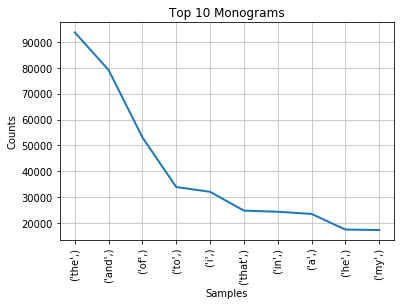

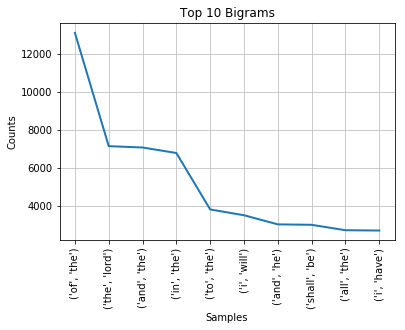

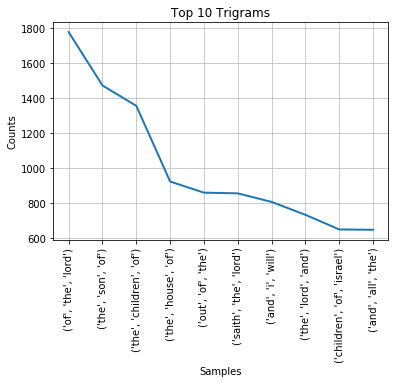

In [111]:
import nltk
from nltk import word_tokenize
from nltk.util import ngrams
import matplotlib.pyplot as plt

text = open('data/bibleshakes.nopunc.txt') 
text = text.read()
token = nltk.word_tokenize(text)
monogram = ngrams(token,1) # Tokenizes the text with 2 words as a pair called monograms
#print monogram
bigrams = ngrams(token,2) # Tokenizes the text with 2 words as a pair called bigrams
trigrams = ngrams(token,3) # Tokenizes the text with 2 words as a pair called trigrams
#as shown above creates frequnecy distribution of 
fdist = nltk.FreqDist(monogram)
fdist1 = nltk.FreqDist(bigrams)
fdist2 = nltk.FreqDist(trigrams)
plt.title("Top 10 Monograms")
fdist.plot(10,cumulative=False)
plt.title("Top 10 Bigrams")
fdist1.plot(10,cumulative=False)
plt.title("Top 10 Trigrams")
fdist2.plot(10,cumulative=False)

## For greater than a score of 3 
###  Create a TD - IDF implementation and 
### Analyze the following Sherlock Holmes book from Project Gutenberg text versions of :
The Adventures of Sherlock Holmes-  http://www.gutenberg.org/ebooks/1661.txt.utf-8

A Study in Scarlet - http://www.gutenberg.org/files/244/244-0.txt

The Hound of the Baskervilles - http://www.gutenberg.org/files/2852/2852-0.txt

The Return of Sherlock Holmes - http://www.gutenberg.org/files/108/108-0.txt

The Sign of the Four - http://www.gutenberg.org/ebooks/2097.txt.utf-8

### Display the scores for the top 20 highest frequencty terms and the relationship to the books

